####  Importing the libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib import style
from tensorflow.keras.models import Sequential #Build the model layer by layer
from tensorflow.keras.layers import Dense 
from tensorflow.keras.layers import LSTM
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
import math
from sklearn.metrics import mean_squared_error
style.use("fivethirtyeight")

# 1. Importing dataset

In [2]:
XOM_full_ds=pd.read_csv('dataset/XOM.csv')

### 1.1 Remove rows with outliers

In [3]:
open0xom = XOM_full_ds[XOM_full_ds['Open'] == 0]
print(open0xom)

#Remove rows with outliers
XOM_full_ds = XOM_full_ds.loc[XOM_full_ds['Date'] > '1969-12-31']

            Date  Open      High       Low     Close   Volume  Dividends  \
0     1962-01-02   0.0  0.101570  0.100822  0.100822   902400        0.0   
1     1962-01-03   0.0  0.102319  0.100822  0.102319  1200000        0.0   
2     1962-01-04   0.0  0.103068  0.102069  0.102569  1088000        0.0   
3     1962-01-05   0.0  0.103068  0.100073  0.100323  1222400        0.0   
4     1962-01-08   0.0  0.101071  0.098825  0.100073  1388800        0.0   
...          ...   ...       ...       ...       ...      ...        ...   
1982  1969-12-24   0.0  0.173276  0.171533  0.173276  1488000        0.0   
1983  1969-12-26   0.0  0.173276  0.171533  0.173276   899200        0.0   
1984  1969-12-29   0.0  0.173276  0.171533  0.171533  1833600        0.0   
1985  1969-12-30   0.0  0.173625  0.171533  0.171533  2534400        0.0   
1986  1969-12-31   0.0  0.173276  0.171533  0.172230  3414400        0.0   

      Stock Splits  
0              0.0  
1              0.0  
2              0.0  
3  

### 1.2 Create Average column

In [4]:
average=(XOM_full_ds['Open']+XOM_full_ds['High']+XOM_full_ds['Low']+XOM_full_ds['Close'])/4
y=average.values
XOM_full_ds.insert(8, "Average", average, True)

### 1.3 Drop OHLC column

In [5]:
#Drop columns - Date,Volume,Dividends,Stock Splits 
df=XOM_full_ds.drop(['Open', 'High', 'Low', 'Close','Dividends','Stock Splits','Volume'], axis=1)
XOM_full_ds=df

In [6]:
XOM_full_ds

,Date,Average
1987,1970-01-02,0.172492
1988,1970-01-05,0.174235
1989,1970-01-06,0.175194
1990,1970-01-07,0.174758
1991,1970-01-08,0.174584
...,...,...
15231,2022-07-06,83.320002
15232,2022-07-07,85.845001
15233,2022-07-08,86.315001
15234,2022-07-11,85.322500


In [7]:
#Pick up only 'Average' column
XOM_full_ds=df.reset_index()['Average'] 

### 1.4 Dateset Size

In [8]:
XOM_full_ds.shape 

(13249,)

# 2. Data Preprocessing

To build a (LSTM) model, we need to separate our stock prices data into a training set and a test set. Besides, we will also normalize our data so that all the values are in the same scale.

### 2.1 MinMaxScaler 

Use the Scikit-Learn MinMaxScaler to normalize all our stock data ranging from 0 to 1. We also reshape our normalized data into a two-dimensional array.

In [9]:
#LSTM are sensitive to the scale of the data , we use MinMaxScaler to scale the data range to 0 and 1
scaler=MinMaxScaler(feature_range=(0,1))
XOM_full_ds=scaler.fit_transform(np.array(XOM_full_ds).reshape(-1,1)) #Fit to data, then transform it

#### Exclude 30 days data 

In [10]:
XOM_full_ds1_Future=XOM_full_ds[-30:]
XOM_full_ds=XOM_full_ds[:-30] #Exclude 30 days

In [11]:
#df1 have already converted to array and have the values between 0 to 1
XOM_full_ds

array([[3.12553976e-04],
       [3.29314322e-04],
       [3.38531460e-04],
       ...,
       [8.98334444e-01],
       [9.16480433e-01],
       [9.28473582e-01]])

In [12]:
len(XOM_full_ds)

13219

### 2.2 Preparation of Training and Testing set

- We cannot use Cross Validation or Random Seed to split train and test because stock price always depent on previous date.
- Here we will only need the average prices from our dataset to train our (LSTM) model. We are going to extract 80% of the average prices from our acquired stock data as our training set.

In [13]:
training_size=int(len(XOM_full_ds)*0.8) #Split train into 80%
test_size=len(XOM_full_ds)-training_size 
train_data,test_data=XOM_full_ds[0:training_size,:],XOM_full_ds[training_size:len(XOM_full_ds),:1]

#### Training and Testing size 

In [14]:
training_size,test_size

(10575, 2644)

In [15]:
#Convert an array of values into a dataset matrix
def create_dataset(dataset,time_step=1): #timestep default is 1,more better timestep
    dataX,dataY=[],[]
    for i in range(len(dataset)-time_step-1):
        a=dataset[i:(i+time_step),0] #i=0 to 99(X_train) 100..(y_train)
        print(len(a))
        dataX.append(a)
        dataY.append(dataset[i+time_step,0])
        print(f'({i})')
        print(f'DataX \n----------------\n {a}\n')
        print(f'DataY \n----------------\n {dataset[i+time_step,0]}\n')
        print('========================================================')
    return np.array(dataX),np.array(dataY) #Return as array

In [16]:
#Reshape into X=t,t+1,t+2..t+99 and Y=t+100
#Converting independent and dependent feature based on time steps
time_step=100 #Predict based on 100 days
X_train,y_train=create_dataset(train_data,time_step)
X_test,ytest=create_dataset(test_data,time_step)

100
(0)
DataX 
----------------
 [3.12553976e-04 3.29314322e-04 3.38531460e-04 3.34341037e-04
 3.32665086e-04 3.35179674e-04 3.34341857e-04 3.25962451e-04
 3.20096917e-04 3.14231380e-04 3.10879225e-04 3.11717326e-04
 3.12555384e-04 3.07527129e-04 2.98309355e-04 2.80711468e-04
 2.70658228e-04 2.61440250e-04 2.37140502e-04 1.89376367e-04
 1.68428469e-04 1.60886485e-04 1.71780056e-04 1.83510796e-04
 1.80159111e-04 1.49992096e-04 1.39937148e-04 1.02229182e-04
 8.21199783e-05 6.70360662e-05 4.94394062e-05 8.37911758e-06
 0.00000000e+00 4.60880619e-05 9.88787088e-05 1.08933895e-04
 1.39100957e-04 1.25692190e-04 1.18989614e-04 1.08933576e-04
 1.01392330e-04 8.46323720e-05 8.71474953e-05 9.80403249e-05
 8.96611813e-05 7.87678186e-05 8.46341338e-05 1.19828126e-04
 1.18151435e-04 1.15637340e-04 1.12284144e-04 1.13122039e-04
 1.27368779e-04 1.31558461e-04 1.30719895e-04 1.32396603e-04
 1.46641447e-04 1.75969820e-04 1.91052717e-04 1.96918561e-04
 1.93566648e-04 1.95242727e-04 1.96918723e-04 1.9608

100
(234)
DataX 
----------------
 [0.000675   0.00068553 0.00069343 0.00068641 0.00067149 0.00067675
 0.00068553 0.00067675 0.00065042 0.00060302 0.00063198 0.00065393
 0.00066359 0.00066008 0.0006513  0.00064691 0.00065481 0.000675
 0.00069694 0.00070748 0.00070221 0.00069256 0.00068729 0.00067851
 0.00066271 0.00061355 0.00061355 0.00057844 0.00055825 0.00056
 0.00055737 0.00056966 0.00058634 0.00059424 0.00061706 0.00062145
 0.00061882 0.00061443 0.00060565 0.0006276  0.00066095 0.00066359
 0.00064427 0.00062672 0.00063637 0.0006708  0.00068681 0.00070459
 0.00070726 0.00070726 0.00075083 0.00077305 0.00078195 0.00077572
 0.00076594 0.0007695  0.00077217 0.00079795 0.00078995 0.00078106
 0.00078461 0.00079528 0.00083707 0.00087352 0.00087442 0.0008513
 0.00080951 0.00081751 0.00082285 0.00083885 0.00086641 0.0008593
 0.00086108 0.00084596 0.00084241 0.00085485 0.00085219 0.0008433
 0.00085396 0.00086997 0.00088597 0.00091176 0.00091976 0.00091442
 0.00092954 0.00095088 0.00095266 0

DataX 
----------------
 [0.00072421 0.0006987  0.00072148 0.00073059 0.00072512 0.00071055
 0.00070599 0.00070052 0.00068412 0.00068959 0.00071875 0.00074334
 0.00074288 0.00072994 0.00071792 0.00070312 0.00068371 0.00066891
 0.00066984 0.00066799 0.00067631 0.00068925 0.00069295 0.0007022
 0.00068093 0.00066706 0.00066984 0.00069573 0.0006985  0.00069942
 0.00071699 0.00075028 0.00076322 0.00074658 0.00074288 0.00074473
 0.00074843 0.00076322 0.00077247 0.00079836 0.00084458 0.00083996
 0.00084089 0.00083534 0.00081592 0.00080298 0.00081407 0.00083349
 0.00084366 0.00083904 0.00083811 0.00082517 0.00083534 0.00087972
 0.00091393 0.00091485 0.00088989 0.00088249 0.00087972 0.00086862
 0.00086862 0.00087972 0.00090283 0.00091947 0.00094166 0.00091947
 0.00088157 0.00085475 0.00086215 0.00088157 0.00088896 0.00088619
 0.00087694 0.00088619 0.00090191 0.0009209  0.00093027 0.00092746
 0.00092652 0.00093401 0.0009415  0.00094805 0.0009518  0.00096491
 0.00097052 0.00095929 0.00095554 0.00

100
(545)
DataX 
----------------
 [0.0009621  0.00095742 0.00093307 0.00091622 0.0009106  0.00089281
 0.00089469 0.00090498 0.00092746 0.00095461 0.00092933 0.00088064
 0.00088064 0.0008769  0.00086566 0.0008666  0.00086192 0.00084881
 0.00083102 0.00082915 0.00081698 0.00078796 0.00076549 0.00072616
 0.00074302 0.00077672 0.00077859 0.00078795 0.00077766 0.00077204
 0.00077017 0.00077953 0.00078702 0.00077953 0.00078702 0.00078328
 0.00077485 0.0007711  0.00076361 0.00077298 0.0007711  0.00076174
 0.00075706 0.00074582 0.00074114 0.00074208 0.00074863 0.00076923
 0.00081305 0.00082159 0.00082254 0.0008121  0.00080545 0.00082064
 0.00082443 0.00082159 0.00082253 0.00081779 0.00081779 0.00083962
 0.00086334 0.00085954 0.00087378 0.00091174 0.00093166 0.00096392
 0.00095064 0.00093451 0.0008994  0.00086144 0.00083202 0.00081779
 0.00082254 0.0008102  0.00081969 0.00085575 0.00090319 0.00090983
 0.00089845 0.00090889 0.00091458 0.00092787 0.00092597 0.00091838
 0.00089845 0.00088801 0.00


DataY 
----------------
 0.0012359020359061044

100
(617)
DataX 
----------------
 [0.00082254 0.0008102  0.00081969 0.00085575 0.00090319 0.00090983
 0.00089845 0.00090889 0.00091458 0.00092787 0.00092597 0.00091838
 0.00089845 0.00088801 0.00088327 0.0008937  0.00090699 0.00090604
 0.00091173 0.00092787 0.00092217 0.00091078 0.0008937  0.00090035
 0.00091458 0.00092122 0.00092502 0.00092786 0.00094589 0.00094969
 0.00096392 0.00100093 0.00095633 0.00092692 0.00094305 0.00095633
 0.00096203 0.00094779 0.00096487 0.00098765 0.00101108 0.00100435
 0.00099186 0.00097553 0.0009688  0.001013   0.00106584 0.00106008
 0.00105816 0.0010668  0.00108986 0.00110427 0.00113502 0.0011331
 0.00110139 0.00107929 0.00108122 0.00108122 0.00109851 0.0011331
 0.00115039 0.00114463 0.00115039 0.00114367 0.00114943 0.00113022
 0.00109371 0.00109947 0.00110812 0.00111484 0.00110908 0.00111292
 0.00110428 0.00108314 0.00106488 0.00106776 0.00107449 0.00109178
 0.00111677 0.00114655 0.00115616 0.00118594 0.

DataX 
----------------
 [0.00121957 0.00121189 0.00119747 0.00121284 0.00121765 0.00120516
 0.00119939 0.00119747 0.00118018 0.00118594 0.00122053 0.00122534
 0.00123494 0.00124263 0.00124551 0.0012532  0.00125608 0.0012359
 0.00120804 0.00120996 0.00125512 0.00128452 0.00129035 0.00131561
 0.00132047 0.00130978 0.00131755 0.0013331  0.00134379 0.00136711
 0.00137488 0.0013846  0.00136808 0.00136516 0.00139431 0.00141958
 0.00140986 0.00138848 0.00135545 0.00135933 0.00138848 0.00138654
 0.00138265 0.00138751 0.00139626 0.00140403 0.00139237 0.00138654
 0.00138363 0.00137196 0.00135447 0.00133504 0.00132533 0.00131075
 0.00129423 0.00131366 0.0013399  0.00134962 0.00136419 0.0013846
 0.00141666 0.00142929 0.00144581 0.00145456 0.00145941 0.00146136
 0.00147787 0.00150799 0.00151577 0.00148079 0.00148467 0.0015148
 0.00154395 0.00157698 0.00155658 0.00154298 0.00153715 0.00156435
 0.00156921 0.00158961 0.00161099 0.00160127 0.00160168 0.00157321
 0.00151923 0.00150157 0.00156438 0.0015


DataY 
----------------
 0.0017686082702872824

100
(784)
DataX 
----------------
 [0.00150157 0.00156438 0.00157518 0.0015369  0.00146623 0.00142207
 0.00142697 0.00145544 0.0014731  0.00146231 0.00146525 0.00146034
 0.00145838 0.00145249 0.0014731  0.00145642 0.00146918 0.00149371
 0.00144758 0.00148292 0.00147408 0.00147997 0.00151629 0.00155064
 0.00154377 0.00151923 0.00149371 0.00151334 0.00152807 0.00148586
 0.00147506 0.00148488 0.00154181 0.00157714 0.00162033 0.00163014
 0.00160855 0.0016164  0.00163505 0.00161738 0.00162621 0.00165566
 0.0017116  0.00177933 0.00180681 0.00175872 0.00172927 0.00171946
 0.00176362 0.00181564 0.00182251 0.00186766 0.0018814  0.00183527
 0.00174596 0.00169688 0.00166646 0.00169001 0.0017468  0.00181717
 0.00180726 0.00179041 0.00170914 0.00167246 0.00166453 0.0016001
 0.0016001  0.0016338  0.00164966 0.00163578 0.00163876 0.00163579
 0.00162488 0.0016675  0.0017131  0.00170914 0.00166255 0.00163479
 0.00161993 0.00161696 0.00163579 0.00165858 0


DataY 
----------------
 0.0016547169023194291

100
(862)
DataX 
----------------
 [0.00161993 0.00161696 0.00163579 0.00165858 0.00169526 0.00176663
 0.00177257 0.00178843 0.00177059 0.00171607 0.00168237 0.00166156
 0.00165957 0.00167841 0.00165958 0.00166949 0.00167345 0.00169229
 0.00173094 0.00176365 0.00178744 0.00176861 0.00174977 0.0017359
 0.00173392 0.00170121 0.00169228 0.00167444 0.00166949 0.00162785
 0.00161002 0.00164074 0.00159713 0.00154658 0.00156838 0.00161001
 0.00164173 0.00168634 0.00172301 0.00173292 0.0017359  0.0017131
 0.0016794  0.00163766 0.00161059 0.0016146  0.00165772 0.00166274
 0.00167577 0.00166474 0.00165371 0.00162262 0.00158051 0.00156446
 0.00154942 0.00157148 0.00153337 0.00148223 0.00149025 0.00146217
 0.00144713 0.0014712  0.0015063  0.00151232 0.00150329 0.0014742
 0.00145716 0.00146418 0.0014702  0.00146919 0.00145014 0.00142507
 0.00139899 0.00139799 0.0014381  0.0014351  0.00148925 0.00153438
 0.00153738 0.00156145 0.00158051 0.00159053 0.0


DataY 
----------------
 0.001428137499867055

100
(936)
DataX 
----------------
 [0.0014381  0.0014351  0.00148925 0.00153438 0.00153738 0.00156145
 0.00158051 0.00159053 0.00164268 0.0016477  0.00165772 0.00169784
 0.00173394 0.00174497 0.00172993 0.00167277 0.0015775  0.00155844
 0.00159254 0.00166073 0.0016146  0.00158351 0.0015775  0.00151532
 0.00155042 0.00165472 0.00166474 0.00169884 0.00169483 0.00171789
 0.00173996 0.00173795 0.00170686 0.00169784 0.00170082 0.0016622
 0.00165001 0.00166017 0.00172826 0.00169675 0.00166423 0.00167135
 0.00172216 0.0017313  0.00177703 0.00173029 0.00159209 0.00155753
 0.00155042 0.0015301  0.00150469 0.0015616  0.0015992  0.00157887
 0.00154636 0.00153924 0.00152603 0.00149961 0.00156058 0.00161343
 0.00163578 0.00157075 0.0015494  0.00157684 0.00159615 0.00162969
 0.00162156 0.00160428 0.00156262 0.00153416 0.0015992  0.00165306
 0.00170996 0.00171708 0.00175773 0.0018502  0.00185121 0.00182073
 0.00178923 0.00169269 0.00159412 0.00152502 0.


DataY 
----------------
 0.0010679723020154367

100
(1011)
DataX 
----------------
 [0.0018502  0.00185121 0.00182073 0.00178923 0.00169269 0.00159412
 0.00152502 0.00145287 0.00147116 0.00154636 0.00160733 0.00154229
 0.0014488  0.00148437 0.00151079 0.00147929 0.00147116 0.00143762
 0.00143458 0.00150469 0.00149047 0.00145287 0.00144075 0.0014356
 0.00142814 0.00143972 0.00144692 0.00138722 0.00129766 0.00130178
 0.00129458 0.0013409  0.00137178 0.00135016 0.00139237 0.00145825
 0.00143972 0.00143251 0.00142016 0.00139957 0.00140163 0.00141295
 0.00147677 0.0015128  0.00150663 0.00149839 0.00153545 0.00155192
 0.00155295 0.00156427 0.00156427 0.00151486 0.00144487 0.00143663
 0.00141913 0.00136869 0.00136252 0.00139031 0.0013934  0.00137075
 0.00135016 0.0013131  0.00130178 0.00129869 0.00130796 0.00130281
 0.00129869 0.00130796 0.00130384 0.00126369 0.00124723 0.00126266
 0.00130384 0.00133266 0.00129972 0.00127296 0.00125752 0.00122973
 0.00121325 0.00122561 0.0012112  0.00119679 

100
(1100)
DataX 
----------------
 [0.0012705  0.00124023 0.00123605 0.00119847 0.00114731 0.00109511
 0.00104083 0.00104083 0.00108989 0.00105544 0.00106797 0.00106066
 0.00102725 0.00103039 0.00106379 0.00112226 0.00117446 0.00118803
 0.00122144 0.00126111 0.00125171 0.00124963 0.00122666 0.00119847
 0.00113792 0.00108676 0.0010805  0.00106066 0.00104083 0.00102412
 0.0010116  0.0010283  0.00103039 0.0010116  0.00100533 0.00100533
 0.00100638 0.00100637 0.00100429 0.00096983 0.00094478 0.00093643
 0.00093016 0.00097401 0.00100742 0.00100846 0.00102099 0.00105544
 0.00103769 0.00108885 0.00117133 0.00120682 0.00122979 0.00120369
 0.00117655 0.00116924 0.00116193 0.00117028 0.00119221 0.00122457
 0.00129543 0.00129118 0.00129118 0.00124237 0.00122221 0.00119886
 0.00116278 0.0011214  0.00108426 0.0010312  0.00103757 0.0010121
 0.00097602 0.00098451 0.00098451 0.00098664 0.00097815 0.00093146
 0.00092509 0.00089856 0.00078184 0.00081579 0.00086885 0.00085293
 0.00082004 0.00085293 0.00


DataY 
----------------
 0.0008015101907775741

100
(1159)
DataX 
----------------
 [0.00122457 0.00129543 0.00129118 0.00129118 0.00124237 0.00122221
 0.00119886 0.00116278 0.0011214  0.00108426 0.0010312  0.00103757
 0.0010121  0.00097602 0.00098451 0.00098451 0.00098664 0.00097815
 0.00093146 0.00092509 0.00089856 0.00078184 0.00081579 0.00086885
 0.00085293 0.00082004 0.00085293 0.00084232 0.00083383 0.0008593
 0.00089326 0.00088371 0.00093146 0.00091342 0.00084338 0.0007691
 0.00075955 0.00070437 0.00068633 0.00065344 0.0006354  0.00059826
 0.00054308 0.00053778 0.00061842 0.00068527 0.00075637 0.00085505
 0.00085081 0.00090811 0.00090387 0.00087522 0.00087097 0.0009304
 0.0009548  0.00099725 0.00094737 0.00090068 0.00088901 0.00088052
 0.00094101 0.00101953 0.00100574 0.00098239 0.00101102 0.00102079
 0.00105553 0.00105227 0.00104033 0.00104033 0.00103925 0.00097737
 0.00095674 0.00094046 0.0008623  0.0007874  0.0007418  0.00069838
 0.00072335 0.00072878 0.0007418  0.00079391 0.

(1255)
DataX 
----------------
 [0.00083191 0.00081671 0.00079065 0.00080151 0.00084059 0.00085579
 0.00084493 0.00087207 0.00093612 0.00097628 0.00097954 0.00096977
 0.00097411 0.00096869 0.00103165 0.00105119 0.00104033 0.00104576
 0.00104142 0.00100668 0.00099474 0.00100668 0.00099908 0.00103708
 0.00106313 0.00114455 0.00118037 0.00119991 0.00120751 0.00117929
 0.00121728 0.00125093 0.00126691 0.00125477 0.0012349  0.0012371
 0.00122717 0.00121172 0.00123821 0.00125477 0.00126691 0.00128898
 0.00137177 0.00139605 0.00136073 0.00133645 0.00134969 0.00137839
 0.0013817  0.00139715 0.00143027 0.00136956 0.00132099 0.00133645
 0.00136073 0.00139274 0.00137839 0.00134417 0.00134859 0.00133093
 0.00127463 0.00120289 0.00122496 0.00122938 0.00117198 0.00116646
 0.00122828 0.00126691 0.00131652 0.00131765 0.00130417 0.00125814
 0.00120873 0.00119189 0.00121098 0.00126599 0.00130754 0.00132887
 0.00139512 0.00143442 0.00142993 0.001458   0.00145126 0.00144565
 0.00146811 0.00147148 0.001490


DataY 
----------------
 0.002012056806551466

100
(1356)
DataX 
----------------
 [0.00169486 0.00166066 0.00164243 0.00163104 0.00159571 0.00159115
 0.00162648 0.0016732  0.00170739 0.00173816 0.00183047 0.00189202
 0.0018772  0.00183617 0.00181338 0.0018601  0.00185327 0.00184187
 0.00190569 0.00192506 0.001949   0.00200598 0.00197293 0.00191025
 0.00192278 0.00196837 0.00196723 0.00199572 0.00198319 0.00199687
 0.0020037  0.00201624 0.00200826 0.00199572 0.00199686 0.00197293
 0.00192962 0.00193532 0.00195584 0.00197635 0.00200028 0.00199686
 0.00195926 0.00191367 0.00189999 0.00189771 0.00185099 0.00185327
 0.00184871 0.00184187 0.00184073 0.00184985 0.00184643 0.00184301
 0.00183959 0.00183161 0.00182819 0.00185365 0.00185596 0.00184902
 0.00183052 0.00186405 0.00188371 0.00185712 0.00183862 0.00185133
 0.00185596 0.00182474 0.00180162 0.0018074  0.00180624 0.00180509
 0.00179005 0.00181318 0.00186406 0.00186984 0.00185249 0.00184209
 0.00184324 0.00184902 0.00185943 0.00184902 


DataY 
----------------
 0.0020834142256758456

100
(1431)
DataX 
----------------
 [0.00186984 0.00185249 0.00184209 0.00184324 0.00184902 0.00185943
 0.00184902 0.00185365 0.00185018 0.00183515 0.00183862 0.00183746
 0.00187215 0.00195887 0.0019635  0.00199356 0.00206062 0.00202478
 0.00200859 0.00196812 0.00191377 0.00188487 0.00189643 0.00195425
 0.00201206 0.00201322 0.00204443 0.00208143 0.00204212 0.00204559
 0.00209184 0.00208143 0.00211265 0.0020745  0.00205715 0.00209762
 0.00207334 0.00206294 0.00202709 0.00196118 0.00198546 0.00198778
 0.00197968 0.00196581 0.00194615 0.00194268 0.00195675 0.00192626
 0.00191806 0.00189694 0.00192744 0.00195676 0.00198373 0.00196379
 0.00196262 0.00198373 0.00195793 0.00191336 0.00184652 0.00182423
 0.00187114 0.00188873 0.00188874 0.00187466 0.00185238 0.00180899
 0.00180195 0.00180899 0.00180899 0.00183245 0.00186762 0.00188991
 0.00188756 0.00189694 0.00192744 0.00194385 0.00194151 0.00194737
 0.00192626 0.00190985 0.00193799 0.00196145

DataY 
----------------
 0.0022982868175752255

100
(1503)
DataX 
----------------
 [0.00188756 0.00189694 0.00192744 0.00194385 0.00194151 0.00194737
 0.00192626 0.00190985 0.00193799 0.00196145 0.00198959 0.00200132
 0.00198608 0.00201539 0.00207169 0.00210335 0.0021057  0.00209983
 0.0021057  0.00210687 0.00210335 0.00206817 0.00207051 0.00205409
 0.00208693 0.00210922 0.00210335 0.00208341 0.00208459 0.0020928
 0.00209279 0.00210921 0.0021057  0.00208811 0.00207403 0.00209866
 0.00214373 0.00215086 0.00211995 0.00208428 0.00204505 0.00203197
 0.00201889 0.00200106 0.0019321  0.00194637 0.00201651 0.00202721
 0.00204742 0.0020605  0.00203672 0.00201651 0.00198204 0.00199392
 0.00201889 0.00203078 0.00201889 0.00199273 0.00199036 0.00199154
 0.00197966 0.00202364 0.00202365 0.00198441 0.00199987 0.00202484
 0.0020284  0.00203435 0.00205931 0.00210449 0.00221506 0.00223884
 0.00221863 0.00218772 0.00217226 0.00219247 0.00222457 0.00221149
 0.00225311 0.00224835 0.0021889  0.0021247  0

(1581)
DataX 
----------------
 [0.00225311 0.00224835 0.0021889  0.0021247  0.00210093 0.00207834
 0.00210806 0.00216869 0.00215918 0.00219842 0.00226143 0.0022971
 0.00227926 0.0022329  0.00220555 0.00222457 0.00225786 0.0022864
 0.00226143 0.00221863 0.00224835 0.00229829 0.0023292  0.0023827
 0.00246137 0.00243604 0.00243725 0.00245051 0.00241675 0.00240951
 0.00244931 0.00247825 0.00253011 0.00255784 0.00250599 0.00247464
 0.00249634 0.00250599 0.0025289  0.00255302 0.00257352 0.00261452
 0.00258799 0.00255061 0.00254337 0.00253976 0.00257352 0.00264226
 0.00268808 0.00265552 0.00263382 0.00266517 0.00268929 0.00268446
 0.0026712  0.00264587 0.00265673 0.00265552 0.0026712  0.00265914
 0.00268326 0.00269532 0.0026929  0.00269893 0.0026929  0.00269411
 0.00268687 0.00268446 0.00272064 0.00270617 0.00267723 0.00268205
 0.00270376 0.00269652 0.00271461 0.00274235 0.00279903 0.00280747
 0.00274476 0.00270859 0.00270135 0.00272306 0.00275923 0.00277853
 0.00284365 0.00287018 0.00283641


DataY 
----------------
 0.002795333786862455

100
(1665)
DataX 
----------------
 [0.00284365 0.00287018 0.00283641 0.00283488 0.00283244 0.00281534
 0.00279823 0.00278113 0.00276158 0.00277624 0.00279334 0.00277868
 0.00272249 0.00264186 0.00263941 0.00263452 0.00268828 0.00266629
 0.00271271 0.00276647 0.00278846 0.0027909  0.00280068 0.00282266
 0.00286176 0.00283977 0.00282022 0.0028642  0.00287153 0.00288864
 0.00291796 0.00299614 0.00302058 0.00305723 0.00306945 0.00304746
 0.00302302 0.00302791 0.00301325 0.00300103 0.00301081 0.00297416
 0.00295705 0.00295461 0.00292773 0.00292529 0.00291307 0.0028471
 0.00279823 0.00282022 0.00283977 0.00281534 0.00282755 0.00282755
 0.00282755 0.00279823 0.0027176  0.00265652 0.00268828 0.00272249
 0.00274204 0.00274936 0.00277869 0.00273715 0.00272249 0.00267397
 0.00255262 0.00249813 0.00246098 0.00248079 0.00249813 0.00251547
 0.00258977 0.00262444 0.00265169 0.00265664 0.00265416 0.00264921
 0.0026715  0.00274085 0.00272351 0.00269875 0

DataY 
----------------
 0.0027354807401431874

100
(1731)
DataX 
----------------
 [0.00255262 0.00249813 0.00246098 0.00248079 0.00249813 0.00251547
 0.00258977 0.00262444 0.00265169 0.00265664 0.00265416 0.00264921
 0.0026715  0.00274085 0.00272351 0.00269875 0.00273341 0.00272847
 0.00269627 0.00272351 0.00270865 0.00272103 0.00276314 0.00280524
 0.00283496 0.00283496 0.0028201  0.00280524 0.00281762 0.00278047
 0.00275075 0.00275818 0.00275818 0.00279533 0.00286964 0.00287211
 0.00287459 0.00289193 0.00290926 0.00287211 0.00284982 0.00284982
 0.00283249 0.00286716 0.00286716 0.00283496 0.00283496 0.0028201
 0.00279781 0.00278543 0.00279038 0.00279286 0.00276561 0.00277305
 0.00284487 0.00286716 0.00286964 0.00286716 0.00288698 0.00292908
 0.00299099 0.00297366 0.00293891 0.00294645 0.00294394 0.00288366
 0.00283594 0.00281585 0.00283594 0.00285101 0.00285101 0.00280581
 0.00274051 0.00269781 0.00271288 0.00271539 0.0027179  0.00272544
 0.00278571 0.00283343 0.00284348 0.00284348 0


DataY 
----------------
 0.0031053257982382766

100
(1808)
DataX 
----------------
 [0.00272544 0.00278571 0.00283343 0.00284348 0.00284348 0.0028485
 0.00283092 0.00281334 0.0028259  0.00286106 0.00286106 0.00288115
 0.0028485  0.00281585 0.00279074 0.00277065 0.00274804 0.00268023
 0.00266767 0.00268274 0.00269278 0.002738   0.00273548 0.00272042
 0.00274302 0.00273799 0.0027179  0.00271539 0.00271037 0.00275306
 0.00279325 0.00282841 0.00286859 0.00288115 0.00287613 0.00286608
 0.00285101 0.00286608 0.00283594 0.00276813 0.0027606  0.00278822
 0.0028058  0.00280078 0.0028259  0.00287613 0.00287864 0.00289371
 0.00287864 0.00288111 0.00287347 0.00285054 0.00281742 0.0028378
 0.00286073 0.00286583 0.00288366 0.00290659 0.00291678 0.00288111
 0.00284544 0.00283525 0.00282251 0.00282761 0.00282761 0.00282251
 0.00281487 0.00280978 0.00279194 0.00278175 0.00279704 0.00280723
 0.00280213 0.00283016 0.0028964  0.00292952 0.00291678 0.00290659
 0.00290404 0.00291678 0.00291678 0.00290405 0

(1885)
DataX 
----------------
 [0.00290659 0.00290404 0.00291678 0.00291678 0.00290405 0.00292188
 0.00294481 0.00297029 0.0029601  0.00299067 0.00300851 0.00298302
 0.00297538 0.00299577 0.00298812 0.00294481 0.00291933 0.0029499
 0.00300596 0.00306966 0.00311552 0.00314099 0.00310533 0.00309513
 0.00300596 0.0028913  0.0028429  0.00283271 0.00284799 0.00286073
 0.00285818 0.00286328 0.00288366 0.00288111 0.00287602 0.00290176
 0.00287849 0.00285264 0.00281645 0.00282162 0.00281128 0.00278801
 0.0027725  0.0027027  0.00266134 0.0026846  0.00266392 0.00261739
 0.00256568 0.00260963 0.00265099 0.00264324 0.00267168 0.00268202
 0.00270011 0.00275181 0.00275182 0.0027027  0.00267168 0.00264841
 0.0026329  0.00265875 0.00266133 0.00266392 0.00267943 0.0026846
 0.00264582 0.0026329  0.00262256 0.00262514 0.00261739 0.0026329
 0.00264841 0.00264841 0.00266133 0.00264065 0.00264841 0.00264582
 0.00262773 0.00259153 0.00251139 0.0024933  0.00249329 0.00250622
 0.00253207 0.00250881 0.00250364


DataY 
----------------
 0.0025586249927491813

100
(1974)
DataX 
----------------
 [0.00246744 0.00248037 0.00250622 0.00251915 0.00254758 0.00253725
 0.00253466 0.00254759 0.00261301 0.00259199 0.0025631  0.00254208
 0.00259199 0.0027391  0.00274435 0.00272334 0.00270495 0.00267343
 0.00267343 0.00264978 0.00264716 0.00265241 0.0026419  0.00262614
 0.00257623 0.00254996 0.00254996 0.0024948  0.00247378 0.00246064
 0.00246328 0.00251319 0.00256573 0.0026025  0.00259987 0.00258937
 0.00257886 0.00258148 0.00257886 0.00255259 0.00254471 0.00256047
 0.00257098 0.00262614 0.00265767 0.00266029 0.00268656 0.00266292
 0.00258148 0.00254208 0.0025053  0.00245014 0.00237921 0.00234506
 0.00241074 0.00239497 0.00237921 0.00234244 0.00233193 0.00234506
 0.00233981 0.00233193 0.00231879 0.00232667 0.00232142 0.00232142
 0.00238709 0.0024659  0.00252895 0.00258674 0.0025132  0.00247044
 0.00251854 0.00256932 0.00253725 0.00253725 0.00251854 0.00248113
 0.00245173 0.00243035 0.00243035 0.00244639


DataY 
----------------
 0.002737360407682872

100
(2032)
DataX 
----------------
 [0.00233193 0.00234506 0.00233981 0.00233193 0.00231879 0.00232667
 0.00232142 0.00232142 0.00238709 0.0024659  0.00252895 0.00258674
 0.0025132  0.00247044 0.00251854 0.00256932 0.00253725 0.00253725
 0.00251854 0.00248113 0.00245173 0.00243035 0.00243035 0.00244639
 0.00247044 0.00247845 0.00249983 0.00248112 0.00241699 0.00242234
 0.00243837 0.00244639 0.00244906 0.00244638 0.00244639 0.00242501
 0.00245173 0.00252923 0.00252656 0.0025319  0.00252923 0.00255862
 0.0026094  0.00255862 0.00252923 0.00252923 0.00251319 0.00250518
 0.00252388 0.00249716 0.00248113 0.0024544  0.00246509 0.00250251
 0.00251587 0.00250518 0.00252656 0.0025319  0.00252656 0.00252656
 0.00261208 0.00271095 0.00266552 0.00266285 0.00269759 0.00268156
 0.00270561 0.00277509 0.00275371 0.00271095 0.00267087 0.00272164
 0.00274035 0.00274035 0.00268957 0.0027644  0.00286328 0.00281343
 0.00280256 0.00281071 0.00284331 0.00283516 


DataY 
----------------
 0.003117951487671731

100
(2124)
DataX 
----------------
 [0.00273464 0.00271834 0.00271291 0.00274008 0.00277268 0.00275638
 0.00275638 0.00273736 0.00272106 0.00271834 0.00272378 0.00263956
 0.00259881 0.00255534 0.00254991 0.00253361 0.00252275 0.00250645
 0.00246026 0.0024494  0.00247113 0.00247656 0.00246298 0.00247113
 0.00244125 0.00244125 0.00246026 0.0024983  0.0025472  0.00257708
 0.00255263 0.00257436 0.0026124  0.00256621 0.00255806 0.00258523
 0.00256349 0.00253905 0.00255263 0.00259881 0.00264228 0.00265586
 0.00268846 0.00270204 0.00278626 0.00285689 0.00279984 0.00284059
 0.00283586 0.00284692 0.00279161 0.00276672 0.00286352 0.00287181
 0.0029133  0.00291883 0.00289947 0.00291053 0.00293819 0.0029852
 0.00299903 0.00305988 0.00305988 0.00304605 0.00304605 0.00302945
 0.00305987 0.00313731 0.00320645 0.00320922 0.00322028 0.00325347
 0.00328388 0.00329495 0.00320092 0.00311795 0.00311519 0.00311242
 0.00309306 0.00307923 0.00311242 0.00313731 0


DataY 
----------------
 0.0031952999791631607

100
(2200)
DataX 
----------------
 [0.00311519 0.00311242 0.00309306 0.00307923 0.00311242 0.00313731
 0.00320369 0.00321751 0.00321475 0.00325623 0.00327559 0.00327559
 0.00325623 0.00327006 0.00328666 0.00332537 0.00330878 0.00331707
 0.00331431 0.00329495 0.00325623 0.00316497 0.00312902 0.00311795
 0.003082   0.0030018  0.00302669 0.00302945 0.00305434 0.00301563
 0.00296861 0.00296031 0.00301286 0.00306817 0.00320368 0.00316857
 0.00305051 0.00303927 0.00310954 0.00312078 0.00308706 0.00303084
 0.00303646 0.00307862 0.00313765 0.00317138 0.00316576 0.00316295
 0.00318262 0.003177   0.00315733 0.00309549 0.00306457 0.00313765
 0.00316295 0.00317419 0.00321354 0.00316576 0.00313484 0.00314046
 0.00313203 0.00312079 0.00312079 0.00312922 0.00305614 0.00309267
 0.00307862 0.0030477  0.00306176 0.00307581 0.00307581 0.00307581
 0.00307581 0.003073   0.0030983  0.00315171 0.00317419 0.00316295
 0.00317419 0.00314327 0.00310392 0.0031236 

DataX 
----------------
 [0.00307581 0.003073   0.0030983  0.00315171 0.00317419 0.00316295
 0.00317419 0.00314327 0.00310392 0.0031236  0.00311797 0.00310392
 0.00308706 0.00308143 0.00307581 0.00307581 0.00310673 0.00312079
 0.00317138 0.00324446 0.00326695 0.00327257 0.00326414 0.00324727
 0.00324727 0.00315238 0.00317527 0.0031953  0.00322105 0.00326969
 0.00327256 0.00331548 0.00331834 0.00329259 0.00330117 0.00331834
 0.00334409 0.00331261 0.00326683 0.00326683 0.00323536 0.00317813
 0.00320961 0.00321819 0.00327828 0.00333264 0.00336984 0.00340418
 0.00344424 0.0034471  0.00351005 0.00353008 0.00353294 0.00356728
 0.00360162 0.00358445 0.00356728 0.00354439 0.00346141 0.00343279
 0.00346713 0.00349575 0.00349002 0.00347857 0.00346141 0.00349288
 0.00354152 0.00356442 0.0036102  0.00356442 0.00356728 0.00356156
 0.00354439 0.0034843  0.00345569 0.00345283 0.00344138 0.0034099
 0.00343566 0.00349002 0.00354439 0.00355011 0.0035215  0.00352722
 0.0035215  0.00356442 0.00360448 0.00

DataX 
----------------
 [0.00352722 0.0035215  0.00356442 0.00360448 0.00357014 0.00349002
 0.00339096 0.0034026  0.00337931 0.0033502  0.00330653 0.00326868
 0.00325703 0.00334728 0.00346374 0.00348703 0.0035045  0.00347538
 0.00338222 0.0033764  0.00338513 0.00334437 0.00328906 0.00328615
 0.00331235 0.00337931 0.00347247 0.00350741 0.00347247 0.00346956
 0.00349285 0.00339678 0.00332982 0.00334438 0.00338222 0.00339969
 0.00340842 0.00343754 0.0034783  0.00347538 0.0035045  0.00352197
 0.00356855 0.00364133 0.00366753 0.00361804 0.00366753 0.00370538
 0.00378107 0.00382183 0.0037636  0.00364715 0.00362968 0.0036355
 0.00363259 0.00354234 0.0035831  0.00353943 0.00350159 0.00353361
 0.00365297 0.00371994 0.00374031 0.00376651 0.00375196 0.00375195
 0.00375778 0.00372867 0.00373449 0.00380824 0.00376377 0.00372818
 0.00368666 0.00373114 0.00377563 0.00376673 0.00374597 0.00373708
 0.00377266 0.00380528 0.00382901 0.00386162 0.00387052 0.00397431
 0.00403955 0.00404549 0.00403362 0.00


DataY 
----------------
 0.003992081004077308

100
(2426)
DataX 
----------------
 [0.00372818 0.00368666 0.00373114 0.00377563 0.00376673 0.00374597
 0.00373708 0.00377266 0.00380528 0.00382901 0.00386162 0.00387052
 0.00397431 0.00403955 0.00404549 0.00403362 0.00399507 0.003915
 0.003829   0.00389128 0.00398024 0.00407811 0.00407217 0.00404548
 0.00398914 0.00403065 0.00410183 0.00406921 0.00408107 0.00421155
 0.00429755 0.00423528 0.00419376 0.004259   0.0042679  0.00427679
 0.00420858 0.00417893 0.0041641  0.00412851 0.00424417 0.00438355
 0.00427976 0.00411369 0.00414038 0.00409886 0.00403955 0.00405438
 0.00408107 0.00414334 0.00411369 0.00403362 0.00395949 0.00394169
 0.00396838 0.00396838 0.00404252 0.0040959  0.00414038 0.00414334
 0.00423691 0.00421272 0.00417343 0.00410694 0.0040616  0.004116
 0.00424598 0.00430038 0.00423086 0.00429433 0.00430038 0.00429434
 0.00427318 0.00419157 0.00415832 0.00417948 0.00415228 0.00419459
 0.00427317 0.00426411 0.00422179 0.00423086 0.00


DataY 
----------------
 0.004261897038272535

100
(2498)
DataX 
----------------
 [0.00427318 0.00419157 0.00415832 0.00417948 0.00415228 0.00419459
 0.00427317 0.00426411 0.00422179 0.00423086 0.00423993 0.00422179
 0.00417948 0.00413112 0.00412507 0.00411903 0.00410089 0.00411298
 0.00413111 0.00416134 0.00410391 0.00405253 0.00398905 0.00396487
 0.00398301 0.00398906 0.0039951  0.00399208 0.00392256 0.00375028
 0.00376236 0.00378352 0.00376841 0.00377143 0.00373516 0.00372307
 0.00376237 0.00385908 0.00399813 0.00400115 0.00401626 0.00404346
 0.00406764 0.00416436 0.0043306  0.00429433 0.00435781 0.00441524
 0.00447569 0.00460264 0.00464797 0.00476412 0.00466552 0.00476104
 0.00495207 0.00508455 0.0052078  0.00517391 0.00518623 0.00516467
 0.00499212 0.00485964 0.00495207 0.00502293 0.0050445  0.00506607
 0.00513693 0.00521704 0.00514618 0.00509072 0.00506607 0.00503218
 0.00508764 0.00494283 0.00472407 0.00460082 0.00465936 0.00468401
 0.00468709 0.00459466 0.00441595 0.00440055 

100
(2583)
DataX 
----------------
 [0.00433276 0.00420644 0.00419719 0.00409552 0.00420027 0.0043112
 0.00430503 0.00424649 0.00422492 0.00418795 0.0040832  0.00422493
 0.00432352 0.00432352 0.0042619  0.00429579 0.00428655 0.00428038
 0.00426498 0.00426497 0.00442212 0.00450223 0.00450222 0.00451455
 0.00457617 0.00459158 0.00461007 0.00465012 0.00461931 0.00468401
 0.00477336 0.00477171 0.00476542 0.00468045 0.00461437 0.00465842
 0.00476227 0.0047245  0.00472765 0.00484723 0.0049322  0.00491961
 0.00500143 0.00510528 0.00520598 0.00521542 0.00512101 0.00504863
 0.00509899 0.00507066 0.00515877 0.00523115 0.00521541 0.00525633
 0.0053759  0.00552381 0.00556786 0.00546716 0.00541996 0.00542625
 0.00551436 0.00553639 0.00546401 0.00551751 0.0055238  0.00555842
 0.00560877 0.00556157 0.00541996 0.00538534 0.00541996 0.00553954
 0.00560248 0.00555842 0.00553954 0.00544513 0.00545143 0.00560562
 0.00566542 0.00565283 0.00576297 0.00575038 0.00582276 0.00591087
 0.00589199 0.00587625 0.00

100
(2672)
DataX 
----------------
 [0.00583534 0.00566542 0.00570947 0.00571261 0.00571576 0.00575668
 0.00581953 0.00583238 0.00586448 0.00589017 0.00586769 0.00592869
 0.00603142 0.00594795 0.00587732 0.00589658 0.00598326 0.00606673
 0.00604105 0.00605068 0.00601215 0.00592226 0.00583559 0.00589337
 0.00601536 0.00605068 0.0060282  0.00594153 0.00582595 0.00594153
 0.00596721 0.00590942 0.00585806 0.00584201 0.00581954 0.00579707
 0.00574249 0.00569434 0.00575854 0.00586769 0.00597684 0.00586127
 0.0057457  0.00577781 0.00589337 0.00610846 0.0061823  0.00627218
 0.00636207 0.00638454 0.00642306 0.00638775 0.0064648  0.00658037
 0.00669593 0.00678904 0.00668952 0.00676977 0.00676977 0.00671841
 0.00669272 0.00665099 0.0066221  0.00659642 0.00657715 0.00647443
 0.00644875 0.00662531 0.00707135 0.0069928  0.00695026 0.00700917
 0.00713025 0.00714989 0.00721534 0.00730697 0.00735934 0.00750987
 0.00770623 0.0077815  0.00784694 0.00771604 0.00766042 0.00772586
 0.0078175  0.00775531 0.0


DataY 
----------------
 0.005922357671799268

100
(2759)
DataX 
----------------
 [0.00748042 0.00736915 0.00713026 0.00692081 0.00691426 0.00701244
 0.00685863 0.00688154 0.00694045 0.00708116 0.00739206 0.00747388
 0.00732007 0.00723497 0.00714334 0.00706807 0.00708443 0.00709098
 0.0071008  0.00712043 0.00711716 0.00716298 0.00712043 0.00692081
 0.006767   0.00669172 0.00680954 0.00686844 0.00691099 0.0069339
 0.00702226 0.00701244 0.00693062 0.00679318 0.00674081 0.006659
 0.0066361  0.00670482 0.00673427 0.006731   0.00679645 0.00667209
 0.00668022 0.00668022 0.00666352 0.00666686 0.00652665 0.00644652
 0.0063497  0.00630964 0.00629628 0.00637641 0.0064365  0.00631965
 0.00618611 0.00619279 0.00620948 0.00622951 0.00627959 0.00629628
 0.00637975 0.00636306 0.00629629 0.00616274 0.00604255 0.0060993
 0.00616274 0.006116   0.00622284 0.00623619 0.00618611 0.00616942
 0.00609931 0.0059858  0.00598579 0.00612602 0.00622951 0.0062629
 0.00623952 0.00610599 0.00605591 0.00600917 0.005


DataY 
----------------
 0.0063681907423090755

100
(2839)
DataX 
----------------
 [0.00605591 0.00600917 0.00599581 0.0059691  0.00594907 0.00591569
 0.00592904 0.00596576 0.00591568 0.00589899 0.00582888 0.00580551
 0.00583222 0.00586894 0.00586227 0.00584891 0.0058222  0.00577213
 0.00580218 0.00592236 0.00594907 0.00594907 0.00597244 0.00599581
 0.00592904 0.00589899 0.0059257  0.00593238 0.00591902 0.00583026
 0.0057415  0.0056937  0.00566981 0.00569712 0.00579271 0.00577223
 0.0057415  0.0057176  0.00568688 0.0058405  0.0059873  0.00591902
 0.00577564 0.0057654  0.00577222 0.00572784 0.00577564 0.00589171
 0.00593609 0.00591561 0.00599754 0.00609997 0.00619896 0.00611704
 0.00606923 0.00620579 0.00632868 0.00632187 0.00638332 0.00628089
 0.00626724 0.00630138 0.00627407 0.00621945 0.00615799 0.00612386
 0.00605558 0.00600095 0.00613068 0.00619896 0.00619896 0.00618531
 0.00617848 0.00615117 0.00613068 0.00613068 0.00615116 0.00609654
 0.00600778 0.00599413 0.00606923 0.00620579

DataY 
----------------
 0.0059847558765674935

100
(2907)
DataX 
----------------
 [0.00613068 0.00619896 0.00619896 0.00618531 0.00617848 0.00615117
 0.00613068 0.00613068 0.00615116 0.00609654 0.00600778 0.00599413
 0.00606923 0.00620579 0.00636283 0.00636966 0.0063082  0.00628089
 0.00628089 0.00628089 0.00629455 0.00638331 0.00645159 0.00648676
 0.00649373 0.00655651 0.00654953 0.00646583 0.00647281 0.00646584
 0.00638911 0.00636819 0.00641003 0.00632634 0.00615198 0.00601248
 0.00603341 0.00606828 0.00600551 0.00597761 0.00596366 0.00601248
 0.00597761 0.00590088 0.00576139 0.00571955 0.00589391 0.00606131
 0.00604038 0.00589391 0.00576837 0.00576139 0.00564981 0.00564283
 0.00560796 0.00555216 0.00548939 0.00536384 0.00544056 0.00561493
 0.00560098 0.00551728 0.00556611 0.00556611 0.00552426 0.00549636
 0.00548939 0.00548939 0.00549636 0.00551729 0.00541964 0.00538477
 0.00539174 0.00540569 0.00546149 0.00548241 0.00544754 0.00539872
 0.005322   0.00539872 0.00546846 0.00546846 

100
(2969)
DataX 
----------------
 [0.00556611 0.00556611 0.00552426 0.00549636 0.00548939 0.00548939
 0.00549636 0.00551729 0.00541964 0.00538477 0.00539174 0.00540569
 0.00546149 0.00548241 0.00544754 0.00539872 0.005322   0.00539872
 0.00546846 0.00546846 0.00544057 0.00546149 0.00555913 0.00566375
 0.00568468 0.00559894 0.0055775  0.00559179 0.00554893 0.00558465
 0.00564181 0.00562038 0.00567753 0.00574898 0.00574898 0.00585615
 0.00592045 0.00598476 0.00604191 0.00608478 0.00612765 0.00615623
 0.0061205  0.00608478 0.00613479 0.00609907 0.00594903 0.00589187
 0.00590616 0.00584901 0.00577041 0.00571326 0.00569897 0.00569182
 0.00568468 0.0057204  0.00572754 0.00571326 0.00567039 0.00569182
 0.00570611 0.00574184 0.0057847  0.00573469 0.00563466 0.00557036
 0.0055775  0.00558465 0.00552749 0.00548463 0.00555607 0.00554178
 0.0055132  0.00554893 0.0055132  0.00541317 0.00546319 0.00549177
 0.00546319 0.00549891 0.00552749 0.00557036 0.00561323 0.00556321
 0.0055775  0.00574925 0.0


DataY 
----------------
 0.005286541689698961

100
(3061)
DataX 
----------------
 [0.00561397 0.00554633 0.00552378 0.00550875 0.00550875 0.0054862
 0.00544111 0.00550875 0.00552378 0.00552378 0.00555385 0.00552378
 0.00540353 0.0053434  0.00536595 0.00541104 0.0054862  0.00560645
 0.00568161 0.00564403 0.00568913 0.00569665 0.005629   0.00565155
 0.00559142 0.00559894 0.00559142 0.00559142 0.00555384 0.0054862
 0.00541856 0.00547117 0.00543359 0.00546365 0.00554633 0.00550123
 0.00547868 0.00550123 0.00550875 0.00550123 0.00550875 0.00547117
 0.00546365 0.00544111 0.00543359 0.00538849 0.00532085 0.00537346
 0.00552378 0.00552378 0.00549372 0.0054862  0.00550123 0.00546365
 0.00544862 0.0055313  0.00556888 0.0057192  0.00584951 0.00583409
 0.00588807 0.00590349 0.00584951 0.00581095 0.00576468 0.00567985
 0.00567214 0.005649   0.005649   0.00562586 0.00564129 0.00557189
 0.00556417 0.00556417 0.00558731 0.00558731 0.00561815 0.00557189
 0.00551019 0.00553333 0.00551019 0.00554104 0.


DataY 
----------------
 0.005900235042865811

100
(3168)
DataX 
----------------
 [0.00527112 0.00524027 0.00524027 0.00527112 0.00524027 0.00523255
 0.00524027 0.00515543 0.00512459 0.00508603 0.00517086 0.00520942
 0.00512459 0.00510145 0.00515543 0.00507673 0.00510055 0.00506879
 0.00504497 0.00505291 0.0051323  0.00532283 0.00555306 0.00556893
 0.00557687 0.00570389 0.00574359 0.00586267 0.00599762 0.00588648
 0.00575153 0.00587061 0.00577534 0.00575153 0.00600557 0.00598175
 0.00606114 0.00617228 0.00611671 0.00608495 0.00600557 0.00595793
 0.00595    0.00584679 0.0057674  0.00587854 0.00574359 0.00572771
 0.00575153 0.00572771 0.00575947 0.00572771 0.00571977 0.00572771
 0.00571183 0.00571977 0.00578328 0.00599762 0.00608495 0.00636281
 0.00646601 0.00665654 0.00672006 0.00648983 0.00655334 0.00655335
 0.00661685 0.00664861 0.00665655 0.00630724 0.00627548 0.00629136
 0.00621197 0.0061564  0.00620403 0.00638663 0.00648984 0.00663273
 0.00655896 0.00651017 0.00648577 0.00651017 


DataY 
----------------
 0.0069025608053876935

100
(3235)
DataX 
----------------
 [0.00664861 0.00665655 0.00630724 0.00627548 0.00629136 0.00621197
 0.0061564  0.00620403 0.00638663 0.00648984 0.00663273 0.00655896
 0.00651017 0.00648577 0.00651017 0.00645324 0.00636378 0.00612794
 0.00602222 0.00622552 0.00620113 0.00620926 0.00610354 0.00607101
 0.00604661 0.00601409 0.00600596 0.00593276 0.00594903 0.00592463
 0.00590837 0.00582704 0.00590024 0.00587584 0.00598969 0.00620926
 0.00627432 0.00631498 0.00609541 0.00603035 0.00600595 0.00593276
 0.0059165  0.00596529 0.00598156 0.00612794 0.00627432 0.00631499
 0.00642071 0.00638818 0.00627432 0.00636378 0.00655896 0.00669721
 0.00662402 0.00665654 0.00660775 0.00665655 0.00664028 0.00661589
 0.00663215 0.00659149 0.00664841 0.0067704  0.00660775 0.00643697
 0.00637191 0.00638818 0.00638005 0.00642884 0.00646137 0.00646137
 0.00638005 0.00646137 0.0065773  0.00662734 0.00658564 0.0064939
 0.006619   0.00668572 0.00659398 0.00656896 


DataY 
----------------
 0.0077976605604649024

100
(3294)
DataX 
----------------
 [0.00661589 0.00663215 0.00659149 0.00664841 0.0067704  0.00660775
 0.00643697 0.00637191 0.00638818 0.00638005 0.00642884 0.00646137
 0.00646137 0.00638005 0.00646137 0.0065773  0.00662734 0.00658564
 0.0064939  0.006619   0.00668572 0.00659398 0.00656896 0.00655228
 0.00650223 0.00650224 0.00640215 0.00639382 0.00642717 0.006619
 0.00651057 0.00660232 0.00681081 0.0069526  0.00688587 0.00690256
 0.00681082 0.00680248 0.0069109  0.00690256 0.00690256 0.00687754
 0.00680248 0.00671908 0.00671908 0.00672742 0.00666904 0.00664402
 0.00667738 0.0066607  0.00660232 0.00665236 0.00675244 0.00690255
 0.00685252 0.00686086 0.0067858  0.00688588 0.00698596 0.00717779
 0.00721948 0.00733624 0.00739462 0.00742798 0.0074947  0.0074947
 0.0075364  0.00747803 0.00748636 0.00751972 0.00765317 0.0077449
 0.00793673 0.00806183 0.00813688 0.00808684 0.00812021 0.00805349
 0.00800344 0.00807035 0.00816408 0.00814704 0.0


DataY 
----------------
 0.009245210171584972

100
(3367)
DataX 
----------------
 [0.00806183 0.00813688 0.00808684 0.00812021 0.00805349 0.00800344
 0.00807035 0.00816408 0.00814704 0.00806182 0.00798513 0.00788288
 0.00785731 0.00782323 0.0077721  0.00774654 0.0078914  0.00813852
 0.00813    0.00801922 0.00798513 0.00789992 0.00784879 0.00784027
 0.00784027 0.00786584 0.00779766 0.00768689 0.00768688 0.00770393
 0.00784879 0.00790844 0.00787436 0.00796809 0.00801922 0.00813
 0.00811295 0.00811295 0.00804478 0.00800217 0.00793401 0.00787436
 0.00783175 0.00789992 0.00795104 0.00795104 0.00807035 0.00814704
 0.00806182 0.00810443 0.00804478 0.00798513 0.00807035 0.00801921
 0.0080107  0.00806182 0.00818965 0.00820669 0.00814704 0.00825782
 0.00822373 0.00846232 0.00850493 0.00844529 0.00852198 0.00859867
 0.00870945 0.00874354 0.00873502 0.00872649 0.00863553 0.00878361
 0.00888811 0.00886199 0.00908843 0.00915811 0.00937586 0.00941941
 0.00933231 0.00948908 0.00940198 0.00926263 0.0


100
(3438)
DataX 
----------------
 [0.00878361 0.00888811 0.00886199 0.00908843 0.00915811 0.00937586
 0.00941941 0.00933231 0.00948908 0.00940198 0.00926263 0.00914069
 0.00912327 0.00907102 0.00914069 0.00921037 0.0092365  0.00914069
 0.00924521 0.00934972 0.00938457 0.00945424 0.00943682 0.00932359
 0.00937586 0.00928876 0.00929746 0.00929747 0.00924521 0.0091494
 0.00922779 0.00912327 0.00909715 0.00901876 0.0089578  0.00897521
 0.00888812 0.00884456 0.00881843 0.00880972 0.00893166 0.00897521
 0.00915811 0.00927134 0.00935844 0.00936715 0.00942811 0.00948909
 0.00956746 0.00954135 0.00956747 0.00952392 0.00951521 0.00959359
 0.00947166 0.00931488 0.00932359 0.00930617 0.0094107  0.00959359
 0.0096023  0.00954631 0.00953742 0.00948407 0.00954631 0.00967079
 0.00964412 0.0095641  0.00943961 0.00928845 0.00930624 0.00927068
 0.00917287 0.00927956 0.00943961 0.00942183 0.00943072 0.00951964
 0.00945739 0.00948407 0.00955519 0.00967968 0.00960854 0.00957299
 0.00947518 0.00958188 0.0

100
(3509)
DataX 
----------------
 [0.00927068 0.00917287 0.00927956 0.00943961 0.00942183 0.00943072
 0.00951964 0.00945739 0.00948407 0.00955519 0.00967968 0.00960854
 0.00957299 0.00947518 0.00958188 0.00962633 0.00959966 0.00941294
 0.00934181 0.00928846 0.00932401 0.00919065 0.00919065 0.00925289
 0.00922622 0.00927957 0.00943072 0.00935959 0.00926178 0.00916397
 0.00917287 0.00926178 0.00927957 0.00920843 0.00919065 0.00926177
 0.00935959 0.00935958 0.00933291 0.00927067 0.00934181 0.00942183
 0.00954631 0.00951963 0.00964412 0.00973303 0.00974192 0.00970635
 0.00982194 0.00990197 0.00998199 0.00991975 0.00990196 0.00963606
 0.00952715 0.00945455 0.00921857 0.00930933 0.00940009 0.00937286
 0.00944546 0.00940009 0.00940009 0.00959976 0.00976311 0.0097359
 0.00973589 0.00995371 0.0100354  0.00989927 0.00994464 0.01004447
 0.00983573 0.00987204 0.00965421 0.00970867 0.00981757 0.01000817
 0.00999002 0.00981758 0.00982666 0.00994464 0.00986295 0.00985387
 0.00971775 0.00959975 0.00


100
(3584)
DataX 
----------------
 [0.00970867 0.00981757 0.01000817 0.00999002 0.00981758 0.00982666
 0.00994464 0.00986295 0.00985387 0.00971775 0.00959975 0.00961791
 0.00973589 0.00985388 0.00996279 0.00993557 0.0098811  0.0098448
 0.00976312 0.00981758 0.00981758 0.00979943 0.00989019 0.00999002
 0.01013523 0.01025322 0.01031675 0.01034397 0.01042566 0.01036213
 0.0103712  0.01044381 0.01063441 0.010825   0.01101559 0.01107005
 0.01104282 0.01109727 0.0111245  0.01107912 0.01105189 0.01107912
 0.0110982  0.0111445  0.01114451 0.0111908  0.01120932 0.01125561
 0.01129265 0.0113019  0.01129264 0.01126487 0.01118154 0.01111672
 0.01074637 0.01065378 0.01089451 0.0107649  0.01049638 0.01058898
 0.0106723  0.01058898 0.01058896 0.01059823 0.01064452 0.01064452
 0.01057971 0.01058897 0.01056119 0.01030194 0.01017232 0.01039453
 0.01057971 0.01067231 0.01060748 0.01055194 0.01051489 0.0104686
 0.01054267 0.01070008 0.0107186  0.01065378 0.01070934 0.01070008
 0.01074637 0.01072786 0.01

100
(3657)
DataX 
----------------
 [0.01067231 0.01060748 0.01055194 0.01051489 0.0104686  0.01054267
 0.01070008 0.0107186  0.01065378 0.01070934 0.01070008 0.01074637
 0.01072786 0.01066304 0.01062601 0.01068156 0.0107186  0.01083896
 0.01082044 0.0108297  0.01083896 0.01080192 0.01089451 0.01082044
 0.01095007 0.01077414 0.01042231 0.01006122 0.01011676 0.01003344
 0.01012603 0.01030194 0.01049105 0.01074651 0.01093575 0.01122907
 0.01106822 0.01109661 0.01111553 0.01111553 0.01118176 0.01124799
 0.01140884 0.01156969 0.01157916 0.01156969 0.01159809 0.01164539
 0.01178732 0.0117684  0.01167379 0.01163594 0.01170217 0.01183464
 0.01188194 0.01192926 0.01208065 0.01206171 0.01220364 0.01222257
 0.01216579 0.0120901  0.01209956 0.01211849 0.0120144  0.01180624
 0.01199548 0.01222257 0.01231719 0.01225096 0.01218472 0.01226041
 0.01219418 0.01219418 0.01225095 0.01226988 0.0122888  0.01227934
 0.01231718 0.01234557 0.01233611 0.01226988 0.01187249 0.01143723
 0.01126692 0.01113445 0.0


DataY 
----------------
 0.014149766467901118

100
(3740)
DataX 
----------------
 [0.01143723 0.01126692 0.01113445 0.01121961 0.01133315 0.01156023
 0.01164539 0.01168324 0.01184409 0.01193872 0.01202387 0.01214101
 0.01221819 0.01239184 0.01244007 0.01235325 0.01225678 0.01214101
 0.01210242 0.01210242 0.012141   0.01215066 0.01205418 0.01210241
 0.01217959 0.01219888 0.01205418 0.01201559 0.01197701 0.01189984
 0.01194806 0.01202524 0.01207348 0.01203489 0.01204453 0.01212172
 0.01231466 0.0123436  0.01218923 0.01205418 0.01203489 0.01202525
 0.01230501 0.01230501 0.01216029 0.01220853 0.01231466 0.01240148
 0.01233395 0.01241113 0.01251725 0.01244972 0.01240148 0.01233395
 0.01241112 0.01243042 0.01244007 0.01255583 0.01256549 0.01260407
 0.01269089 0.01286454 0.01287419 0.01297067 0.01330832 0.01352056
 0.01348197 0.01308644 0.01295137 0.01273913 0.01296102 0.01326008
 0.01342407 0.01347232 0.01359987 0.01355077 0.01333474 0.01332491
 0.01352131 0.01357041 0.01347221 0.01360968 

(3822)
DataX 
----------------
 [0.01366861 0.01359005 0.01352131 0.01328564 0.0132169  0.01323654
 0.01335438 0.01359005 0.01368825 0.01363915 0.01372752 0.01389446
 0.01402212 0.01403193 0.01388464 0.01390428 0.01390427 0.01414977
 0.01420869 0.0141105  0.01400248 0.01395338 0.01402212 0.0141694
 0.01427743 0.01423815 0.0142676  0.01447382 0.01445418 0.01433634
 0.01432653 0.01439526 0.01434616 0.01425779 0.01430688 0.01443455
 0.01447382 0.01482733 0.01465057 0.01467022 0.01472913 0.0148568
 0.0151121  0.01526922 0.01542634 0.01544596 0.01505318 0.01502372
 0.01512191 0.01508264 0.01493535 0.01486661 0.01492552 0.01495499
 0.01499427 0.01504336 0.01504487 0.0148053  0.01457572 0.01461565
 0.01472545 0.01479533 0.01482527 0.01496501 0.01520459 0.01531439
 0.01542419 0.01548408 0.01553399 0.01572366 0.01576359 0.01565377
 0.01571367 0.01583346 0.01566377 0.01541421 0.01537427 0.01507482
 0.01485522 0.01489514 0.01516465 0.01527446 0.01547411 0.01549407
 0.01539425 0.01537429 0.0153343


DataY 
----------------
 0.01610083229735109

100
(3923)
DataX 
----------------
 [0.01556395 0.01535432 0.01540422 0.01533436 0.01545414 0.01547411
 0.01542419 0.0154142  0.01522456 0.01534433 0.01551403 0.01559389
 0.01540423 0.01538426 0.01546413 0.01535432 0.01523453 0.01524452
 0.01522455 0.0151068  0.0152083  0.01537068 0.01533009 0.01543159
 0.01538084 0.01550263 0.01529963 0.01520829 0.01523874 0.01529963
 0.01519814 0.01511695 0.01522859 0.01533008 0.01530978 0.01541128
 0.01566503 0.01568533 0.01555338 0.01559398 0.01565486 0.01569548
 0.01558383 0.01557368 0.01550263 0.01540113 0.01514739 0.01501545
 0.01480231 0.0148429  0.01489366 0.01499515 0.01491395 0.01470082
 0.01465006 0.01528949 0.01570562 0.01579696 0.01567518 0.01553308
 0.01545189 0.01560413 0.01572591 0.01567516 0.01575637 0.01587818
 0.01586803 0.01607102 0.01612175 0.01593906 0.01581728 0.0160101
 0.01612176 0.01607102 0.01602026 0.01616235 0.01627399 0.01625371
 0.0164161  0.0165176  0.01664954 0.01645161 0.

100
(4000)
DataX 
----------------
 [0.01625371 0.0164161  0.0165176  0.01664954 0.01645161 0.0161524
 0.01600798 0.01610082 0.01628654 0.01647226 0.01632781 0.01635876
 0.01634844 0.016204   0.01619368 0.01613177 0.01622463 0.01615242
 0.01613178 0.016204   0.01641035 0.01640003 0.01610083 0.0160286
 0.01629685 0.01651352 0.01632781 0.01601828 0.01541989 0.01507941
 0.01546115 0.01592544 0.01627623 0.01648256 0.01646193 0.0165032
 0.01666827 0.01642066 0.0160905  0.016204   0.01640002 0.01652384
 0.01671986 0.01671986 0.01673018 0.01688494 0.01702938 0.01675082
 0.01625558 0.0164413  0.0165032  0.01660637 0.01652383 0.0162556
 0.01584289 0.01581193 0.01550243 0.01518259 0.01516196 0.0153683
 0.01550241 0.01557465 0.01558495 0.01552306 0.01562623 0.01571909
 0.01525463 0.01509712 0.01526514 0.01539112 0.01554863 0.01559062
 0.01560112 0.01577962 0.01597912 0.01607361 0.01593712 0.01597912
 0.01624161 0.01646211 0.01687161 0.01688212 0.01653562 0.01621011
 0.01629412 0.01622061 0.016189


DataY 
----------------
 0.019015803012987584

100
(4075)
DataX 
----------------
 [0.01607361 0.01593712 0.01597912 0.01624161 0.01646211 0.01687161
 0.01688212 0.01653562 0.01621011 0.01629412 0.01622061 0.01618911
 0.01623111 0.01616811 0.01624162 0.01676661 0.01717611 0.01708161
 0.01692412 0.01719712 0.01735461 0.01727061 0.01730211 0.0172706
 0.01707112 0.01711311 0.01741761 0.01765911 0.01738611 0.01734411
 0.01749111 0.0175436  0.01734411 0.0171131  0.01726011 0.01729161
 0.01732311 0.01734411 0.01734411 0.01760661 0.01777462 0.0178796
 0.01798461 0.0181316  0.01810011 0.0179321  0.0180896  0.01801611
 0.01797409 0.01805811 0.0178166  0.0175751  0.01795309 0.0184676
 0.01837311 0.01841882 0.01838683 0.01864268 0.01889854 0.01883457
 0.01879193 0.01868532 0.01836551 0.01833351 0.01847211 0.0185041
 0.01862136 0.01873863 0.01871731 0.0188559  0.01887722 0.01896249
 0.01909043 0.0191224  0.01907977 0.01902646 0.0191224  0.01885589
 0.01873863 0.01887721 0.01894118 0.01916504 0.01


100
(4146)
DataX 
----------------
 [0.01896249 0.01909043 0.0191224  0.01907977 0.01902646 0.0191224
 0.01885589 0.01873863 0.01887721 0.01894118 0.01916504 0.01917571
 0.01911174 0.01914372 0.01927165 0.01934628 0.01935693 0.01939958
 0.01947421 0.01943156 0.01944222 0.01946354 0.01945288 0.01957013
 0.01946355 0.01913307 0.01898382 0.01919702 0.0190158  0.01886656
 0.01864268 0.01835484 0.01847211 0.01864268 0.01891986 0.01920769
 0.01921835 0.01914373 0.01904779 0.01909043 0.01897316 0.0188026
 0.01923967 0.01937826 0.01931429 0.01948485 0.02052959 0.02046562
 0.02045174 0.02038688 0.02046255 0.02049499 0.02071125 0.02086262
 0.02104642 0.02140322 0.02131673 0.02127346 0.02130592 0.02129509
 0.02134915 0.02180328 0.02243039 0.02253851 0.02254931 0.02235468
 0.02230064 0.0228845  0.02311155 0.02285205 0.02271151 0.02276556
 0.0221817  0.0214789  0.02190058 0.02192221 0.02183571 0.02172758
 0.02173838 0.0216519  0.0216519  0.02177083 0.02143566 0.0213059
 0.02145728 0.02187894 0.022


DataY 
----------------
 0.02759753831553337

100
(4243)
DataX 
----------------
 [0.02208439 0.02217088 0.02208438 0.02174921 0.02168433 0.02161946
 0.0216519  0.0216519  0.02160865 0.02154377 0.02184653 0.02219252
 0.02225739 0.02273311 0.02294817 0.02288244 0.02277291 0.02290436
 0.02304673 0.02309056 0.02291531 0.02291531 0.02286053 0.02257576
 0.02229098 0.02247718 0.02292625 0.02311245 0.0228934  0.02290436
 0.02290436 0.02271814 0.02311246 0.02310151 0.0228715  0.0228715
 0.02309055 0.02310151 0.02317818 0.02321103 0.023452   0.02374774
 0.02401063 0.02387917 0.02362726 0.02396679 0.02417491 0.02432827
 0.02448159 0.02449256 0.02421871 0.0239668  0.02350678 0.02367107
 0.02437205 0.02445971 0.02441586 0.02433919 0.02442682 0.02476638
 0.02497449 0.02525927 0.02545641 0.02577405 0.02591645 0.02632169
 0.02628886 0.02634361 0.0269022  0.02673792 0.02712129 0.02729654
 0.0273513  0.02747179 0.02783323 0.02805228 0.02828403 0.02863835
 0.0285387  0.0283726  0.02830618 0.0281401  0.

100
(4315)
DataX 
----------------
 [0.0273513  0.02747179 0.02783323 0.02805228 0.02828403 0.02863835
 0.0285387  0.0283726  0.02830618 0.0281401  0.0276529  0.02727643
 0.02758646 0.02805151 0.02769721 0.02744254 0.02727644 0.02672283
 0.02615814 0.02602525 0.02637959 0.02644602 0.02692212 0.02727644
 0.02749789 0.02752005 0.02739823 0.02759754 0.02780791 0.0280183
 0.02805151 0.02775256 0.02822866 0.02888194 0.02878229 0.02887086
 0.02949091 0.02992274 0.02971238 0.02986738 0.02963487 0.02839475
 0.02889301 0.02943557 0.03007777 0.03033242 0.03048743 0.03038779
 0.0300224  0.02998919 0.03029922 0.03064245 0.03022169 0.03019956
 0.03023279 0.0298231  0.03000024 0.03011099 0.0299449  0.0296238
 0.02899268 0.0288155  0.02874907 0.02913661 0.02907017 0.02912552
 0.02982311 0.03005563 0.02987485 0.02968469 0.03023282 0.03066908
 0.03090398 0.03092636 0.03023279 0.03013215 0.02993079 0.03000911
 0.03010976 0.0298301  0.02996435 0.02999791 0.02995316 0.02995316
 0.02996434 0.02988604 0.030


DataY 
----------------
 0.03319622353574702

100
(4379)
DataX 
----------------
 [0.02907017 0.02912552 0.02982311 0.03005563 0.02987485 0.02968469
 0.03023282 0.03066908 0.03090398 0.03092636 0.03023279 0.03013215
 0.02993079 0.03000911 0.03010976 0.0298301  0.02996435 0.02999791
 0.02995316 0.02995316 0.02996434 0.02988604 0.03012095 0.0302552
 0.03007621 0.02988605 0.02987485 0.03002029 0.03019926 0.03060195
 0.03065788 0.03066908 0.03078094 0.03078094 0.03091515 0.03123956
 0.0313626  0.03119483 0.03135143 0.03142974 0.03191074 0.03211207
 0.03182123 0.03188838 0.03198903 0.03240292 0.03259309 0.03254836
 0.03240294 0.0322575  0.03220159 0.0325148  0.0325036  0.0326714
 0.03266018 0.0324365  0.03200022 0.03187718 0.03195549 0.03174292
 0.03148564 0.03150802 0.03183243 0.03221277 0.03319716 0.03344326
 0.0333202  0.03325307 0.03299275 0.03377268 0.03454127 0.03456388
 0.03410045 0.03385177 0.03396482 0.03379527 0.03395352 0.0343378
 0.03456388 0.03432651 0.03417959 0.03412306 0.03


DataY 
----------------
 0.028185007094510637

100
(4459)
DataX 
----------------
 [0.03417959 0.03412306 0.03380659 0.03412307 0.03452997 0.03439433
 0.03363702 0.03380656 0.03391963 0.03361445 0.03353528 0.03336578
 0.03326403 0.03290234 0.03245021 0.03220153 0.03181725 0.03215632
 0.03226936 0.03319622 0.0339196  0.03358051 0.03351268 0.03457517
 0.03432651 0.03403262 0.03441692 0.03450734 0.03452995 0.03396483
 0.03299278 0.03290234 0.03324141 0.03328664 0.03391962 0.03326405
 0.03258585 0.03147815 0.02557799 0.02734127 0.02953404 0.02982791
 0.03016702 0.02856198 0.02957926 0.02847156 0.02856196 0.02921755
 0.02946623 0.02953403 0.02964707 0.02939735 0.0291457  0.0284366
 0.02781902 0.02777326 0.02882548 0.02850522 0.02868822 0.02841375
 0.02848236 0.02797913 0.02749876 0.02788761 0.028185   0.02779614
 0.02743015 0.02589756 0.02589756 0.02585182 0.02580606 0.02498258
 0.02585181 0.02701841 0.02747589 0.02688116 0.02715564 0.02752164
 0.02756738 0.02779612 0.02743015 0.02791051 0


DataY 
----------------
 0.031482860741185247

100
(4540)
DataX 
----------------
 [0.02791051 0.02775038 0.02765889 0.02807063 0.02820787 0.02724715
 0.02694979 0.02708703 0.02676678 0.02770465 0.02852811 0.02841374
 0.02845949 0.02731577 0.02662954 0.02708703 0.02749878 0.02704128
 0.02818501 0.02841374 0.02804775 0.02729289 0.02717853 0.02743016
 0.028002   0.02823073 0.02800198 0.02845949 0.02916859 0.02905422
 0.02873397 0.02884836 0.02868823 0.02843379 0.02804013 0.02868851
 0.02905901 0.02878113 0.02873483 0.02915165 0.02963792 0.02986951
 0.03000844 0.03058736 0.03035578 0.03019369 0.02977687 0.02936005
 0.02984635 0.03012423 0.03028633 0.0300779  0.02966109 0.02975371
 0.02996213 0.02991582 0.0297074  0.02968424 0.02982318 0.0300316
 0.03063366 0.03107367 0.03146732 0.03130522 0.03116627 0.03118944
 0.03065683 0.02998528 0.02996214 0.03037894 0.02989267 0.02973057
 0.02947583 0.02954531 0.03061054 0.031421   0.03158311 0.03186098
 0.03199991 0.03227782 0.03107366 0.03058735 0


DataY 
----------------
 0.03286916698751492

100
(4628)
DataX 
----------------
 [0.03183783 0.03179151 0.03186099 0.03190731 0.03176836 0.03204623
 0.03172204 0.03125892 0.031421   0.03143596 0.03167044 0.03148286
 0.03157665 0.03220977 0.03239736 0.03206908 0.03157664 0.03148285
 0.03185803 0.03157664 0.03152974 0.03167045 0.03138906 0.03124836
 0.03176424 0.032327   0.03183458 0.03188147 0.03185802 0.03192837
 0.03291323 0.03277254 0.0329836  0.03307739 0.0335698  0.03356979
 0.03324154 0.03338221 0.03347601 0.03335878 0.03408569 0.03378083
 0.03342912 0.03270221 0.03279599 0.03317117 0.03258495 0.0322801
 0.03258496 0.03249114 0.03218633 0.03216285 0.03232702 0.03211599
 0.0322332  0.03270217 0.03326496 0.03338222 0.03300701 0.03319463
 0.03281943 0.03232703 0.03242081 0.03274909 0.03300701 0.03321808
 0.0337574  0.03385119 0.03380429 0.03394499 0.03415602 0.03385119
 0.03401533 0.03355728 0.03332    0.03339119 0.03365216 0.03362844
 0.03334372 0.03350979 0.03367592 0.03358099 0.


DataY 
----------------
 0.03199885041203573

100
(4703)
DataX 
----------------
 [0.03339119 0.03365216 0.03362844 0.03334372 0.03350979 0.03367592
 0.03358099 0.03310643 0.03308271 0.03336745 0.03339117 0.03365216
 0.03396062 0.03410297 0.03405554 0.03358101 0.03403181 0.03415043
 0.03377081 0.03324878 0.0330827  0.03267934 0.0327268  0.03296407
 0.03286917 0.03313017 0.03291662 0.03277424 0.03286917 0.03251327
 0.03251325 0.03272681 0.03248951 0.03234718 0.03270307 0.03272681
 0.03234714 0.0322048  0.03218106 0.03225223 0.03301154 0.03320136
 0.03279796 0.03289289 0.03279798 0.03296406 0.03289288 0.03284543
 0.03263189 0.03286918 0.03341488 0.03348609 0.0331539  0.03310644
 0.03263186 0.03270308 0.03256072 0.0327268  0.03284543 0.03279799
 0.03248953 0.03245529 0.0326715  0.03257541 0.03262348 0.03199885
 0.03173458 0.03163849 0.03065352 0.03055742 0.03084572 0.03125412
 0.03127814 0.03118205 0.03098986 0.03115803 0.0315424  0.03173459
 0.03180666 0.03135023 0.03156642 0.03223908 0


DataY 
----------------
 0.032572557677536744

100
(4778)
DataX 
----------------
 [0.03115803 0.0315424  0.03173459 0.03180666 0.03135023 0.03156642
 0.03223908 0.03274357 0.03259943 0.03281565 0.03303187 0.03332013
 0.03329611 0.03320002 0.03351235 0.03377659 0.03399282 0.03351233
 0.03356037 0.03336818 0.03334416 0.03334416 0.03315199 0.03271956
 0.03199885 0.03226312 0.03271955 0.03286369 0.03283967 0.03264749
 0.03262346 0.03298381 0.03288772 0.03300785 0.03303187 0.03317599
 0.03322404 0.033176   0.03322406 0.03332015 0.03329611 0.0334883
 0.03389672 0.03401683 0.03413693 0.03406488 0.03399281 0.03396878
 0.03378827 0.03395847 0.03400711 0.03381258 0.0334965  0.03337494
 0.03342354 0.03335062 0.03354514 0.03347219 0.03335061 0.03308316
 0.03293725 0.03276708 0.03262117 0.03279139 0.03266981 0.03279139
 0.03298588 0.03356946 0.03369103 0.03354513 0.03361807 0.03342355
 0.03342357 0.03369102 0.03388554 0.0343718  0.03364239 0.03342355
 0.03339925 0.03349651 0.03344787 0.03308315 0

100
(4869)
DataX 
----------------
 [0.03155138 0.03121098 0.03125961 0.03142981 0.0314055  0.03135685
 0.03201334 0.03235373 0.03257256 0.03310748 0.03337492 0.03310747
 0.03245099 0.03228079 0.03218354 0.03194038 0.0319161  0.03160001
 0.03164864 0.03174587 0.0315757  0.03178688 0.03186078 0.03183617
 0.03242738 0.03262444 0.03250127 0.03240273 0.03257518 0.03309248
 0.03343734 0.03324029 0.03319102 0.03311712 0.0331171  0.03284614
 0.03264908 0.03269835 0.03289542 0.03304321 0.03324028 0.03353588
 0.03324027 0.03319102 0.03331417 0.03363444 0.03360981 0.03336344
 0.03324029 0.03356054 0.03375761 0.03385615 0.03360979 0.03373298
 0.03407785 0.03464442 0.03429955 0.03390542 0.03351126 0.03341272
 0.03336346 0.03336345 0.03346198 0.03365907 0.03370834 0.03393006
 0.03407786 0.03437344 0.03457051 0.03434882 0.03476759 0.03494003
 0.03511246 0.03471832 0.03368369 0.03341274 0.03395469 0.03410248
 0.03427492 0.03447198 0.03390541 0.03378224 0.0341271  0.03466906
 0.03467081 0.03424649 0.0


DataY 
----------------
 0.03855941179746918

100
(4941)
DataX 
----------------
 [0.03511246 0.03471832 0.03368369 0.03341274 0.03395469 0.03410248
 0.03427492 0.03447198 0.03390541 0.03378224 0.0341271  0.03466906
 0.03467081 0.03424649 0.03387208 0.03394697 0.03384712 0.03444615
 0.03432135 0.0336724  0.03359753 0.03337291 0.03332298 0.03352264
 0.03374728 0.03384712 0.03364746 0.0336724  0.03362248 0.03364745
 0.03372234 0.03377224 0.03364744 0.03397192 0.03407176 0.03414665
 0.03459592 0.03459591 0.0342964  0.03442121 0.03469576 0.03477063
 0.03464584 0.03469576 0.03474568 0.034546   0.03434631 0.03427144
 0.03432136 0.03434632 0.03454599 0.03469576 0.03462089 0.03444616
 0.03464584 0.03489541 0.03521991 0.03529477 0.03559431 0.03487046
 0.03409673 0.03474569 0.03499525 0.03516999 0.03519493 0.03529479
 0.03494536 0.03489544 0.03464585 0.03477064 0.0349703  0.03529479
 0.03531975 0.03529479 0.03541959 0.03536965 0.03549952 0.03582827
 0.03544894 0.03522135 0.03544893 0.03577769 0


DataY 
----------------
 0.03576104337168444

100
(5038)
DataX 
----------------
 [0.03787664 0.03820539 0.03855941 0.03967211 0.04000084 0.03914106
 0.03891345 0.03934335 0.03926748 0.03952037 0.03972268 0.0396721
 0.03934335 0.03939393 0.03931806 0.0392169  0.03903989 0.0388123
 0.0384077  0.03818009 0.03843298 0.03833181 0.03797779 0.03838241
 0.0375479  0.03747202 0.03742144 0.03729499 0.03709268 0.03782606
 0.03739614 0.03694095 0.03640989 0.03633404 0.03615702 0.03653633
 0.03663748 0.03668806 0.0368145  0.0370674  0.03754788 0.03724633
 0.03752803 0.03821947 0.03816825 0.03768169 0.03729754 0.03734876
 0.03775851 0.0383475  0.03747682 0.03727193 0.03760487 0.03732317
 0.03775851 0.03814265 0.03706706 0.03693904 0.03693903 0.03681097
 0.03693905 0.03699025 0.03688781 0.03683662 0.03663173 0.03627322
 0.03655491 0.03696464 0.03755365 0.03745121 0.03711829 0.03675975
 0.03635004 0.03673417 0.03652931 0.03658051 0.03668293 0.03642686
 0.03652928 0.03637563 0.03704148 0.03699025 0.0


DataY 
----------------
 0.04230668747981721

100
(5114)
DataX 
----------------
 [0.03668293 0.03642686 0.03652928 0.03637563 0.03704148 0.03699025
 0.03675975 0.03650369 0.03642686 0.03635004 0.03611957 0.03614518
 0.03609396 0.03606836 0.03606834 0.03606834 0.03640127 0.03635005
 0.03594031 0.03583787 0.03588909 0.03578663 0.03570983 0.03576104
 0.03599151 0.0365037  0.03675978 0.03663173 0.03666119 0.03671308
 0.03725788 0.03785461 0.03858099 0.03816592 0.0382697  0.03852914
 0.03826966 0.03837348 0.03847725 0.03808809 0.03793243 0.03749137
 0.03772484 0.0382956  0.03839939 0.03839937 0.03855504 0.03868476
 0.03839942 0.03834748 0.03780269 0.03806216 0.03897014 0.03886638
 0.03847723 0.03834753 0.03826969 0.03795837 0.03816593 0.03865883
 0.03873668 0.03824372 0.03780269 0.03808807 0.03855504 0.03858102
 0.03816588 0.03813997 0.03767298 0.03788051 0.03806214 0.03769892
 0.03798433 0.03904797 0.03943713 0.03920364 0.03891826 0.03884044
 0.03951495 0.03956685 0.03884046 0.03956684 0


DataY 
----------------
 0.0397095995297473

100
(5160)
DataX 
----------------
 [0.03855504 0.03868476 0.03839942 0.03834748 0.03780269 0.03806216
 0.03897014 0.03886638 0.03847723 0.03834753 0.03826969 0.03795837
 0.03816593 0.03865883 0.03873668 0.03824372 0.03780269 0.03808807
 0.03855504 0.03858102 0.03816588 0.03813997 0.03767298 0.03788051
 0.03806214 0.03769892 0.03798433 0.03904797 0.03943713 0.03920364
 0.03891826 0.03884044 0.03951495 0.03956685 0.03884046 0.03956684
 0.04000787 0.039489   0.03964466 0.04013758 0.04130505 0.04195363
 0.04353618 0.04330267 0.04366586 0.04314615 0.04228045 0.04204432
 0.04212306 0.04204438 0.04249036 0.04241165 0.04235915 0.04230669
 0.04280514 0.04270016 0.04212303 0.0408114  0.04005063 0.04012933
 0.04052281 0.04052283 0.04007686 0.0401818  0.04068021 0.04102124
 0.04125735 0.04104747 0.04125735 0.04125734 0.04167707 0.04149347
 0.0415459  0.04180826 0.04175577 0.04151967 0.04146721 0.0415459
 0.04136228 0.04112618 0.04054906 0.0404179  0.0


DataY 
----------------
 0.043303025923764366

100
(5225)
DataX 
----------------
 [0.04102124 0.04125735 0.04104747 0.04125735 0.04125734 0.04167707
 0.04149347 0.0415459  0.04180826 0.04175577 0.04151967 0.04146721
 0.0415459  0.04136228 0.04112618 0.04054906 0.0404179  0.03986701
 0.04005063 0.04020801 0.04044413 0.04060152 0.04054906 0.04086385
 0.040654   0.04005064 0.03926361 0.03942103 0.03976207 0.03984076
 0.03957843 0.03936856 0.04005063 0.04041789 0.0397096  0.03928986
 0.03907999 0.0384504  0.03860776 0.03921116 0.03978831 0.04015556
 0.04039166 0.04037785 0.04061718 0.0401385  0.04027148 0.04130859
 0.04149473 0.04120222 0.04130858 0.04130859 0.04146814 0.04165429
 0.04168089 0.04170749 0.04194679 0.0419734  0.04173407 0.04146814
 0.04133517 0.04168089 0.04181386 0.04160111 0.04146814 0.04098948
 0.04072355 0.04080333 0.04117562 0.0412554  0.04146812 0.04162771
 0.04194681 0.04194681 0.04176064 0.04149474 0.04186704 0.04199998
 0.04258504 0.04255842 0.04245205 0.04253186 


DataY 
----------------
 0.04945736771491241

100
(5312)
DataX 
----------------
 [0.04170747 0.04144155 0.04122881 0.04104266 0.04109585 0.04112244
 0.04154792 0.0422659  0.04221272 0.04202658 0.04242546 0.04295731
 0.04330303 0.0434094  0.04298391 0.04269141 0.04245205 0.04192019
 0.04205316 0.04219693 0.04319385 0.04513389 0.04464889 0.04526861
 0.04524167 0.04534947 0.04551112 0.04491833 0.04454112 0.04464891
 0.04508001 0.04505306 0.04526863 0.04497222 0.04602306 0.04645419
 0.04626557 0.04634642 0.04599613 0.04610391 0.0462117  0.04642724
 0.04656198 0.04693921 0.04772059 0.04796309 0.04793614 0.04739728
 0.04715477 0.04766669 0.04825949 0.0482056  0.04906784 0.04982227
 0.04939117 0.04920256 0.04866366 0.0489331  0.04901394 0.04852894
 0.04828642 0.0481517  0.0481517  0.04793614 0.04858284 0.04966063
 0.05028033 0.0500109  0.05049591 0.05028035 0.05038813 0.05038813
 0.05106174 0.05114257 0.04993007 0.04974144 0.04990313 0.04971449
 0.05044203 0.05044202 0.04949896 0.04960672 0

DataY 
----------------
 0.05019886258621035

100
(5373)
DataX 
----------------
 [0.0481517  0.0481517  0.04793614 0.04858284 0.04966063 0.05028033
 0.0500109  0.05049591 0.05028035 0.05038813 0.05038813 0.05106174
 0.05114257 0.04993007 0.04974144 0.04990313 0.04971449 0.05044203
 0.05044202 0.04949896 0.04960672 0.04918479 0.0490758  0.05011148
 0.04989345 0.048994   0.04820363 0.04771307 0.04836714 0.04907578
 0.04956639 0.04986616 0.05000243 0.0499207  0.04983892 0.04964814
 0.04967541 0.04962088 0.04945737 0.04934834 0.04970265 0.04943012
 0.04932109 0.04904851 0.04910304 0.04948461 0.0492393  0.04910306
 0.04932109 0.04910301 0.04858521 0.04812187 0.04874871 0.04948461
 0.04948459 0.04962088 0.05005697 0.05032949 0.04959361 0.05022049
 0.05030227 0.04910304 0.04872145 0.04904853 0.0492393  0.04896676
 0.04904855 0.04964815 0.05008422 0.0500842  0.05062932 0.05087461
 0.05068384 0.05060206 0.05013873 0.04986618 0.05013873 0.04997521
 0.05011148 0.0505203  0.05035681 0.05041132 0.


DataY 
----------------
 0.05141528489184035

100
(5491)
DataX 
----------------
 [0.05086043 0.05116362 0.05069501 0.05058476 0.05097069 0.05160462
 0.05190782 0.05146684 0.05105335 0.05091556 0.05130142 0.05132901
 0.05149436 0.05163219 0.05196297 0.05234887 0.05210076 0.05221108
 0.05270719 0.0527899  0.0527072  0.05254181 0.0520732  0.05196298
 0.05265207 0.05292772 0.05273476 0.05245915 0.05221102 0.05245913
 0.05291119 0.05296694 0.05288334 0.05263254 0.05246531 0.05260465
 0.05224238 0.05227026 0.05087693 0.05026382 0.05082116 0.05109984
 0.05079329 0.0505425  0.05031958 0.05073756 0.05065397 0.05082113
 0.05101626 0.05123919 0.05054251 0.0499573  0.04965076 0.04920489
 0.04881478 0.04923274 0.04992944 0.05034745 0.05040317 0.05057038
 0.05045889 0.05073756 0.05174077 0.05096052 0.05040316 0.04998517
 0.05037529 0.05076545 0.05213094 0.05224237 0.0522424  0.0520752
 0.05143425 0.05112772 0.05068185 0.05082116 0.05126705 0.05196371
 0.05196373 0.05135063 0.05176866 0.05213091 0.

(5568)
DataX 
----------------
 [0.05196371 0.05196373 0.05135063 0.05176866 0.05213091 0.05263255
 0.05215879 0.05132276 0.05185224 0.05246533 0.05274398 0.05188014
 0.05143423 0.05104409 0.05101623 0.05148999 0.05107707 0.05118978
 0.05133075 0.0515562  0.05121802 0.05141527 0.05141528 0.05110526
 0.05037246 0.05023157 0.05071068 0.05079524 0.05076704 0.05042886
 0.05045702 0.05028794 0.0502879  0.04961149 0.04885052 0.04859686
 0.04854049 0.04890689 0.04862503 0.04879414 0.04854049 0.04913235
 0.05009061 0.0498933  0.04994967 0.04924508 0.04873778 0.04803317
 0.04831502 0.04839955 0.04806136 0.04865321 0.04865321 0.04825865
 0.04825864 0.04808953 0.04811772 0.04848416 0.05017519 0.05034428
 0.0501752  0.05028794 0.05062612 0.05023154 0.05040065 0.05133072
 0.05147163 0.0514998  0.05180987 0.05133073 0.05149986 0.051979
 0.05169711 0.05186625 0.05203536 0.05257085 0.05248631 0.05254267
 0.05262723 0.05251449 0.05214856 0.05234826 0.05277619 0.05271916
 0.0526906  0.05311856 0.0530044


DataY 
----------------
 0.05630759752672029

100
(5634)
DataX 
----------------
 [0.05147163 0.0514998  0.05180987 0.05133073 0.05149986 0.051979
 0.05169711 0.05186625 0.05203536 0.05257085 0.05248631 0.05254267
 0.05262723 0.05251449 0.05214856 0.05234826 0.05277619 0.05271916
 0.0526906  0.05311856 0.05300445 0.0531756  0.05340387 0.05306151
 0.05286178 0.05348942 0.05591454 0.05577188 0.05522979 0.05460215
 0.05443096 0.05474479 0.05542954 0.0561428  0.05602864 0.05577187
 0.05605719 0.05631398 0.05622833 0.05582893 0.05534393 0.05540099
 0.05525834 0.05505862 0.05520129 0.05528685 0.05485891 0.05480183
 0.05477332 0.05457359 0.05511566 0.05520127 0.05511568 0.05508715
 0.0553154  0.05525833 0.05480185 0.05488741 0.05503008 0.05468772
 0.0548589  0.05491597 0.05517273 0.05548658 0.05525834 0.05525833
 0.05505861 0.05568631 0.05574336 0.05534391 0.05540099 0.05525832
 0.05600011 0.05651368 0.05697017 0.057769   0.05739812 0.05694163
 0.05728876 0.05763497 0.05809666 0.05763499 0.0


DataY 
----------------
 0.054672815549280884

100
(5697)
DataX 
----------------
 [0.05548658 0.05525834 0.05525833 0.05505861 0.05568631 0.05574336
 0.05534391 0.05540099 0.05525832 0.05600011 0.05651368 0.05697017
 0.057769   0.05739812 0.05694163 0.05728876 0.05763497 0.05809666
 0.05763499 0.05751956 0.05789469 0.05763497 0.05763497 0.05835637
 0.05870266 0.05803895 0.05731757 0.05769269 0.05757728 0.05760611
 0.05757727 0.05809667 0.05801009 0.05803896 0.05694242 0.05627874
 0.0563076  0.05662505 0.05665391 0.05668277 0.05691361 0.05650961
 0.05656733 0.05705788 0.05737529 0.0577504  0.0575484  0.05769269
 0.05780812 0.05740419 0.05772156 0.0578947  0.05769271 0.05760613
 0.05728871 0.05668272 0.05627878 0.05599021 0.05630764 0.05590363
 0.05555737 0.05541309 0.05590366 0.0563365  0.05679818 0.05705787
 0.05674046 0.05636533 0.05619219 0.05596134 0.05581708 0.05622107
 0.0563076  0.0561345  0.05549968 0.05480713 0.05397035 0.05371062
 0.05382582 0.05353374 0.0532709  0.05359216 


DataY 
----------------
 0.05990546526210258

100
(5769)
DataX 
----------------
 [0.0563076  0.0561345  0.05549968 0.05480713 0.05397035 0.05371062
 0.05382582 0.05353374 0.0532709  0.05359216 0.05353376 0.05362136
 0.05376741 0.05388423 0.05365057 0.05426392 0.05476044 0.05551981
 0.05484806 0.05458518 0.05461439 0.05432235 0.05429315 0.05397185
 0.05347535 0.05341692 0.05408867 0.05467282 0.05490646 0.05511091
 0.05551981 0.05566585 0.05537376 0.055549   0.05584107 0.05624999
 0.05706777 0.05724301 0.05692172 0.05683409 0.05660044 0.05680489
 0.05657124 0.05604554 0.0559579  0.05604554 0.05630841 0.05648366
 0.05642521 0.05543218 0.05525694 0.05496488 0.05496486 0.0550817
 0.05490649 0.05435153 0.05382582 0.05350456 0.05297883 0.05303724
 0.05426391 0.05578267 0.05540297 0.05563662 0.05572424 0.05601631
 0.05651285 0.05680489 0.05751213 0.05709847 0.05760078 0.05774851
 0.05745304 0.05765987 0.05727579 0.05712804 0.05721669 0.05700982
 0.05833947 0.05943268 0.05910771 0.05869405 0.

(5847)
DataX 
----------------
 [0.05833947 0.05943268 0.05910771 0.05869405 0.05863495 0.0586645
 0.05890088 0.05928495 0.05940316 0.05937365 0.05904859 0.05907812
 0.0594032  0.05916681 0.05875313 0.05795534 0.05828037 0.05881222
 0.05922591 0.05972818 0.05978729 0.05990547 0.05981683 0.05993499
 0.06034868 0.06049642 0.06076232 0.06126463 0.06129417 0.06082142
 0.06085096 0.06173739 0.06223969 0.06286018 0.0629193  0.063392
 0.06330337 0.06342158 0.06318522 0.06339206 0.06321475 0.0620624
 0.06153054 0.06120555 0.05990547 0.05937365 0.06014183 0.0605555
 0.06076235 0.06138284 0.06105779 0.06096916 0.06023048 0.06034866
 0.06037843 0.05984067 0.05954187 0.05987053 0.05972116 0.0596315
 0.05981078 0.06001992 0.06007969 0.0606473  0.06082656 0.06070708
 0.06076684 0.06046808 0.06079669 0.06067719 0.06112535 0.06070706
 0.06052783 0.06067718 0.06106558 0.0616631  0.06258926 0.06264899
 0.06172284 0.06106558 0.06091619 0.06136434 0.06246978 0.06205149
 0.06148385 0.0615436  0.06121495 0.

100
(5944)
DataX 
----------------
 [0.05987055 0.06022905 0.06025891 0.06052783 0.06025893 0.05981078
 0.05999003 0.06013942 0.06001991 0.05987053 0.06046808 0.0611552
 0.06196185 0.062171   0.06211125 0.06160335 0.06163322 0.06133449
 0.06073694 0.06013944 0.06031867 0.06089124 0.06128398 0.06119335
 0.06095166 0.06143504 0.06134441 0.06070993 0.0605891  0.0608006
 0.0610725  0.06140485 0.06146527 0.06219035 0.06258309 0.06219035
 0.06185803 0.06167675 0.06173718 0.06134441 0.06146527 0.06173718
 0.06173718 0.06167674 0.06167674 0.06188823 0.06191845 0.06219034
 0.06209972 0.06140485 0.06143504 0.06164654 0.06155589 0.06125378
 0.06152569 0.06209972 0.06197886 0.0626133  0.06240184 0.06228097
 0.0623414  0.06219034 0.06209972 0.06200909 0.06182781 0.06173718
 0.06173718 0.06122357 0.0610725  0.06152567 0.06146526 0.06119334
 0.06137463 0.061284   0.06125379 0.06155589 0.06206949 0.06216013
 0.06243205 0.06203929 0.06161633 0.06146527 0.06122357 0.061284
 0.06147021 0.06147021 0.06128


DataY 
----------------
 0.059125927159082305

100
(6035)
DataX 
----------------
 [0.06003424 0.06043143 0.06110361 0.06137856 0.06122579 0.06128688
 0.06085918 0.05868994 0.05890382 0.05972872 0.05972873 0.0596982
 0.05985092 0.05960651 0.05997313 0.05951489 0.05982041 0.05991207
 0.06015649 0.06040089 0.0606453  0.06067587 0.06095082 0.06098137
 0.06079807 0.06030924 0.06040089 0.06119524 0.0612869  0.06052309
 0.06092027 0.06067586 0.06076751 0.06119524 0.06171466 0.06177574
 0.06122579 0.06137858 0.06174521 0.06198963 0.06257011 0.06232573
 0.06208127 0.06232571 0.06250904 0.06312007 0.06324225 0.06324225
 0.06336446 0.06345612 0.0631506  0.06305897 0.0633034  0.06345612
 0.0640061  0.06421998 0.0637586  0.06344972 0.06332618 0.06348062
 0.06378947 0.06409832 0.06419096 0.06440714 0.0646851  0.0646851
 0.06437627 0.06434537 0.06437628 0.06366592 0.06326445 0.06307912
 0.06258497 0.0631409  0.06394388 0.06348061 0.06304823 0.06332618
 0.06329533 0.06301736 0.06280116 0.06301735 0.


DataY 
----------------
 0.057757950387520914

100
(6121)
DataX 
----------------
 [0.06351152 0.06354243 0.06341884 0.06341887 0.0633571  0.06292469
 0.06277027 0.06202906 0.06085547 0.05921858 0.05915684 0.05906419
 0.05906413 0.05912593 0.05918769 0.05958918 0.05946564 0.06020689
 0.06070104 0.06054663 0.06076279 0.06076281 0.06079371 0.06070102
 0.06104074 0.06104077 0.06033043 0.06026866 0.06011423 0.05928032
 0.0588171  0.0586627  0.05980538 0.06029648 0.06045271 0.06029648
 0.06029647 0.0606089  0.06035899 0.06032774 0.06045268 0.06067142
 0.06073389 0.06026522 0.06020275 0.06004656 0.06014027 0.05992155
 0.05979662 0.05942171 0.05939045 0.05967162 0.06007781 0.05985908
 0.06010902 0.06039019 0.06060892 0.05935919 0.05795328 0.05648486
 0.05667232 0.05739088 0.0571722  0.05676604 0.05682852 0.05701599
 0.05645362 0.05576627 0.05548507 0.05529763 0.05526638 0.0556413
 0.05561006 0.0554226  0.05564129 0.05620367 0.05679726 0.05698473
 0.05698475 0.05676604 0.05639112 0.05670354 0


DataY 
----------------
 0.060536480853010284

100
(6189)
DataX 
----------------
 [0.05548507 0.05529763 0.05526638 0.0556413  0.05561006 0.0554226
 0.05564129 0.05620367 0.05679726 0.05698473 0.05698475 0.05676604
 0.05639112 0.05670354 0.05692223 0.0570472  0.0571097  0.05676604
 0.05651609 0.056891   0.0570472  0.05735964 0.05795325 0.05839068
 0.05835941 0.05785953 0.05801573 0.05779706 0.05814072 0.05813742
 0.05823228 0.05775795 0.0597502  0.05946559 0.05902285 0.05899126
 0.05889635 0.05880149 0.05880152 0.05842202 0.05880151 0.05876992
 0.05886476 0.05933911 0.0590545  0.05873824 0.05880149 0.0589596
 0.05889639 0.0592126  0.05949721 0.05883311 0.05848531 0.05835877
 0.05829552 0.05832714 0.0588015  0.05927583 0.05839041 0.05763145
 0.05744171 0.05725197 0.05737847 0.05712547 0.05712549 0.05718872
 0.0570306  0.05687248 0.05655628 0.05601868 0.05617679 0.0572836
 0.05801093 0.05820066 0.05820067 0.05873827 0.05911773 0.05937072
 0.05914937 0.05889636 0.05899125 0.05911774 0.0

(6267)
DataX 
----------------
 [0.05914937 0.05889636 0.05899125 0.05911774 0.05914934 0.059434
 0.06022453 0.06101514 0.06180571 0.06234331 0.06133134 0.06133137
 0.06171084 0.06142625 0.06117678 0.06101673 0.06069655 0.06005625
 0.05954405 0.05980018 0.05992824 0.06053648 0.0609847  0.06085662
 0.06082463 0.06072858 0.06034441 0.06079264 0.06082465 0.06063253
 0.06072859 0.05980016 0.0600563  0.06015233 0.05996027 0.06044049
 0.06108074 0.06140084 0.06184903 0.06165699 0.06108074 0.06101668
 0.06152892 0.06168899 0.06149688 0.06156094 0.06175299 0.06178503
 0.0619451  0.061721   0.06162495 0.06124083 0.06079259 0.06092067
 0.06111275 0.06117678 0.06076059 0.06098472 0.06088866 0.06044047
 0.06082463 0.0609527  0.06114475 0.06188106 0.06223321 0.06261739
 0.0633857  0.06309758 0.06284149 0.06312959 0.06303355 0.06242529
 0.06271342 0.06245731 0.06197711 0.06255337 0.06300228 0.0630995
 0.0634559  0.06313195 0.06277551 0.06313189 0.06368273 0.06423355
 0.06465477 0.06468717 0.06478437

(6367)
DataX 
----------------
 [0.06595081 0.06604797 0.06565919 0.06591837 0.06627478 0.06630719
 0.06575639 0.06624241 0.06640438 0.06679321 0.06747361 0.0671172
 0.06714961 0.06731159 0.06740883 0.06744122 0.06786244 0.06873728
 0.06847805 0.06776522 0.06783002 0.06795964 0.06786242 0.06818643
 0.06864006 0.06886688 0.06948247 0.0703249  0.07064891 0.07068131
 0.07110253 0.07100532 0.07074611 0.07064889 0.07158852 0.07207453
 0.07184778 0.07210695 0.07226896 0.07243092 0.07230033 0.07203833
 0.0721366  0.07177639 0.07223482 0.07288975 0.07318446 0.07282423
 0.07203833 0.07197287 0.07252955 0.07334817 0.0735119  0.07252952
 0.07194009 0.07272599 0.0732827  0.07285697 0.07275877 0.07302077
 0.07288975 0.07305349 0.07272599 0.07249676 0.07259503 0.07246402
 0.07298796 0.07390489 0.07400309 0.07275877 0.07148165 0.07085946
 0.07141615 0.07213659 0.072595   0.07357743 0.07403584 0.07351189
 0.07282425 0.07295527 0.07367566 0.07406859 0.07338094 0.07324993
 0.07364287 0.07400308 0.073708

100
(6447)
DataX 
----------------
 [0.07367566 0.07406859 0.07338094 0.07324993 0.07364287 0.07400308
 0.07370838 0.07397038 0.07406859 0.07429781 0.07524747 0.07524745
 0.07528026 0.07478901 0.07475625 0.0749528  0.07419956 0.07410132
 0.07387211 0.07364291 0.07318444 0.07318443 0.07272601 0.07243127
 0.07269327 0.07288941 0.07245916 0.07239295 0.07226057 0.07192962
 0.07159859 0.07146621 0.07179725 0.07126763 0.07133388 0.07120143
 0.0718634  0.07202885 0.07143319 0.0714662  0.071367   0.07196273
 0.07305489 0.07285631 0.07371678 0.07421323 0.07431255 0.07504062
 0.07566954 0.07672859 0.07679474 0.07566945 0.07586807 0.07596735
 0.07583494 0.07530544 0.07570258 0.07517301 0.07461039 0.07520616
 0.07530542 0.07474276 0.07494138 0.07590115 0.0764969  0.07646377
 0.07633141 0.07643071 0.07636452 0.07626522 0.0770595  0.07765526
 0.07782071 0.07772143 0.07798627 0.07854885 0.07838341 0.07844956
 0.07931004 0.07864818 0.07755599 0.07854889 0.07940937 0.07980652
 0.07917768 0.07894601 0.0


DataY 
----------------
 0.08558659370882378

100
(6525)
DataX 
----------------
 [0.07931004 0.07864818 0.07755599 0.07854889 0.07940937 0.07980652
 0.07917768 0.07894601 0.07884676 0.07795315 0.07887982 0.07980651
 0.07933857 0.07994025 0.08047501 0.08127718 0.08191219 0.08274776
 0.0833828  0.08371707 0.08338287 0.08258072 0.0830152  0.08304862
 0.08308206 0.0820793  0.08154457 0.08224649 0.08328257 0.08458611
 0.08499131 0.08568906 0.08742707 0.08859691 0.08973331 0.08886432
 0.0866584  0.08508743 0.0855554  0.08582274 0.08518775 0.08585618
 0.08605668 0.08605676 0.08675862 0.08625726 0.08468633 0.08508744
 0.08568906 0.08669179 0.08829611 0.08822926 0.08555539 0.08508743
 0.08445237 0.08331602 0.08368369 0.08441899 0.08485351 0.08538825
 0.08461949 0.08268099 0.082213   0.08241359 0.08344968 0.08375049
 0.08291496 0.0837171  0.0848869  0.08548852 0.08498716 0.08548852
 0.08562217 0.08690222 0.08815038 0.08865645 0.08892633 0.08815038
 0.08801546 0.08710462 0.08619385 0.08656493 0


DataY 
----------------
 0.09605347342613488

100
(6605)
DataX 
----------------
 [0.08619385 0.08656493 0.08811672 0.08798176 0.08653115 0.08457458
 0.08400111 0.08400113 0.08420353 0.08440591 0.08508063 0.08700347
 0.08754318 0.0857553  0.08413607 0.08430473 0.08474328 0.08572156
 0.08491195 0.08558659 0.08750947 0.08680106 0.08572157 0.08629503
 0.08801544 0.09010695 0.09003947 0.08922987 0.08821784 0.08771187
 0.08855519 0.08902748 0.08993833 0.08882512 0.08896006 0.08818412
 0.08683476 0.08740828 0.08808291 0.08899373 0.08875767 0.08761068
 0.08727336 0.0876107  0.08882509 0.08987084 0.08939853 0.08976962
 0.09051177 0.09037686 0.08943227 0.08838652 0.08798172 0.08788051
 0.08774558 0.08808291 0.08903802 0.08961697 0.09019585 0.09108135
 0.09104731 0.09036615 0.09070674 0.09268191 0.09319275 0.09336307
 0.09445283 0.09387389 0.09315875 0.09196681 0.09220511 0.09203491
 0.09053641 0.09111535 0.09108129 0.09091104 0.09114944 0.09183056
 0.09172838 0.09087699 0.09026397 0.08985536 0


DataY 
----------------
 0.10325568313057537

100
(6701)
DataX 
----------------
 [0.09465721 0.09503175 0.0953042  0.09605347 0.09627488 0.09557666
 0.09309064 0.09237548 0.09193275 0.09183056 0.09159217 0.0912857
 0.08995747 0.08975315 0.08978723 0.08879964 0.08815254 0.08805037
 0.08893582 0.09043429 0.09074078 0.09022991 0.08937857 0.08859531
 0.08808811 0.08784749 0.08812251 0.08764116 0.08757235 0.08856952
 0.09022003 0.09080448 0.09028875 0.09028872 0.08960103 0.08874149
 0.08887896 0.08860389 0.08740043 0.08764113 0.0903231  0.0906326
 0.0904263  0.0908045  0.0912859  0.09094205 0.09138904 0.09193925
 0.09207673 0.09176728 0.09214551 0.09290198 0.09317701 0.09386471
 0.09379593 0.09379599 0.09297074 0.09162973 0.09073575 0.09056386
 0.09128586 0.0928676  0.09300509 0.09451804 0.09554957 0.09527446
 0.09396788 0.09317701 0.09352089 0.09448364 0.09486191 0.09455241
 0.09517134 0.09613412 0.09689053 0.09599659 0.09558389 0.09530883
 0.09537762 0.0966155  0.09661547 0.09716561 0.0


DataY 
----------------
 0.12028764139455458

100
(6785)
DataX 
----------------
 [0.09592777 0.09609973 0.09589335 0.0965945  0.09746189 0.0983292
 0.09808633 0.09815569 0.09874557 0.09881487 0.09957818 0.10051495
 0.10006389 0.09985573 0.10089656 0.10325568 0.10422711 0.1032557
 0.10325575 0.10339446 0.10398423 0.10308224 0.10367203 0.10360262
 0.10405366 0.10342919 0.10315158 0.10381076 0.10322104 0.10419239
 0.10453935 0.10592713 0.10877196 0.11009031 0.10977812 0.10995159
 0.10991689 0.10974344 0.10956995 0.10832098 0.10734959 0.10859851
 0.10911895 0.10943118 0.10963933 0.11095776 0.11404547 0.11453117
 0.11383726 0.11369845 0.11383732 0.11307407 0.11262302 0.11276175
 0.11480869 0.11501692 0.11133933 0.11203325 0.11248423 0.11161692
 0.11366388 0.11404542 0.1128312  0.11286585 0.11376795 0.11228123
 0.11224631 0.11158207 0.11161701 0.11333013 0.11486843 0.11493839
 0.11497342 0.11483349 0.1142042  0.11441397 0.11413438 0.11374975
 0.11333013 0.11175689 0.11098768 0.109764   0.1

DataY 
----------------
 0.13731547270557132

100
(6867)
DataX 
----------------
 [0.11032341 0.11161697 0.11245606 0.11151209 0.11284066 0.11395956
 0.11228127 0.11105762 0.11161704 0.11165193 0.1116869  0.11210644
 0.11175689 0.11350501 0.11479852 0.11680892 0.11990298 0.12028764
 0.11916877 0.11787523 0.11661657 0.1138546  0.11214138 0.11423914
 0.11528798 0.11500831 0.11455388 0.11291057 0.11277081 0.11479852
 0.11507822 0.11437899 0.11612715 0.11941361 0.12088199 0.12221057
 0.12130152 0.11843465 0.11773532 0.12276995 0.12430825 0.12325943
 0.12374889 0.12724507 0.12990226 0.12920298 0.12871351 0.1283014
 0.13083656 0.13252677 0.13358307 0.13182254 0.13048449 0.13076614
 0.13048445 0.13224503 0.13210416 0.13252673 0.13266761 0.13154081
 0.13139997 0.13097744 0.13316049 0.13358307 0.13323091 0.13344225
 0.13562531 0.13675206 0.13675208 0.13794927 0.14076616 0.14203375
 0.14358299 0.14266756 0.14161123 0.14083657 0.14090697 0.13999154
 0.1380901  0.13678724 0.13682255 0.1366817  0.1


DataY 
----------------
 0.13814424490922195

100
(6957)
DataX 
----------------
 [0.13823099 0.13597739 0.1368577  0.14009716 0.14069573 0.13770282
 0.13731547 0.13995629 0.13879433 0.13731547 0.13939289 0.14136475
 0.14037884 0.14203374 0.14354781 0.14213939 0.14245622 0.14210421
 0.14347746 0.1439352  0.13928729 0.14082602 0.14103872 0.13816762
 0.13674984 0.1337724  0.13607635 0.13916008 0.14103873 0.14103863
 0.13905377 0.14075507 0.13933736 0.13993992 0.14001085 0.13788416
 0.14079058 0.14355533 0.14390979 0.14426423 0.14476048 0.14447695
 0.14259825 0.13969179 0.14025886 0.14135773 0.14387434 0.1457884
 0.14731253 0.14770247 0.14578831 0.1451858  0.14568197 0.14476042
 0.14387434 0.14454779 0.14472505 0.14578843 0.14582382 0.14688719
 0.14943925 0.14972282 0.14738349 0.14568205 0.14465406 0.14550475
 0.14504396 0.1452567  0.14507948 0.14298823 0.14426424 0.14610738
 0.14614284 0.14288185 0.14164123 0.13614724 0.13182288 0.13607637
 0.13565101 0.13703336 0.14029433 0.13979812 0.


DataY 
----------------
 0.1454320875522316

100
(7020)
DataX 
----------------
 [0.14568205 0.14465406 0.14550475 0.14504396 0.1452567  0.14507948
 0.14298823 0.14426424 0.14610738 0.14614284 0.14288185 0.14164123
 0.13614724 0.13182288 0.13607637 0.13565101 0.13703336 0.14029433
 0.13979812 0.13969184 0.13788404 0.13546803 0.1364314  0.13571788
 0.13339831 0.13482566 0.13700241 0.13996422 0.1409634  0.14017832
 0.14121316 0.14342562 0.14281898 0.13999991 0.13850129 0.1383941
 0.13814424 0.13900087 0.14010696 0.14174838 0.14346126 0.14388949
 0.14206962 0.14157005 0.14192688 0.14046381 0.14157001 0.14346136
 0.14299743 0.14085639 0.13653856 0.13664559 0.13664556 0.13657425
 0.13703815 0.13842972 0.14042806 0.1387154  0.13907215 0.13892951
 0.13471864 0.13553936 0.13607463 0.13279165 0.13061494 0.13493271
 0.13668127 0.13611035 0.13721653 0.13746631 0.13853686 0.13514684
 0.13382655 0.13500414 0.13678837 0.13503982 0.1360746  0.13546795
 0.1369668  0.13710948 0.13835835 0.14010696 0.1


DataY 
----------------
 0.16312909429474437

100
(7085)
DataX 
----------------
 [0.13493271 0.13668127 0.13611035 0.13721653 0.13746631 0.13853686
 0.13514684 0.13382655 0.13500414 0.13678837 0.13503982 0.1360746
 0.13546795 0.1369668  0.13710948 0.13835835 0.14010696 0.14076217
 0.14086993 0.14108545 0.14212723 0.14291753 0.14349224 0.14266602
 0.14374366 0.14510875 0.14550385 0.14298934 0.14284567 0.14298938
 0.14349228 0.14439024 0.1449651  0.145468   0.14543209 0.14338446
 0.14280975 0.14266604 0.14385151 0.14550393 0.14507279 0.14600676
 0.14629414 0.14410291 0.14546798 0.14744368 0.15078454 0.15710673
 0.15595725 0.15559798 0.15523883 0.15473589 0.15423298 0.15487958
 0.15559802 0.15796887 0.15829219 0.15725039 0.15505915 0.15225722
 0.15157472 0.1533708  0.15319116 0.15541841 0.158831   0.16292614
 0.16605143 0.16669791 0.16698541 0.16712895 0.16856592 0.16824258
 0.16835033 0.16698541 0.16637469 0.17068528 0.171763   0.16914066
 0.16975131 0.16802709 0.16712907 0.16681383 0.


DataY 
----------------
 0.17263706622682184

100
(7177)
DataX 
----------------
 [0.16034747 0.16197315 0.16200926 0.16146722 0.16139513 0.15915543
 0.15987788 0.16312909 0.16381546 0.16117838 0.15911925 0.1575659
 0.15749372 0.15745756 0.15810775 0.16211766 0.16182857 0.16197313
 0.16182847 0.16388771 0.16536883 0.16627197 0.16605517 0.16482691
 0.1650437  0.16598297 0.16699444 0.16746398 0.16735567 0.1675002
 0.16500755 0.16435726 0.16258726 0.16327358 0.16453796 0.1631291
 0.16475464 0.16352643 0.16175638 0.16294847 0.16244284 0.16085321
 0.16208142 0.16027529 0.16074482 0.16399604 0.16273166 0.15807167
 0.15590426 0.15149704 0.14943783 0.15135251 0.15435083 0.15544597
 0.15511876 0.1559548  0.1578083  0.158717   0.16053425 0.16235142
 0.16398699 0.16311467 0.16362355 0.16315108 0.16166094 0.16067959
 0.15795376 0.15421025 0.14963076 0.1501032  0.14625068 0.15010317
 0.15450103 0.15708145 0.15922584 0.16144285 0.16322379 0.16318742
 0.16180627 0.15878968 0.15610018 0.15606383 0.15

(7272)
DataX 
----------------
 [0.16475018 0.16554974 0.16791218 0.17038364 0.17263707 0.17576272
 0.17441799 0.17503578 0.1758354  0.16925695 0.16467756 0.16485926
 0.16340538 0.16187897 0.16522271 0.16718533 0.16598595 0.16794853
 0.16787588 0.16631302 0.16853004 0.1678383  0.16495097 0.1638544
 0.16699768 0.16882509 0.1667784  0.16513372 0.16348908 0.16301389
 0.16517025 0.16688815 0.16816727 0.16783833 0.17456322 0.17317443
 0.16692459 0.16601091 0.16392762 0.16498754 0.16772862 0.1693003
 0.17046978 0.17145673 0.17218759 0.17262617 0.1724434  0.17408815
 0.173613   0.17489219 0.17536736 0.1737957  0.17401502 0.17383228
 0.17277241 0.17394192 0.17434396 0.17105458 0.16926369 0.16772866
 0.17204141 0.17284547 0.1718587  0.16725356 0.16527995 0.16363515
 0.16268496 0.16381795 0.16473167 0.16491448 0.16517026 0.16527985
 0.16597432 0.1669977  0.16619369 0.16414696 0.16348892 0.16224633
 0.16016306 0.16155194 0.16250225 0.16443929 0.16778228 0.1694731
 0.1686277  0.16535609 0.16326089


DataY 
----------------
 0.1858003142845701

100
(7332)
DataX 
----------------
 [0.17204141 0.17284547 0.1718587  0.16725356 0.16527995 0.16363515
 0.16268496 0.16381795 0.16473167 0.16491448 0.16517026 0.16527985
 0.16597432 0.1669977  0.16619369 0.16414696 0.16348892 0.16224633
 0.16016306 0.16155194 0.16250225 0.16443929 0.16778228 0.1694731
 0.1686277  0.16535609 0.16326089 0.16068769 0.16090828 0.16013632
 0.15932763 0.15954828 0.15866593 0.15817904 0.15686483 0.15631348
 0.15311546 0.15197592 0.1518656  0.15594581 0.16208461 0.16414313
 0.16451066 0.16859092 0.17458258 0.17483993 0.17160517 0.17127426
 0.17241386 0.17461939 0.17259759 0.1712008  0.17075974 0.16774551
 0.16594432 0.16719412 0.16895851 0.16792934 0.16576052 0.16348149
 0.16634859 0.16914236 0.16991426 0.17230366 0.17336959 0.17509725
 0.17539135 0.17432534 0.17770715 0.18384594 0.19094041 0.18972734
 0.18502219 0.18285341 0.18318425 0.18160364 0.18252256 0.18777909
 0.19399134 0.19494702 0.19752017 0.20233575 0.1


DataY 
----------------
 0.18318586514195168

100
(7399)
DataX 
----------------
 [0.17432534 0.17770715 0.18384594 0.19094041 0.18972734 0.18502219
 0.18285341 0.18318425 0.18160364 0.18252256 0.18777909 0.19399134
 0.19494702 0.19752017 0.20233575 0.19961555 0.19417521 0.1927416
 0.19366881 0.19259764 0.18664995 0.18668687 0.1855048  0.18495059
 0.18399013 0.18395319 0.18605889 0.19104602 0.19075046 0.1888295
 0.19089832 0.18849703 0.18580031 0.18502456 0.18761044 0.18812757
 0.18805372 0.18912507 0.18812764 0.18735185 0.18709325 0.1865022
 0.18816448 0.19215426 0.19178489 0.18971614 0.18986388 0.18480285
 0.18125644 0.18291885 0.18107179 0.17900303 0.17759919 0.17863359
 0.18166284 0.18266023 0.18543089 0.18727799 0.18764739 0.18864479
 0.18628049 0.1866499  0.1845812  0.18435955 0.1849876  0.18520931
 0.18461816 0.1836947  0.18184754 0.18173669 0.18439647 0.18513532
 0.182845   0.18376852 0.18295577 0.18576333 0.18483979 0.18362074
 0.1863175  0.19060274 0.19001164 0.1889034  0.19


DataY 
----------------
 0.20068162248738428

100
(7491)
DataX 
----------------
 [0.19313647 0.19343347 0.19105719 0.18868096 0.18559917 0.18567342
 0.18556208 0.18318587 0.1850051  0.18708437 0.1893492  0.19291368
 0.19113146 0.18697304 0.18645316 0.18426258 0.18248037 0.18656458
 0.18637884 0.18173774 0.17984425 0.17832198 0.17561156 0.17705956
 0.17464616 0.17809907 0.17813625 0.17761638 0.1736436  0.17067323
 0.17197283 0.1729382  0.17137884 0.17230704 0.17327229 0.17412626
 0.17405209 0.17249259 0.17089604 0.17345792 0.17720795 0.17865608
 0.18077238 0.17665109 0.17100749 0.16989354 0.17223275 0.17382929
 0.17531439 0.17546291 0.17379211 0.17278963 0.16896532 0.17160156
 0.17793539 0.17980293 0.18099812 0.18346316 0.18469573 0.18607768
 0.18966337 0.19205379 0.19070922 0.18898169 0.1871982  0.18641388
 0.18604034 0.18648859 0.18891641 0.19220316 0.19531259 0.19543387
 0.1971334  0.19993467 0.19839397 0.20239979 0.20012128 0.19640512
 0.19556465 0.19802981 0.19709604 0.19769364 0


DataY 
----------------
 0.19781886682867678

100
(7573)
DataX 
----------------
 [0.19577949 0.19250185 0.19205386 0.1969467  0.19668524 0.19306222
 0.19309958 0.19164292 0.19126941 0.18775849 0.18323913 0.18902849
 0.19694659 0.20251183 0.19952381 0.19982264 0.19821661 0.20068162
 0.20049491 0.19907565 0.20146608 0.19993469 0.2003456  0.20124192
 0.20064422 0.19873951 0.19429487 0.18914044 0.1916429  0.19664783
 0.19896361 0.19578875 0.19463101 0.19048494 0.19018631 0.18273368
 0.18202021 0.1784896  0.18032995 0.18799219 0.18960714 0.18686539
 0.18175727 0.18081821 0.17755059 0.17319369 0.17172886 0.17274292
 0.17736283 0.17946616 0.18269629 0.18070562 0.17529702 0.18202011
 0.18893113 0.18881852 0.187072   0.18175729 0.18194506 0.18352261
 0.18709071 0.18682781 0.18055532 0.18262117 0.18096851 0.17924079
 0.18265869 0.18356954 0.18449912 0.18998286 0.19069653 0.18772921
 0.18896875 0.19411444 0.19358851 0.19358854 0.19156031 0.1879546
 0.18971985 0.19163536 0.19080905 0.18994533 0.


DataY 
----------------
 0.21629578514039832

100
(7695)
DataX 
----------------
 [0.19808311 0.19815855 0.20046229 0.20091541 0.19857405 0.19937646
 0.20034885 0.19982029 0.20018846 0.19868736 0.19706352 0.19548687
 0.19068144 0.1901056  0.18679191 0.18769816 0.18868956 0.18826464
 0.19053041 0.19081359 0.18747156 0.18554565 0.18981299 0.18758487
 0.1888311  0.18849122 0.18682963 0.18441272 0.18294002 0.18301554
 0.18928421 0.19238084 0.1923431  0.19336269 0.19725234 0.19729005
 0.19503362 0.19435403 0.19395755 0.19562856 0.19613398 0.19753876
 0.19871586 0.19848804 0.19843111 0.20114597 0.20037709 0.20095617
 0.20152573 0.20323426 0.20046249 0.20038655 0.20027258 0.19948478
 0.19745334 0.19732057 0.19860197 0.20069031 0.2013358  0.2021331
 0.2005385  0.20364236 0.20684141 0.20684138 0.20601551 0.21211917
 0.21645712 0.2138278  0.21162543 0.20824635 0.20790442 0.2064903
 0.20911953 0.21261265 0.21547002 0.21594453 0.21849803 0.21971304
 0.21644757 0.21462519 0.21720702 0.21819434 0.2


DataY 
----------------
 0.20156631127638183

100
(7766)
DataX 
----------------
 [0.2064903  0.20911953 0.21261265 0.21547002 0.21594453 0.21849803
 0.21971304 0.21644757 0.21462519 0.21720702 0.21819434 0.22362388
 0.22738291 0.22643361 0.22142157 0.21508082 0.21356204 0.21230895
 0.20938523 0.2109801  0.21356198 0.21341006 0.21200527 0.21276469
 0.21006881 0.21394164 0.21496692 0.21978903 0.21629579 0.21238493
 0.21276466 0.21549833 0.21720711 0.21853964 0.21823445 0.21785295
 0.2181581  0.21987504 0.22002769 0.21953163 0.22113423 0.22445365
 0.22651397 0.22887956 0.22659031 0.22590356 0.21964619 0.21480053
 0.2148387  0.21796734 0.21705163 0.21052723 0.21247309 0.2139611
 0.21148105 0.21052717 0.21201528 0.2090011  0.20575787 0.20716956
 0.21106137 0.20930627 0.20697883 0.20819974 0.21293086 0.21419012
 0.21163376 0.21106134 0.21335064 0.21193898 0.20388831 0.20255279
 0.20213319 0.19930975 0.19774534 0.19866103 0.19919526 0.1980888
 0.19545613 0.19358639 0.19209859 0.19392994 0.1


DataY 
----------------
 0.22096869851377685

100
(7846)
DataX 
----------------
 [0.19209859 0.19392994 0.19667708 0.19850853 0.19988205 0.19812688
 0.19470217 0.19774844 0.20257124 0.20291311 0.20266884 0.20401808
 0.20490324 0.20596641 0.20647575 0.20853776 0.20929259 0.20699124
 0.20505206 0.20156631 0.20421122 0.20389219 0.20547556 0.20497832
 0.20391071 0.2031926  0.20251757 0.19957813 0.19838758 0.20237034
 0.20366515 0.20435859 0.20489241 0.2072553  0.20935386 0.20699125
 0.20270783 0.20110002 0.20233342 0.20001995 0.19917297 0.19824636
 0.19568122 0.19055088 0.18773415 0.19059382 0.19509823 0.19266805
 0.1902993  0.19506141 0.19561983 0.19113391 0.19144065 0.19571805
 0.1976696  0.20090358 0.20422971 0.20103863 0.2001365  0.20323557
 0.20515644 0.20665988 0.20600939 0.20678878 0.21214004 0.21447814
 0.21627617 0.21727649 0.21688983 0.21708009 0.2163805  0.21225656
 0.21028063 0.2119437  0.21455179 0.21564422 0.21801905 0.21746588
 0.21480171 0.21745971 0.21863151 0.21942694 0


DataY 
----------------
 0.20082180950122247

100
(7938)
DataX 
----------------
 [0.21771878 0.22140039 0.22305934 0.22061717 0.21928521 0.21838481
 0.2200499  0.2209687  0.22101812 0.21832302 0.21864995 0.21779273
 0.21704634 0.21607787 0.21530688 0.21718819 0.21682422 0.21722518
 0.21493684 0.21230288 0.21370312 0.21590518 0.21423973 0.21427059
 0.21362288 0.21269767 0.21124186 0.20854013 0.20814535 0.21068671
 0.21127263 0.21026731 0.20649831 0.21137754 0.21240159 0.2106868
 0.20400017 0.2047774  0.20598636 0.20849073 0.20797249 0.20665261
 0.20597407 0.20411116 0.20329699 0.20121202 0.20179188 0.20337098
 0.20160345 0.20360075 0.20440705 0.2035139  0.20440721 0.20352639
 0.20115683 0.20011464 0.19999073 0.20140494 0.20105753 0.20367526
 0.20399777 0.20129327 0.20074744 0.2000651  0.19915947 0.20113193
 0.20145462 0.20234779 0.20089629 0.20172745 0.20038766 0.19578506
 0.18909825 0.18352794 0.17654341 0.17743669 0.17660542 0.17914869
 0.18495465 0.1939241  0.19236096 0.19424679 0.

DataY 
----------------
 0.19124025071407413

100
(8011)
DataX 
----------------
 [0.18352794 0.17654341 0.17743669 0.17660542 0.17914869 0.18495465
 0.1939241  0.19236096 0.19424679 0.19527634 0.19867557 0.20098323
 0.20038771 0.20197556 0.20549895 0.20811657 0.20760791 0.20608207
 0.20549903 0.20584624 0.20040006 0.1988121  0.20105765 0.20152895
 0.19799322 0.19683957 0.20082181 0.20059858 0.19535079 0.1954748
 0.19655426 0.19573538 0.19526405 0.19227415 0.19364606 0.19528084
 0.19876245 0.19715258 0.19956107 0.19501874 0.18607153 0.18507327
 0.18417481 0.18829264 0.18917874 0.18864214 0.18760643 0.18558487
 0.18395016 0.18533534 0.18573463 0.18620883 0.18867962 0.19229844
 0.18849241 0.18723211 0.18735689 0.18493605 0.18461158 0.18340109
 0.18236537 0.18375052 0.18619638 0.18809318 0.19051403 0.1921612
 0.19347136 0.19602951 0.19705282 0.19767675 0.19624165 0.19506865
 0.19694051 0.19752697 0.19704035 0.1971776  0.19570517 0.1951436
 0.19324684 0.19199904 0.19409531 0.19203641 0.191


DataY 
----------------
 0.20140626978661824

100
(8077)
DataX 
----------------
 [0.19347136 0.19602951 0.19705282 0.19767675 0.19624165 0.19506865
 0.19694051 0.19752697 0.19704035 0.1971776  0.19570517 0.1951436
 0.19324684 0.19199904 0.19409531 0.19203641 0.19193664 0.19103805
 0.19130011 0.1921612  0.19194906 0.19392067 0.19455705 0.18995234
 0.18979025 0.19196152 0.1935088  0.19196157 0.19042668 0.19128758
 0.19220686 0.19032388 0.1915416  0.19124025 0.19188053 0.19454162
 0.19495597 0.19426558 0.19361273 0.19623636 0.19966324 0.20404421
 0.20380569 0.20447093 0.20671798 0.2087892  0.21156338 0.21216591
 0.21408651 0.21480199 0.21531666 0.21669753 0.21839207 0.21721211
 0.21599461 0.2175763  0.21810334 0.21868088 0.21728747 0.21718704
 0.2167602  0.2148396  0.21630828 0.21865571 0.2194341  0.21977302
 0.22048841 0.21942149 0.21745068 0.21450071 0.21620801 0.21305712
 0.21376009 0.21332079 0.20778497 0.20904023 0.21038344 0.2112496
 0.21177676 0.21166379 0.21009467 0.20430772 0.2


DataY 
----------------
 0.16234095571851298

100
(8166)
DataX 
----------------
 [0.20311522 0.197818   0.19593503 0.19681378 0.19840136 0.19726509
 0.19764381 0.20306015 0.19999217 0.20134306 0.20140627 0.19944926
 0.20004267 0.20177236 0.2044237  0.20361564 0.2000174  0.20057301
 0.19891905 0.20009325 0.19843917 0.1964696  0.19681058 0.1984014
 0.19747959 0.19694946 0.19741655 0.19812355 0.1979216  0.19598994
 0.19943662 0.20039626 0.19861608 0.19894426 0.19716406 0.19891894
 0.20037085 0.19782055 0.20008061 0.20332531 0.20444892 0.202694
 0.20072449 0.20164614 0.2025677  0.20114108 0.19617923 0.18915957
 0.18474065 0.1779608  0.17625632 0.17945064 0.17717803 0.16561309
 0.15662374 0.15377039 0.16212847 0.16989306 0.17293586 0.18047328
 0.17996818 0.18097822 0.17313781 0.16847904 0.16620647 0.16767107
 0.16966587 0.17594064 0.18051143 0.17915181 0.17736019 0.18061306
 0.1865725  0.18630563 0.18600072 0.18386596 0.18307818 0.18550522
 0.18373886 0.18384054 0.18746188 0.18154068 0.17


DataY 
----------------
 0.170698045177867

100
(8253)
DataX 
----------------
 [0.17389131 0.17197264 0.17427248 0.17638179 0.17140082 0.16983783
 0.17197257 0.16999041 0.16743633 0.16437409 0.16516181 0.1652254
 0.16234096 0.16400549 0.16930419 0.16863072 0.16221386 0.16644516
 0.16704246 0.16697891 0.16756336 0.16840205 0.16704244 0.16447565
 0.1679446  0.17269686 0.17483157 0.18044783 0.18131195 0.18277314
 0.18182019 0.1810578  0.17865626 0.17526362 0.17661046 0.174768
 0.17509843 0.16817332 0.17021903 0.17188366 0.1727604  0.17340846
 0.17685193 0.17672481 0.17585258 0.17582701 0.17383163 0.17344805
 0.17122246 0.17404915 0.17555843 0.17745133 0.1784107  0.17821883
 0.17802697 0.17505957 0.17434331 0.17292355 0.17617234 0.17693983
 0.17673511 0.17589099 0.17646649 0.17624906 0.17649213 0.17695252
 0.17601887 0.17797587 0.17722116 0.17737466 0.18107107 0.18113505
 0.1797281  0.17873045 0.18062343 0.18241405 0.18087918 0.18041873
 0.17786068 0.17701656 0.1763002  0.17898629 0.1797


DataY 
----------------
 0.1896088017877622

100
(8339)
DataX 
----------------
 [0.1800095  0.17949787 0.1783979  0.17861528 0.17834669 0.17848743
 0.1772084  0.17360144 0.1709922  0.16953414 0.1669888  0.16333079
 0.16480169 0.17069805 0.17169572 0.17097946 0.17450959 0.17485493
 0.17535374 0.17153049 0.1714146  0.17128582 0.17132446 0.16890358
 0.1679636  0.16938002 0.17236756 0.17241909 0.17277959 0.17370681
 0.17397717 0.17316592 0.17316597 0.17382266 0.17445371 0.17607612
 0.17615344 0.17673287 0.17710632 0.17616627 0.17683594 0.1774025
 0.17433777 0.17562544 0.17607613 0.1777373  0.1790637  0.18129147
 0.18165203 0.18354487 0.18224434 0.18282382 0.18339043 0.18317153
 0.1834033  0.18011956 0.18135581 0.18311997 0.18091796 0.18093089
 0.18154894 0.17778885 0.17762142 0.17673288 0.17639814 0.17674572
 0.17848417 0.17830395 0.17768589 0.17871594 0.17916673 0.1797848
 0.17946285 0.17803346 0.17984922 0.17916665 0.17881902 0.18094374
 0.18291398 0.18306846 0.18075059 0.1806476  0.18

(8433)
DataX 
----------------
 [0.18674266 0.18780611 0.18647036 0.18644443 0.18828605 0.1896088
 0.19152824 0.19129482 0.19252689 0.19257877 0.19320121 0.19560041
 0.19671574 0.19554856 0.19614511 0.19558748 0.19290299 0.19102245
 0.19041289 0.18982931 0.19006271 0.18971258 0.18833782 0.18797474
 0.1865222  0.18538093 0.18600353 0.18567929 0.18612023 0.18413595
 0.18381174 0.18373389 0.18285199 0.18283897 0.18142539 0.1809326
 0.18067326 0.18338377 0.18320218 0.1831892  0.18340963 0.18298171
 0.18277422 0.18412304 0.18321515 0.1828909  0.1842267  0.18241104
 0.18277424 0.18307243 0.18325412 0.18517349 0.1877802  0.1884962
 0.19003708 0.18999778 0.19087277 0.19109476 0.1914343  0.19075524
 0.19019385 0.19174772 0.1910034  0.18963226 0.19044185 0.19276636
 0.193837   0.19490777 0.19614834 0.19734971 0.19763703 0.19698408
 0.19840744 0.19787209 0.19727142 0.19765011 0.19631817 0.19510371
 0.1946076  0.19289681 0.19155185 0.19166935 0.18998485 0.19153873
 0.19270093 0.19281852 0.19104254


DataY 
----------------
 0.21399611518706596

100
(8506)
DataX 
----------------
 [0.19787209 0.19727142 0.19765011 0.19631817 0.19510371 0.1946076
 0.19289681 0.19155185 0.19166935 0.18998485 0.19153873 0.19270093
 0.19281852 0.19104254 0.19123842 0.19028518 0.19220477 0.1939937
 0.19665761 0.19706238 0.19748031 0.19776758 0.19771533 0.19828989
 0.19967411 0.19993523 0.20032709 0.20082324 0.20105834 0.20027481
 0.19967409 0.19502538 0.19354984 0.19445076 0.19617445 0.19681438
 0.19576965 0.19083363 0.18968446 0.19079441 0.18896627 0.18743848
 0.18619787 0.18653924 0.1861974  0.18855125 0.18839335 0.1886563
 0.18830129 0.1857108  0.18477714 0.18423803 0.18534269 0.1851717
 0.18564505 0.18634199 0.18853808 0.18956369 0.19039221 0.19022121
 0.19081298 0.1915362  0.19281177 0.19411361 0.196875   0.19729574
 0.19805854 0.19838723 0.19762454 0.19972856 0.20226649 0.20496219
 0.20648757 0.20581698 0.20635605 0.20771053 0.20880197 0.21085334
 0.21268122 0.21398301 0.21335183 0.21600801 0.216


DataY 
----------------
 0.2296498168362375

100
(8572)
DataX 
----------------
 [0.19805854 0.19838723 0.19762454 0.19972856 0.20226649 0.20496219
 0.20648757 0.20581698 0.20635605 0.20771053 0.20880197 0.21085334
 0.21268122 0.21398301 0.21335183 0.21600801 0.21606066 0.21414081
 0.21303624 0.210827   0.21295736 0.21294421 0.21205003 0.21158978
 0.21093233 0.21278628 0.21517962 0.21583708 0.21506125 0.21566617
 0.21628435 0.21454846 0.21652094 0.21399612 0.21378578 0.21219464
 0.21031408 0.21102427 0.21089275 0.21320308 0.21485697 0.2181517
 0.2199379  0.22037454 0.22227987 0.22093022 0.22106265 0.22171099
 0.22312667 0.22308695 0.22377505 0.22356329 0.22288858 0.22365601
 0.22177713 0.22037454 0.21975268 0.22149933 0.22385451 0.22411894
 0.22525697 0.22007017 0.21952779 0.22028193 0.22089057 0.22262379
 0.22235923 0.2204142  0.21631247 0.21489679 0.21254152 0.21144328
 0.21373232 0.21595518 0.21813845 0.21914391 0.21940866 0.22026869
 0.22160511 0.22180355 0.22104935 0.22328542 0.2


DataY 
----------------
 0.25085042234892313

100
(8658)
DataX 
----------------
 [0.23027171 0.23008647 0.22814147 0.22478065 0.22642136 0.22655367
 0.22712261 0.22868394 0.22851191 0.22624928 0.2255216  0.22770473
 0.22927929 0.22964982 0.23084071 0.2283531  0.22242545 0.22443079
 0.22578919 0.22657489 0.22818619 0.22890532 0.22684123 0.22632181
 0.22621533 0.2267879  0.22638847 0.22989084 0.2309428  0.23001065
 0.22894524 0.2309429  0.23214142 0.23138227 0.22993075 0.23252754
 0.23282058 0.22982424 0.23222124 0.23252749 0.2336462  0.23601656
 0.23718857 0.2375348  0.23738821 0.23665592 0.23925268 0.24018489
 0.23710864 0.23503121 0.23543071 0.23533756 0.23563039 0.23614987
 0.23801418 0.23934593 0.24042455 0.24058437 0.24010493 0.23895967
 0.23949239 0.24033133 0.2423022  0.24127683 0.24303468 0.24227562
 0.23999852 0.23989187 0.24002506 0.2401316  0.24049119 0.24376718
 0.2446859  0.24477924 0.24696318 0.2464837  0.24367386 0.24041124
 0.24111705 0.24045123 0.239999   0.23915505 0


DataY 
----------------
 0.27332142757015315

100
(8736)
DataX 
----------------
 [0.24111705 0.24045123 0.239999   0.23915505 0.23867264 0.240133
 0.23750715 0.23777508 0.23954354 0.24144589 0.24092345 0.23891383
 0.24011965 0.2405617  0.24212907 0.24148605 0.24342849 0.24679112
 0.24934993 0.25072984 0.25067638 0.25085042 0.25231078 0.25281978
 0.2533021  0.25354326 0.25332889 0.25286006 0.2564503  0.25765609
 0.26136698 0.26120617 0.25574038 0.254682   0.25524457 0.25799101
 0.25851351 0.25701299 0.25943784 0.26075071 0.262653   0.26365784
 0.26506464 0.26608272 0.26557352 0.2640865  0.25931725 0.25977278
 0.26099194 0.26044257 0.2583929  0.25908953 0.26022826 0.26058996
 0.25990674 0.26152777 0.26147417 0.25930392 0.26004072 0.26154116
 0.25878142 0.2615679  0.26568071 0.26736887 0.26783771 0.26579229
 0.26483577 0.26573835 0.26783952 0.26676205 0.26565742 0.26711221
 0.26824359 0.26921348 0.2714897  0.27376603 0.27511286 0.27724115
 0.27565191 0.27530145 0.27470887 0.27031793 0.2


DataY 
----------------
 0.31473131840334745

100
(8814)
DataX 
----------------
 [0.27565191 0.27530145 0.27470887 0.27031793 0.26805504 0.26913254
 0.26755657 0.26583265 0.26789336 0.26910555 0.27093745 0.27105866
 0.27081608 0.26899786 0.26727392 0.27109912 0.27547666 0.27512646
 0.27671585 0.27543629 0.27406245 0.27332143 0.27421057 0.27433172
 0.27073539 0.26853987 0.26653298 0.26650606 0.26762395 0.26824355
 0.26731422 0.26950974 0.27146278 0.27256726 0.27457423 0.27476286
 0.2716109  0.27239221 0.27395448 0.27484367 0.27672936 0.27635211
 0.27522074 0.27668892 0.28213048 0.28767983 0.29033335 0.29411834
 0.29572116 0.29828598 0.29905749 0.30244128 0.30357814 0.3045527
 0.30600093 0.31123932 0.31509679 0.3172895  0.31819629 0.3178579
 0.32547844 0.33696982 0.34070558 0.33728129 0.3369428  0.33863472
 0.34170732 0.34077332 0.34062432 0.33562988 0.32595204 0.32780639
 0.32875391 0.32860506 0.32432784 0.3297961  0.33516977 0.33646906
 0.33202947 0.32553264 0.32147193 0.31772255 0.3


DataY 
----------------
 0.31982583091277267

100
(8903)
DataX 
----------------
 [0.32856445 0.3257084  0.32359694 0.32450387 0.32213502 0.31852109
 0.31015638 0.30407895 0.31344537 0.31146933 0.31473132 0.31957689
 0.32348869 0.32168849 0.31697807 0.30604158 0.30573025 0.30855926
 0.30655604 0.30651544 0.31027808 0.31240328 0.31187527 0.30946614
 0.30909001 0.30314495 0.29423413 0.28880616 0.29037056 0.29245195
 0.29388046 0.2949143  0.29593468 0.29755355 0.30002959 0.30392035
 0.30664127 0.30665489 0.30793364 0.30964785 0.31036879 0.31103535
 0.31242309 0.30989268 0.31257278 0.31521192 0.31613698 0.31680366
 0.31989196 0.32337453 0.32899304 0.3297821  0.32544231 0.32390516
 0.32239492 0.31795994 0.31883072 0.32118422 0.31738868 0.3145589
 0.31440929 0.32160587 0.32429957 0.31971502 0.32266706 0.32254463
 0.32447651 0.32389144 0.3209938  0.31640925 0.31472212 0.31700784
 0.31768794 0.31636837 0.31910271 0.32489824 0.32368749 0.32263996
 0.32366028 0.32204125 0.32153788 0.32277602 0.


DataY 
----------------
 0.3261507440332881

100
(8995)
DataX 
----------------
 [0.31931986 0.31661304 0.3195113  0.32247799 0.3209878  0.32180803
 0.32091938 0.31982583 0.31994865 0.31903288 0.3231339  0.33211587
 0.33255335 0.33091267 0.33333274 0.33409808 0.33989463 0.34148051
 0.33865053 0.33922482 0.34085175 0.34517163 0.3506537  0.35151492
 0.35419449 0.35454981 0.34964204 0.34973783 0.35048966 0.35140555
 0.3518022  0.34872606 0.34361315 0.33449456 0.32600494 0.31927887
 0.3233665  0.32130226 0.3225872  0.32213615 0.31691393 0.31623026
 0.32131577 0.31237512 0.30853344 0.30471932 0.3021218  0.30544399
 0.31011943 0.30972297 0.30547122 0.30455537 0.30843769 0.30675628
 0.30973651 0.31665404 0.31639441 0.31255283 0.3126437  0.31475976
 0.31041769 0.30885121 0.31004665 0.30963433 0.31056878 0.31463611
 0.31728802 0.32260565 0.3257523  0.32678294 0.32914629 0.32400724
 0.3216026  0.31896449 0.32223463 0.32377372 0.32613703 0.32759363
 0.32488663 0.32429582 0.32172637 0.32197361 0.

100
(9064)
DataX 
----------------
 [0.32678294 0.32914629 0.32400724 0.3216026  0.31896449 0.32223463
 0.32377372 0.32613703 0.32759363 0.32488663 0.32429582 0.32172637
 0.32197361 0.32411719 0.32557373 0.32627444 0.32208358 0.31763153
 0.31682078 0.31638128 0.31436133 0.31190174 0.30846651 0.30779329
 0.30830156 0.30746346 0.31438874 0.32028352 0.31955531 0.32363623
 0.32615074 0.32620581 0.32810203 0.32944868 0.32977831 0.33615401
 0.33429907 0.33434033 0.33495869 0.33322722 0.33412049 0.33221045
 0.33025927 0.33322736 0.34593753 0.3438901  0.34177393 0.33853112
 0.3365251  0.33932821 0.33446393 0.3311646  0.332394   0.32820846
 0.32809801 0.3267442  0.3282085  0.33005958 0.33268408 0.33530884
 0.33233879 0.33019768 0.33249083 0.33092975 0.32706189 0.3301839
 0.33273941 0.33587511 0.33289129 0.32910643 0.32841565 0.32704815
 0.32431308 0.32842966 0.33110936 0.33474256 0.33761566 0.33797488
 0.33447985 0.33430034 0.33541934 0.33657952 0.33698014 0.33681448
 0.33729806 0.33664882 0.33

DataX 
----------------
 [0.33447985 0.33430034 0.33541934 0.33657952 0.33698014 0.33681448
 0.33729806 0.33664882 0.3372288  0.3353778  0.33742219 0.33686967
 0.34057174 0.34122101 0.33974292 0.34046115 0.34224323 0.33981212
 0.33796109 0.34094469 0.34714722 0.35064209 0.35232733 0.35546295
 0.35543541 0.35354271 0.35075248 0.34167684 0.34630445 0.3501724
 0.35377769 0.35275546 0.35004804 0.35111167 0.35031047 0.35109785
 0.35174611 0.35277341 0.34748393 0.34204171 0.34340216 0.33644677
 0.33323968 0.33308701 0.33421166 0.33684927 0.33205961 0.33844584
 0.33973725 0.33714102 0.33454481 0.33555821 0.3395011  0.33789052
 0.33408664 0.32946361 0.32556237 0.32781138 0.32459052 0.31706572
 0.3166908  0.32506254 0.325479   0.32099467 0.31887053 0.32009245
 0.32018943 0.3222859  0.32331334 0.32838062 0.3345447  0.34193058
 0.34295809 0.34313849 0.34434631 0.34903888 0.34978853 0.34908048
 0.35219032 0.35349523 0.35491145 0.3574521  0.35541124 0.35670242
 0.35659126 0.35639691 0.35571677 0.35


DataY 
----------------
 0.4252008668517547

100
(9234)
DataX 
----------------
 [0.37332042 0.37472276 0.37933198 0.37872113 0.37912382 0.38228912
 0.38370519 0.3854129  0.38370643 0.38624502 0.38532451 0.38455734
 0.37819722 0.37584003 0.38126568 0.38703996 0.38853238 0.38776527
 0.39051284 0.39296765 0.38932733 0.38614723 0.38218612 0.3774441
 0.37769517 0.37846211 0.37696969 0.37465446 0.37415248 0.36452851
 0.36060915 0.36217131 0.36112527 0.36023263 0.36491908 0.36645324
 0.36076268 0.35950743 0.3610555  0.35987004 0.36493294 0.37158601
 0.37429183 0.37348291 0.37377577 0.36625787 0.36645327 0.37418034
 0.37334332 0.37342707 0.37083277 0.37060968 0.37404084 0.3795361
 0.38441779 0.38646803 0.3856035  0.38738873 0.38766754 0.38557548
 0.38830929 0.39126619 0.39840729 0.39801673 0.39487853 0.39420894
 0.39568748 0.39433438 0.39938368 0.40316346 0.40426543 0.40744536
 0.41505908 0.41584361 0.41504491 0.41510104 0.41571747 0.41217335
 0.40484715 0.40564546 0.40794288 0.40710248 0.40


DataY 
----------------
 0.42033523730464956

100
(9297)
DataX 
----------------
 [0.39801673 0.39487853 0.39420894 0.39568748 0.39433438 0.39938368
 0.40316346 0.40426543 0.40744536 0.41505908 0.41584361 0.41504491
 0.41510104 0.41571747 0.41217335 0.40484715 0.40564546 0.40794288
 0.40710248 0.40341826 0.40500121 0.41008608 0.42021392 0.4282126
 0.42910915 0.43189668 0.43593096 0.43091609 0.42448637 0.42388421
 0.42067624 0.42347768 0.42892694 0.43639328 0.43623926 0.42644762
 0.42520087 0.42682574 0.42403811 0.42301561 0.42339378 0.42768043
 0.43036982 0.42881489 0.41910736 0.40864325 0.40669628 0.40857317
 0.40239568 0.4000563  0.39871152 0.40177927 0.40212956 0.40205948
 0.4034182  0.40749447 0.40881144 0.41388236 0.41629174 0.41391053
 0.41250958 0.41012807 0.41295779 0.41426056 0.41714621 0.41998968
 0.4220631  0.42216128 0.42153103 0.42013839 0.42254377 0.41918177
 0.42116515 0.4241898  0.42172795 0.42224833 0.41943501 0.41930835
 0.41943486 0.42223428 0.42389438 0.41130368 0.

100
(9384)
DataX 
----------------
 [0.40107637 0.40293339 0.40148444 0.39785494 0.39476003 0.39505545
 0.39682791 0.39398634 0.39608244 0.40118896 0.40784308 0.41545369
 0.42033524 0.42224837 0.42357075 0.42516039 0.4262156  0.42487904
 0.42517456 0.42842432 0.43046395 0.43265847 0.43189906 0.43330579
 0.43295403 0.43237712 0.43427634 0.43625994 0.43948133 0.43831372
 0.43552843 0.44311093 0.44569924 0.4424216  0.44561511 0.45024322
 0.45055276 0.44873799 0.44629027 0.44771117 0.45055285 0.4537883
 0.4525926  0.45391523 0.45509646 0.45192435 0.45328077 0.45756168
 0.45764649 0.45654439 0.45994938 0.46603874 0.47143592 0.46918956
 0.46831341 0.46657569 0.46844073 0.4664344  0.46805908 0.47116754
 0.47265113 0.47396509 0.47402129 0.47222716 0.46714065 0.46261971
 0.46762128 0.46493685 0.46690084 0.47427567 0.48255506 0.48593174
 0.48491451 0.47536361 0.47260863 0.46917538 0.46579862 0.46363695
 0.46372176 0.47193044 0.47348439 0.47681865 0.47994111 0.47982826
 0.48525351 0.49048097 0.48


DataY 
----------------
 0.49802645261142703

100
(9467)
DataX 
----------------
 [0.47982826 0.48525351 0.49048097 0.48995818 0.48887044 0.49928311
 0.50759067 0.50442613 0.50562693 0.50744961 0.51825754 0.51902073
 0.52181808 0.51729688 0.51654833 0.50186869 0.48960517 0.48293657
 0.484872   0.48148129 0.47970101 0.47070116 0.4644846  0.47598534
 0.48871499 0.48048938 0.47281517 0.47514138 0.47010585 0.46777956
 0.45570837 0.47128331 0.47549603 0.47360955 0.47325519 0.47443231
 0.47956733 0.48170937 0.474872   0.4774537  0.48227669 0.4875676
 0.48890102 0.49200751 0.49572393 0.48778059 0.4818653  0.4865178
 0.49444737 0.499852   0.50125609 0.50335566 0.5128168  0.52263284
 0.52205121 0.52444853 0.52013628 0.51613629 0.5221648  0.52470387
 0.52561192 0.52718629 0.52386688 0.51691649 0.51532759 0.51619323
 0.51251881 0.51985271 0.52356921 0.52803732 0.52807979 0.53522893
 0.53649162 0.53552695 0.53636393 0.52859037 0.51417877 0.51671758
 0.51759711 0.51948384 0.5225905  0.52708715 0.5

(9547)
DataX 
----------------
 [0.5225905  0.52708715 0.52068942 0.51800859 0.50545504 0.49890147
 0.49436224 0.5042066  0.50309612 0.50429242 0.49890955 0.48412827
 0.48509652 0.49442404 0.48382908 0.4842707  0.48021229 0.49206007
 0.49755659 0.49802645 0.4942813  0.48593687 0.49574815 0.50140158
 0.50412167 0.50437774 0.50110237 0.50843609 0.51487262 0.51915901
 0.52257667 0.51925874 0.522192   0.52229164 0.52185053 0.51249457
 0.51517173 0.51831878 0.52098161 0.52901311 0.53194657 0.53569185
 0.53569181 0.53646065 0.53517928 0.53264433 0.53399715 0.52775991
 0.52143735 0.51648172 0.51542811 0.51790588 0.51581253 0.5155704
 0.50743922 0.49740009 0.48677696 0.48046862 0.46278222 0.46074605
 0.48194942 0.4845696  0.47784835 0.48439889 0.48515361 0.48199234
 0.49187493 0.4865491  0.47219506 0.46614302 0.46449957 0.46641608
 0.46976259 0.47970225 0.48548002 0.48951308 0.48569463 0.49637769
 0.49803684 0.49750746 0.49699271 0.50312806 0.50927793 0.51076511
 0.50972106 0.50109721 0.498594


DataY 
----------------
 0.49511053126933036

100
(9612)
DataX 
----------------
 [0.48199234 0.49187493 0.4865491  0.47219506 0.46614302 0.46449957
 0.46641608 0.46976259 0.47970225 0.48548002 0.48951308 0.48569463
 0.49637769 0.49803684 0.49750746 0.49699271 0.50312806 0.50927793
 0.51076511 0.50972106 0.50109721 0.49859457 0.49584861 0.495863
 0.48912688 0.47408176 0.4716219  0.48615211 0.49275949 0.49174404
 0.49391798 0.48485059 0.49873743 0.49218734 0.48110374 0.48935563
 0.4880114  0.48977044 0.49433259 0.48969876 0.48666715 0.48937007
 0.50089704 0.50422944 0.5064032  0.50904904 0.50823382 0.51162321
 0.5102646  0.50744729 0.50914903 0.51551322 0.52430863 0.53045835
 0.53459162 0.53655094 0.53815278 0.53675118 0.53040113 0.52892825
 0.52931432 0.52729788 0.53067313 0.51140868 0.5125243  0.51210961
 0.51170935 0.51027899 0.5097925  0.50970604 0.50818317 0.51154483
 0.51629976 0.51996295 0.52885534 0.53684253 0.54143947 0.54149672
 0.53444342 0.52580964 0.51438917 0.51440346 0.5

(9679)
DataX 
----------------
 [0.51027899 0.5097925  0.50970604 0.50818317 0.51154483 0.51629976
 0.51996295 0.52885534 0.53684253 0.54143947 0.54149672 0.53444342
 0.52580964 0.51438917 0.51440346 0.51437484 0.51095591 0.50436199
 0.49750962 0.4910741  0.50286821 0.50683286 0.50571244 0.50499411
 0.50802531 0.50186243 0.50088574 0.50572675 0.50569814 0.50398839
 0.49789748 0.49054252 0.49511053 0.49970744 0.50044032 0.499995
 0.49723683 0.50137419 0.50334225 0.50543937 0.50528126 0.50154643
 0.49241    0.48963744 0.48733903 0.4909735  0.49048511 0.48044349
 0.46423921 0.46196962 0.46357843 0.47114914 0.47303089 0.46922409
 0.46363594 0.46679641 0.46614993 0.46219927 0.47353378 0.46551777
 0.45952736 0.44757525 0.44313644 0.44789131 0.44763274 0.44510452
 0.45011356 0.44713904 0.44685031 0.44641738 0.44283628 0.44386152
 0.44477104 0.45259704 0.46009062 0.46091391 0.45806929 0.45721737
 0.46419134 0.46549076 0.46505782 0.44846753 0.44718241 0.44316836
 0.43571781 0.44204226 0.4312131


DataY 
----------------
 0.45012477877357593

100
(9758)
DataX 
----------------
 [0.46549076 0.46505782 0.44846753 0.44718241 0.44316836 0.43571781
 0.44204226 0.43121316 0.42961036 0.43108315 0.44081504 0.43086649
 0.42702587 0.43877908 0.44097383 0.46115926 0.4598453  0.45252494
 0.44986809 0.45926786 0.45971551 0.44198456 0.44201333 0.44615725
 0.44787564 0.4536078  0.43788387 0.44468467 0.43938547 0.41957544
 0.35787817 0.39658883 0.4200952  0.38157228 0.3763888  0.39302228
 0.41752513 0.41375669 0.38355057 0.3900191  0.38565856 0.38799764
 0.41195165 0.43264254 0.42783458 0.43052003 0.42520655 0.43997759
 0.43199283 0.41212492 0.42051462 0.43105748 0.42131328 0.40700933
 0.41832199 0.43014266 0.42899544 0.43409253 0.4340199  0.41117706
 0.42115352 0.45051678 0.45315971 0.45737108 0.46284589 0.44083076
 0.44321227 0.44920999 0.44568098 0.43856527 0.45818444 0.45516385
 0.46316536 0.465794   0.45947668 0.46572121 0.47389707 0.47487004
 0.45571565 0.44181825 0.43323578 0.43645965 0


DataY 
----------------
 0.40396964819846237

100
(9844)
DataX 
----------------
 [0.45918644 0.46728935 0.47206737 0.47032481 0.45645612 0.45532355
 0.45330503 0.44390939 0.44764149 0.43978516 0.43731656 0.44983435
 0.44592781 0.45012478 0.45090896 0.44740929 0.45655787 0.45498944
 0.45661618 0.44769958 0.44828041 0.44234115 0.44923887 0.45195446
 0.4542054  0.46327302 0.46433858 0.45213692 0.43879711 0.43174768
 0.43592181 0.41909369 0.41797001 0.42010086 0.41402942 0.4122925
 0.41278868 0.41817439 0.41763427 0.40121483 0.38422613 0.37870933
 0.38187649 0.36806952 0.36858044 0.37272552 0.38659063 0.3875539
 0.38742252 0.39066266 0.39098368 0.39490973 0.3993468  0.40308307
 0.39248702 0.40030987 0.40559339 0.40700911 0.4120153  0.40719904
 0.39797479 0.39887974 0.39600454 0.40998641 0.40788487 0.40607511
 0.40004727 0.40003271 0.40651278 0.39779965 0.39158213 0.39485146
 0.3948368  0.39159665 0.38237273 0.3820224  0.37927843 0.37999375
 0.38643016 0.38267906 0.38619655 0.39490969 0.3


100
(9933)
DataX 
----------------
 [0.40568742 0.41172174 0.40938728 0.40235455 0.40499727 0.41048849
 0.41273473 0.41173648 0.4010625  0.40317668 0.40396965 0.40518807
 0.40344101 0.40733174 0.41637593 0.42298292 0.42186714 0.4255672
 0.427006   0.42640381 0.42865025 0.43143982 0.43324581 0.43099933
 0.42540563 0.42440708 0.41724218 0.4184462  0.417565   0.40652429
 0.40443934 0.40322085 0.40432192 0.40589289 0.40966623 0.4106206
 0.41437923 0.40355858 0.39548329 0.39264962 0.38839186 0.38839177
 0.3809333  0.38194631 0.3866007  0.39659922 0.39938875 0.40009363
 0.4032355  0.40935786 0.40991569 0.41401206 0.42045755 0.42399597
 0.42058975 0.4161851  0.41335134 0.41075271 0.4146141  0.41194189
 0.41064997 0.40855043 0.40860916 0.40540846 0.40276709 0.40493858
 0.40541127 0.40198428 0.39424383 0.39196894 0.39508573 0.40241255
 0.41016774 0.41657873 0.41938544 0.41638681 0.41682998 0.41591394
 0.40842486 0.40480578 0.40273744 0.4022354  0.40462839 0.41399366
 0.41586979 0.41657874 0.41


DataY 
----------------
 0.39060324321210754

100
(10013)
DataX 
----------------
 [0.40273744 0.4022354  0.40462839 0.41399366 0.41586979 0.41657874
 0.41477661 0.40996092 0.41123128 0.4119109  0.41232456 0.41288565
 0.40842473 0.41182229 0.40939972 0.40582487 0.40563289 0.40767136
 0.4079667  0.4046875  0.39934004 0.39334261 0.39492321 0.4027376
 0.40346148 0.40638616 0.40654871 0.41164496 0.41288579 0.42010925
 0.42550091 0.42926779 0.43256197 0.4304347  0.43112906 0.43460038
 0.43471848 0.43455606 0.4366536  0.43761381 0.43092235 0.42690418
 0.42439314 0.42189675 0.422517   0.42523503 0.42495435 0.43165518
 0.43064489 0.43236837 0.42854997 0.42865402 0.43856417 0.4435117
 0.44532435 0.44196661 0.44082259 0.44798407 0.44804352 0.45132699
 0.44327401 0.44328895 0.44969264 0.44945505 0.44623084 0.44412096
 0.43848978 0.43299239 0.43167002 0.43174449 0.43129885 0.41626258
 0.41180533 0.40877434 0.40511907 0.40458426 0.40568372 0.40709528
 0.4057432  0.40563924 0.40875932 0.40920512 0.


DataY 
----------------
 0.3654555595494904

100
(10099)
DataX 
----------------
 [0.41379615 0.41345451 0.41196859 0.41528202 0.41345438 0.41308302
 0.41216188 0.41036395 0.40840284 0.4045398  0.39902754 0.39351523
 0.39216314 0.39060324 0.38831509 0.38678465 0.38409541 0.39046947
 0.39577367 0.39575879 0.38795848 0.38192619 0.38611652 0.38834464
 0.38644547 0.38720811 0.38574263 0.39223299 0.39363875 0.39226278
 0.39215818 0.39176928 0.38734284 0.38927192 0.3864155  0.38834472
 0.38955598 0.39060287 0.39129083 0.38966066 0.3945508  0.3968539
 0.39721296 0.40030843 0.40116085 0.400129   0.39579219 0.39615104
 0.40072726 0.40189382 0.40003921 0.39791569 0.39842419 0.39668948
 0.39685397 0.39649493 0.39948591 0.39993467 0.39900746 0.40223754
 0.40558757 0.40548273 0.40241702 0.40234237 0.40829418 0.41011877
 0.408354   0.40917669 0.40786063 0.40611093 0.40540806 0.41037302
 0.41128537 0.40845882 0.41019346 0.41257144 0.4106272  0.41171892
 0.40992424 0.40798036 0.40445094 0.39776608 0.


DataY 
----------------
 0.3567377348697035

100
(10159)
DataX 
----------------
 [0.40558757 0.40548273 0.40241702 0.40234237 0.40829418 0.41011877
 0.408354   0.40917669 0.40786063 0.40611093 0.40540806 0.41037302
 0.41128537 0.40845882 0.41019346 0.41257144 0.4106272  0.41171892
 0.40992424 0.40798036 0.40445094 0.39776608 0.39477524 0.37905772
 0.38201886 0.3888532  0.38757332 0.38919945 0.38891346 0.38370399
 0.37980437 0.38037637 0.37483575 0.36556112 0.36023109 0.36310687
 0.35539806 0.35845454 0.36544057 0.36545556 0.3594483  0.36047203
 0.36813578 0.36092366 0.35833418 0.36253477 0.36456744 0.36986718
 0.37000263 0.37086086 0.37274294 0.37355598 0.37456479 0.37754587
 0.3819574  0.37515202 0.36899389 0.36295639 0.35788234 0.35344077
 0.34552104 0.34351868 0.34047719 0.3394534  0.34342829 0.34722247
 0.35288367 0.35225129 0.35152866 0.35666278 0.35464524 0.35505182
 0.35054997 0.35036925 0.34990246 0.35101675 0.35479577 0.35637666
 0.36024614 0.36410068 0.36548576 0.36592243 0


DataY 
----------------
 0.45917112700412616

100
(10254)
DataX 
----------------
 [0.36436529 0.35983115 0.35581268 0.35867877 0.35673773 0.35564587
 0.35602497 0.35732926 0.3586787  0.35637375 0.36506274 0.36710991
 0.36997593 0.36707952 0.3675951  0.37024894 0.37018816 0.36933901
 0.36856555 0.36736768 0.36753448 0.36850499 0.37071895 0.37220498
 0.37232623 0.36958159 0.37282678 0.37390336 0.37353944 0.37267518
 0.37419148 0.3766026  0.37666319 0.3803026  0.38418461 0.38561005
 0.38738414 0.38993177 0.3896284  0.39252481 0.39393505 0.39489032
 0.39752892 0.39495117 0.39780183 0.40059199 0.40130475 0.40179011
 0.40030391 0.39701335 0.4011076  0.4007134  0.40430723 0.40902321
 0.41079755 0.41668102 0.42148814 0.4227771  0.42917104 0.43110882
 0.43425237 0.43232969 0.43072732 0.4212511  0.41949626 0.42590545
 0.42697358 0.42497443 0.41867238 0.42335702 0.42112898 0.42019821
 0.42009139 0.43147505 0.43397753 0.4326196  0.43380972 0.43655639
 0.43724304 0.43739572 0.43837246 0.44055444 


DataY 
----------------
 0.5080012420431342

100
(10321)
DataX 
----------------
 [0.42497443 0.41867238 0.42335702 0.42112898 0.42019821 0.42009139
 0.43147505 0.43397753 0.4326196  0.43380972 0.43655639 0.43724304
 0.43739572 0.43837246 0.44055444 0.43941011 0.43785341 0.43818924
 0.43881489 0.43941    0.44171416 0.44330122 0.44449144 0.44412517
 0.44597163 0.44699404 0.44607839 0.44546809 0.45140392 0.4548832
 0.45396749 0.45671436 0.45917113 0.45660747 0.45886585 0.4637795
 0.46583952 0.47018839 0.47638377 0.47769616 0.47270632 0.47833698
 0.47888624 0.4775282  0.48195361 0.48549363 0.48318956 0.48761485
 0.50229438 0.50868822 0.50604822 0.5066433  0.50945118 0.50912118
 0.5041664  0.5045651  0.50593021 0.51097719 0.51303269 0.51019496
 0.51234253 0.51470479 0.52303442 0.53059698 0.52966131 0.52429244
 0.52550412 0.52390888 0.51797231 0.52370957 0.52281972 0.52225211
 0.51723583 0.5150117  0.50514801 0.49896622 0.50203396 0.49474744
 0.49129624 0.49454805 0.49842933 0.50471861 0.5


DataY 
----------------
 0.5075423578917837

100
(10385)
DataX 
----------------
 [0.52966131 0.52429244 0.52550412 0.52390888 0.51797231 0.52370957
 0.52281972 0.52225211 0.51723583 0.5150117  0.50514801 0.49896622
 0.50203396 0.49474744 0.49129624 0.49454805 0.49842933 0.50471861
 0.50674343 0.5052555  0.50721911 0.51002618 0.51221969 0.50933597
 0.51508845 0.51714396 0.51777279 0.51734329 0.52113237 0.52291158
 0.52269695 0.52562687 0.52334127 0.51152949 0.50985747 0.50800124
 0.51395301 0.50893688 0.51059386 0.52212935 0.52653193 0.52772844
 0.53185488 0.53470815 0.53309741 0.53622682 0.53504552 0.52639381
 0.51946022 0.50751039 0.50780178 0.50804735 0.50898324 0.50274476
 0.49645028 0.49871819 0.49517002 0.4935349  0.50052312 0.50545989
 0.50265218 0.4953552  0.50064665 0.50203512 0.50427179 0.50874579
 0.51271042 0.50927028 0.50168011 0.49754593 0.49615741 0.49489232
 0.49811665 0.50012223 0.49447597 0.49026425 0.4941519  0.48683945
 0.48560524 0.48847483 0.48757996 0.49529357 0


DataY 
----------------
 0.4868367793355754

100
(10472)
DataX 
----------------
 [0.4920384  0.49763831 0.5013871  0.50200415 0.50077009 0.50635463
 0.50464223 0.5022357  0.50451873 0.50819048 0.50849882 0.50893076
 0.50754236 0.51250987 0.51422234 0.51988389 0.52374074 0.52023857
 0.52036244 0.51482392 0.50280654 0.49419811 0.4928405  0.48332218
 0.4772286  0.46325173 0.45789851 0.44028101 0.4326602  0.4291439
 0.43566593 0.44752988 0.45591546 0.45523218 0.45939403 0.4433217
 0.4358213  0.43978117 0.44678462 0.45307378 0.44992147 0.44391179
 0.45621074 0.4565523  0.4592231  0.45822924 0.44656725 0.43737409
 0.45099292 0.45378829 0.44330619 0.43957936 0.44308878 0.44824434
 0.4554807  0.46046546 0.45397442 0.45877282 0.45204896 0.43006002
 0.42695433 0.4383059  0.45364827 0.44999897 0.45475082 0.45304273
 0.44502979 0.44190846 0.45338438 0.45492163 0.45765475 0.46754672
 0.47139788 0.47673973 0.47262477 0.48083937 0.48152259 0.48469051
 0.48650725 0.48621231 0.49411641 0.49579341 0.4


DataY 
----------------
 0.5587545350260054

100
(86)
DataX 
----------------
 [0.53651934 0.542205   0.54470264 0.53953489 0.53289107 0.53128884
 0.52624683 0.51941432 0.51903748 0.52065531 0.52085953 0.52447207
 0.53311084 0.53563957 0.53534127 0.53551386 0.5335348  0.53893808
 0.54273903 0.53692769 0.54090155 0.54049324 0.54391698 0.54091721
 0.53851408 0.53172859 0.52901142 0.52475482 0.52216313 0.52426714
 0.52390339 0.51866866 0.51746682 0.51908    0.51794121 0.51673916
 0.51526846 0.51809953 0.51401908 0.51958585 0.51988646 0.51822586
 0.50764557 0.50008613 0.49179888 0.49108719 0.48988515 0.49978561
 0.50987566 0.50679159 0.51091955 0.51126726 0.51025501 0.51457246
 0.52285967 0.52236943 0.53027681 0.53449942 0.52777808 0.52074038
 0.51053968 0.51753012 0.52431457 0.52251166 0.53717234 0.53761512
 0.54248609 0.53967114 0.53367722 0.52962851 0.52752514 0.52969189
 0.52909082 0.53597031 0.53630249 0.53767837 0.54085708 0.54305537
 0.54148987 0.53604954 0.5340726  0.53729861 0.54


DataY 
----------------
 0.5473490896313308

100
(175)
DataX 
----------------
 [0.55257612 0.5545214  0.55567578 0.55900912 0.55856368 0.55935939
 0.56040988 0.56018707 0.56165163 0.56271809 0.55875454 0.55779965
 0.55555497 0.55557103 0.55647843 0.55835649 0.55814978 0.55880223
 0.55471152 0.55561864 0.55327883 0.55507756 0.56211331 0.56924434
 0.56962661 0.5698971  0.56929227 0.57476806 0.58355466 0.58423884
 0.58236074 0.57865176 0.57717151 0.5841435  0.58236076 0.58436642
 0.58138988 0.58294982 0.58046633 0.58393672 0.58331584 0.58177158
 0.58562385 0.58820266 0.58719993 0.58829819 0.58048229 0.58091203
 0.57928847 0.57979786 0.58530553 0.59105181 0.59237302 0.5894282
 0.5831566  0.5759937  0.57285776 0.57414702 0.57529316 0.57761705
 0.57761733 0.57811056 0.57357401 0.5800528  0.56945314 0.56054755
 0.55667117 0.55803285 0.555502   0.55255473 0.54991191 0.55023209
 0.55984279 0.55872155 0.5613802  0.56637778 0.56503237 0.56171681
 0.55782458 0.56376698 0.56315833 0.56280593 0.55

DataY 
----------------
 0.5839001201100097

100
(263)
DataX 
----------------
 [0.5717918  0.56801163 0.56319042 0.56610533 0.56985358 0.56882857
 0.56597739 0.56006704 0.55633491 0.55691159 0.55430073 0.54734909
 0.54797355 0.56320635 0.56576926 0.56714662 0.56295022 0.56258164
 0.56379903 0.56839606 0.57071859 0.57225633 0.57099083 0.57076663
 0.57608447 0.57776631 0.57903177 0.57928797 0.582812   0.5852625
 0.58364469 0.58505412 0.58159456 0.5778626  0.57582812 0.57051023
 0.57405018 0.57241643 0.56976319 0.56932774 0.56786089 0.56808673
 0.56952124 0.56886036 0.56823165 0.57195535 0.57385765 0.57052088
 0.57235836 0.57166528 0.56889264 0.57250357 0.57584037 0.57429293
 0.57218096 0.57659784 0.57600141 0.57377688 0.57181044 0.57293869
 0.5749859  0.57350303 0.57664623 0.57408315 0.57163273 0.57023063
 0.57105262 0.56740958 0.57139128 0.5742605  0.57767796 0.57953175
 0.5817401  0.58198196 0.58278794 0.58101477 0.57803236 0.57127834
 0.57085928 0.57153601 0.57008553 0.57198757 0.571


DataY 
----------------
 0.5664767153070531

100
(338)
DataX 
----------------
 [0.58101477 0.57803236 0.57127834 0.57085928 0.57153601 0.57008553
 0.57198757 0.57166522 0.56239628 0.55820523 0.55267623 0.55601284
 0.56065544 0.56495936 0.57110085 0.57593715 0.56850579 0.56557198
 0.56818349 0.56929561 0.56663593 0.56798986 0.57595303 0.5816112
 0.58390012 0.58804291 0.59015624 0.58582217 0.58212167 0.58699084
 0.58884157 0.58832211 0.59148712 0.59642141 0.60129069 0.59974889
 0.59445739 0.59220128 0.59963517 0.59572356 0.59651895 0.59150346
 0.58944184 0.58895499 0.58470258 0.58121263 0.59001002 0.59249328
 0.58640678 0.58587112 0.58668281 0.58838706 0.59112999 0.59371086
 0.59281814 0.58070956 0.580109   0.57478531 0.57777172 0.57960571
 0.58457269 0.58380976 0.58587125 0.58660129 0.58676373 0.59085399
 0.59700581 0.60192389 0.60224862 0.60557603 0.60379053 0.6041313
 0.60364447 0.60554367 0.61013694 0.61466548 0.61492516 0.61607748
 0.6154932  0.61445434 0.61262043 0.61003952 0.608


DataY 
----------------
 0.6186184994000676

100
(411)
DataX 
----------------
 [0.60554367 0.61013694 0.61466548 0.61492516 0.61607748 0.6154932
 0.61445434 0.61262043 0.61003952 0.60865994 0.60840026 0.59883997
 0.59642158 0.59236358 0.59270446 0.5914223  0.59427905 0.59308429
 0.58773972 0.58425861 0.58157814 0.57680594 0.57404395 0.56968028
 0.5684872  0.56595382 0.56647672 0.56923878 0.56922229 0.56660758
 0.57458324 0.57355341 0.568863   0.57015405 0.57010507 0.57237669
 0.5694841  0.5721154  0.57378245 0.57631565 0.57595606 0.57652817
 0.57920845 0.57991131 0.58167633 0.58316351 0.58134933 0.57491016
 0.57116737 0.56946765 0.56860156 0.5663787  0.56154108 0.56105075
 0.55959634 0.55912232 0.56206428 0.55928554 0.55889337 0.55585367
 0.55823969 0.56299557 0.56799667 0.56819289 0.56964745 0.56923894
 0.57113468 0.5694024  0.571576   0.57023565 0.57574356 0.57504101
 0.57415832 0.5786039  0.58040139 0.58576205 0.58353929 0.59416269
 0.59980122 0.60506387 0.60639288 0.60555347 0.61


DataY 
----------------
 0.6451816534680527

100
(499)
DataX 
----------------
 [0.62684583 0.62516748 0.62320939 0.62283098 0.6253815  0.62060974
 0.6174504  0.61513011 0.61364902 0.61685796 0.62011599 0.6186185
 0.62544735 0.62992306 0.62883681 0.62284729 0.62396638 0.62561186
 0.63793636 0.63533651 0.64685479 0.6527787  0.65070526 0.64892801
 0.64914218 0.65804384 0.66586004 0.66293115 0.66261843 0.65766572
 0.65452282 0.65458854 0.65901482 0.6622235  0.6558226  0.65727047
 0.65162661 0.64999778 0.65012946 0.64864839 0.65248225 0.64697001
 0.64622971 0.63647198 0.62738886 0.62447642 0.62671435 0.62539795
 0.61735155 0.60746238 0.59747415 0.59171538 0.59082652 0.59313155
 0.59700924 0.59498759 0.59654512 0.60282584 0.60196399 0.61502207
 0.62209822 0.62312534 0.626274   0.63006881 0.63616709 0.63794018
 0.63621684 0.63272038 0.63638248 0.63272045 0.63803976 0.62453413
 0.61947981 0.62572712 0.62978734 0.6258434  0.62151823 0.62170036
 0.61934724 0.62264478 0.62577692 0.62307579 0.62


DataY 
----------------
 0.6679824635578706

100
(589)
DataX 
----------------
 [0.64591103 0.64612643 0.64801564 0.64766756 0.64213288 0.6434253
 0.64410459 0.6412546  0.63987905 0.64518165 0.64829723 0.65828975
 0.66278049 0.66445427 0.6647857  0.66543196 0.66307877 0.662996
 0.66756959 0.6728062  0.67254104 0.67303821 0.67340259 0.67693244
 0.67969981 0.68216887 0.67951758 0.67785034 0.68008602 0.68133724
 0.68175433 0.67523088 0.67042606 0.67070965 0.6708264  0.6757149
 0.67726656 0.6761318  0.6756816  0.6750307  0.67514764 0.67075981
 0.66770666 0.66643847 0.66712255 0.66840746 0.67341236 0.67621523
 0.67546462 0.67679927 0.68041972 0.68080338 0.68420688 0.68108705
 0.68320583 0.68228815 0.68954563 0.69433412 0.6891119  0.680403
 0.67801725 0.67489723 0.67214447 0.67416337 0.67501412 0.68183786
 0.68210471 0.68362291 0.6877104  0.68362285 0.67928484 0.68283884
 0.68145391 0.68712652 0.68580844 0.68308906 0.68383985 0.69081358
 0.69248199 0.6949846  0.68946231 0.69104731 0.6927655


DataY 
----------------
 0.6463838380654617

100
(647)
DataX 
----------------
 [0.6891119  0.680403   0.67801725 0.67489723 0.67214447 0.67416337
 0.67501412 0.68183786 0.68210471 0.68362291 0.6877104  0.68362285
 0.67928484 0.68283884 0.68145391 0.68712652 0.68580844 0.68308906
 0.68383985 0.69081358 0.69248199 0.6949846  0.68946231 0.69104731
 0.69276558 0.68886157 0.66905807 0.65791309 0.66201751 0.65766286
 0.65771313 0.65851387 0.66043249 0.66388356 0.65924661 0.66343008
 0.66405167 0.66366506 0.66633609 0.66791526 0.66761295 0.66798246
 0.66132979 0.66218646 0.66744493 0.66789854 0.66621842 0.66600017
 0.6627914  0.66463948 0.66188415 0.66294262 0.65899473 0.65397147
 0.64970429 0.64762107 0.64466409 0.6434714  0.65004036 0.65338332
 0.64975466 0.65155242 0.64832653 0.64629372 0.64172419 0.63705392
 0.63591136 0.63322349 0.63132495 0.62736028 0.62302584 0.62732668
 0.63330732 0.63060262 0.62912419 0.62359691 0.61724662 0.61260975
 0.61072808 0.59797718 0.60115229 0.61200493 0.6


DataY 
----------------
 0.6039493850501385

100
(718)
DataX 
----------------
 [0.62732668 0.63330732 0.63060262 0.62912419 0.62359691 0.61724662
 0.61260975 0.61072808 0.59797718 0.60115229 0.61200493 0.61171955
 0.62512602 0.62808268 0.63246735 0.63105623 0.62727619 0.63481945
 0.63639849 0.63068669 0.64192579 0.64330342 0.63335771 0.63848166
 0.64064895 0.65058052 0.65235701 0.64895614 0.64638384 0.63939552
 0.64118911 0.64046149 0.64205203 0.64261062 0.64563956 0.65403231
 0.64861761 0.64367667 0.6393108  0.61458882 0.61773623 0.63013965
 0.63988618 0.635199   0.63440357 0.62321875 0.61700884 0.60497777
 0.6051977  0.59243894 0.59010363 0.58781954 0.59649994 0.60966496
 0.61983447 0.6288198  0.63546965 0.63359169 0.63193331 0.63007191
 0.62760134 0.6248433  0.6246399  0.61507947 0.6086326  0.61264288
 0.61924224 0.62228806 0.61243983 0.61022317 0.60078106 0.60538371
 0.60827707 0.61524897 0.61900534 0.62384494 0.61871769 0.61590875
 0.61524899 0.60372544 0.59105129 0.58962995 0.5


DataY 
----------------
 0.5677520966446005

100
(813)
DataX 
----------------
 [0.60918336 0.60654104 0.6084162  0.60891057 0.60394939 0.60396652
 0.59919293 0.5965502  0.59540797 0.59112881 0.58505977 0.58304795
 0.57634768 0.574694   0.57392675 0.56915325 0.57251166 0.57402914
 0.57730252 0.57733645 0.57660331 0.58042219 0.57847887 0.57873439
 0.57708075 0.56978397 0.57825735 0.57771151 0.57902441 0.57350059
 0.57851298 0.58118953 0.57793328 0.57351767 0.58127455 0.58299664
 0.58724178 0.59687439 0.59685729 0.59124812 0.59458964 0.59291914
 0.59303825 0.59636294 0.59225399 0.59327698 0.5952205  0.59603881
 0.59864736 0.60106824 0.60790474 0.60761466 0.60488725 0.59641377
 0.6027729  0.60120328 0.59649339 0.59680287 0.5968371  0.59749028
 0.59754206 0.59492897 0.5982811  0.59838418 0.59532442 0.58789849
 0.58494186 0.58415114 0.58440896 0.58422007 0.58440897 0.58461546
 0.5789599  0.57861615 0.57995683 0.58274171 0.58657478 0.58478717
 0.57818646 0.57351094 0.57732691 0.58189933 0.5


DataY 
----------------
 0.5615628874635036

100
(904)
DataX 
----------------
 [0.56813045 0.56893835 0.56613639 0.56553478 0.56438313 0.56453776
 0.56336899 0.56455494 0.5677521  0.56795847 0.56998677 0.56548336
 0.56233761 0.56152956 0.5628016  0.55871059 0.55212689 0.54458058
 0.55632108 0.56665213 0.56923057 0.55126738 0.53724049 0.53254769
 0.53182574 0.53187754 0.52976311 0.53442142 0.53461101 0.54009375
 0.54437937 0.54437935 0.54229726 0.54116938 0.53174819 0.52145926
 0.50735322 0.47516823 0.4838782  0.49319529 0.51318317 0.51946407
 0.51634098 0.50223496 0.5044732  0.51167376 0.50317189 0.50860267
 0.50685029 0.50200937 0.50150625 0.50032652 0.5035883  0.51202081
 0.51602863 0.50462936 0.50672877 0.50291178 0.50296373 0.50112461
 0.50669408 0.50369253 0.50346686 0.51123995 0.51594195 0.51604598
 0.53027338 0.53594687 0.54517744 0.5503825  0.55057337 0.54901203
 0.54679111 0.55107667 0.55924872 0.56894766 0.56415882 0.55845072
 0.55791267 0.56634496 0.57170632 0.56712574 0.5

100
(978)
DataX 
----------------
 [0.55924872 0.56894766 0.56415882 0.55845072 0.55791267 0.56634496
 0.57170632 0.56712574 0.55829447 0.56618898 0.56953765 0.57182791
 0.58093686 0.5981659  0.59816581 0.59046223 0.58178711 0.57780454
 0.57402417 0.57271151 0.55972523 0.54978433 0.5547546  0.56077529
 0.5606703  0.56156289 0.56037267 0.55809751 0.5670759  0.56889626
 0.56488824 0.57092638 0.57104876 0.5620705  0.55170939 0.54509363
 0.53662294 0.52377659 0.52788955 0.53159987 0.52202634 0.52482674
 0.54784164 0.55135937 0.54848918 0.5424161  0.54085839 0.54201343
 0.55417727 0.55694247 0.54756158 0.55533232 0.54714125 0.54353621
 0.54008824 0.54185612 0.53830308 0.5345227  0.52753965 0.51737114
 0.52001379 0.52983233 0.54304599 0.53837313 0.53728804 0.51586589
 0.51471076 0.53154752 0.52365412 0.52806443 0.52979738 0.53704311
 0.53889809 0.53277268 0.52011871 0.53560781 0.55165695 0.55547215
 0.56072287 0.562769   0.5635284  0.55614621 0.56730781 0.57271187
 0.57719786 0.58193079 0.57


DataY 
----------------
 0.6462793222719008

100
(1041)
DataX 
----------------
 [0.53837313 0.53728804 0.51586589 0.51471076 0.53154752 0.52365412
 0.52806443 0.52979738 0.53704311 0.53889809 0.53277268 0.52011871
 0.53560781 0.55165695 0.55547215 0.56072287 0.562769   0.5635284
 0.55614621 0.56730781 0.57271187 0.57719786 0.58193079 0.57818674
 0.58238997 0.57521966 0.56886198 0.57378932 0.58041194 0.5717052
 0.57073406 0.57559063 0.58025314 0.58088881 0.58752899 0.5873173
 0.58447401 0.57825744 0.5831317  0.57712707 0.579317   0.58320243
 0.5906023  0.59318069 0.59046091 0.590408   0.59104357 0.58830647
 0.59259774 0.59199732 0.596642   0.59266832 0.58346724 0.58657551
 0.58134797 0.58456219 0.58207198 0.58641655 0.58881843 0.59212089
 0.59607678 0.6010395  0.60036837 0.59994474 0.60545489 0.61048792
 0.61287202 0.61541527 0.61354334 0.61744623 0.62111976 0.6206074
 0.62489909 0.62548185 0.6211902  0.6213314  0.62276206 0.62050158
 0.62235598 0.6303913  0.63331424 0.63719677 0.6328


DataY 
----------------
 0.623872773566528

100
(1135)
DataX 
----------------
 [0.63131965 0.62709902 0.62850596 0.63336785 0.6417202  0.64627932
 0.64332301 0.64170228 0.64269982 0.64262853 0.64207629 0.64230795
 0.64688486 0.64880817 0.64715182 0.65037532 0.65222746 0.63838997
 0.63082116 0.64172037 0.6534743  0.66150598 0.66515689 0.66113203
 0.66471163 0.66496089 0.66405273 0.66773918 0.67301056 0.6728326
 0.67566413 0.67673281 0.67413259 0.6724942  0.66898596 0.66731182
 0.66850498 0.65945791 0.65099856 0.64843437 0.64170242 0.62497955
 0.61783844 0.61554099 0.61945893 0.62136427 0.6224509  0.62830981
 0.62955671 0.62390867 0.62178934 0.6267285  0.63154215 0.62962031
 0.63064396 0.63509832 0.63260185 0.62773451 0.62933289 0.62913523
 0.62863244 0.62730309 0.62699788 0.62909945 0.62317233 0.62098104
 0.62611793 0.63215282 0.63362566 0.63628375 0.62900958 0.62442947
 0.61510789 0.60885746 0.60918085 0.6042056  0.60364872 0.59632071
 0.5950457  0.60169105 0.59680585 0.59856594 0.59


DataY 
----------------
 0.6402627333515928

100
(1188)
DataX 
----------------
 [0.62962031 0.63064396 0.63509832 0.63260185 0.62773451 0.62933289
 0.62913523 0.62863244 0.62730309 0.62699788 0.62909945 0.62317233
 0.62098104 0.62611793 0.63215282 0.63362566 0.63628375 0.62900958
 0.62442947 0.61510789 0.60885746 0.60918085 0.6042056  0.60364872
 0.59632071 0.5950457  0.60169105 0.59680585 0.59856594 0.59398587
 0.61099477 0.62065773 0.62473507 0.62320827 0.62225621 0.62315429
 0.62405249 0.62281304 0.63116514 0.6296382  0.62502236 0.6186822
 0.62324425 0.61988556 0.62306469 0.62565083 0.62387277 0.61931071
 0.62196882 0.62304659 0.6214301  0.62487849 0.61033033 0.5996077
 0.59915848 0.59777575 0.5990329  0.59906874 0.60898342 0.61538402
 0.61594578 0.62670916 0.62165356 0.6157466  0.62455288 0.62352009
 0.62120065 0.61648951 0.62516883 0.62665484 0.62714393 0.62834001
 0.62727088 0.61922555 0.63337726 0.63459119 0.63071361 0.63214495
 0.63176436 0.63475437 0.63805218 0.64158551 0.65


DataY 
----------------
 0.5918397891215099

100
(1259)
DataX 
----------------
 [0.62834001 0.62727088 0.61922555 0.63337726 0.63459119 0.63071361
 0.63214495 0.63176436 0.63475437 0.63805218 0.64158551 0.65597277
 0.66702589 0.66053891 0.65410656 0.66004973 0.65738619 0.65474067
 0.65466802 0.65425144 0.65655267 0.65689691 0.65523006 0.65292871
 0.6527837  0.65698762 0.65443237 0.64640531 0.64026273 0.63290613
 0.62618364 0.62473397 0.62752452 0.6246435  0.62846663 0.62705341
 0.61725066 0.6189719  0.61705131 0.61540236 0.61801143 0.61879071
 0.61763091 0.61456857 0.6095313  0.60320762 0.60157679 0.60360619
 0.60284526 0.60036259 0.59615514 0.59631966 0.6014946  0.60445681
 0.60370709 0.60471273 0.60392649 0.59747184 0.59743509 0.59321121
 0.59558826 0.59337577 0.59328436 0.59456427 0.60162242 0.60782149
 0.60504221 0.6029939  0.60401802 0.59617344 0.59172994 0.59783751
 0.59460107 0.59048666 0.59560671 0.59836773 0.59862384 0.59695986
 0.59831276 0.59703297 0.59690491 0.59556998 0.


DataY 
----------------
 0.5673499312558957

100
(1352)
DataX 
----------------
 [0.60484089 0.60551741 0.59972082 0.59630151 0.59333919 0.59013911
 0.59183979 0.58944444 0.59220548 0.59544206 0.59593577 0.59215062
 0.59871527 0.59706942 0.59966602 0.60143973 0.59785567 0.59750829
 0.60176875 0.60286594 0.60417857 0.60779655 0.60759349 0.61078677
 0.60986386 0.60692892 0.6024068  0.60355108 0.60530459 0.60783335
 0.60641208 0.60465871 0.60000715 0.59810585 0.59459863 0.5933068
 0.58937497 0.58811993 0.59494936 0.59614924 0.59504177 0.60059767
 0.60940225 0.61082358 0.60641199 0.6041232  0.61117429 0.61200494
 0.60456622 0.60270185 0.59856728 0.59838273 0.59941635 0.59928721
 0.60019159 0.59729378 0.59624166 0.60057923 0.59805053 0.59328824
 0.59085169 0.59029796 0.59249464 0.59747822 0.59625999 0.5975522
 0.59692452 0.59506034 0.59380513 0.59683222 0.59229149 0.5891536
 0.59367579 0.59310365 0.59273457 0.58459444 0.5890613  0.59087012
 0.59105489 0.59291909 0.59164543 0.58998416 0.589


DataY 
----------------
 0.6552817017109309

100
(1448)
DataX 
----------------
 [0.57001508 0.56751773 0.56680945 0.56734993 0.56915786 0.57228891
 0.58287499 0.5875713  0.58665829 0.58941661 0.59100058 0.59210019
 0.59493304 0.5949518  0.59452302 0.596275   0.5983063  0.5962937
 0.59431801 0.59875392 0.60093426 0.6035436  0.60963772 0.60913475
 0.60622734 0.60704736 0.60792344 0.60915323 0.60758787 0.60960064
 0.61261966 0.61301119 0.61258255 0.61476324 0.61554599 0.61573216
 0.61675739 0.61455828 0.61686919 0.6196273  0.62139789 0.61983235
 0.6203915  0.61919863 0.6222738  0.62085748 0.62199434 0.62067119
 0.62001883 0.62109959 0.62145393 0.61962737 0.62205042 0.62210149
 0.62168768 0.61843355 0.6122263  0.60432631 0.60316024 0.60325411
 0.60705369 0.60944266 0.61143634 0.60968716 0.6125839  0.61506669
 0.62228948 0.62584456 0.62682275 0.62460319 0.62038989 0.61888501
 0.61995711 0.62324889 0.62262838 0.62221441 0.62341818 0.62377557
 0.6244527  0.62119858 0.62149945 0.62770687 0.6

100
(1518)
DataX 
----------------
 [0.62038989 0.61888501 0.61995711 0.62324889 0.62262838 0.62221441
 0.62341818 0.62377557 0.6244527  0.62119858 0.62149945 0.62770687
 0.6296631  0.63103615 0.63015197 0.63037786 0.62968178 0.63387645
 0.6450493  0.65183954 0.64963883 0.65246031 0.65230988 0.64994001
 0.65057939 0.65678655 0.65524417 0.65763305 0.65836655 0.6552817
 0.65842309 0.66216605 0.6644233  0.6644985  0.66660522 0.66423518
 0.65601537 0.65259206 0.66295624 0.63568221 0.61019499 0.58948545
 0.5849712  0.57633739 0.57329481 0.58188374 0.57798825 0.57646819
 0.57817839 0.57947052 0.57850149 0.57255371 0.57477694 0.58237782
 0.59355089 0.59507121 0.58363181 0.57302865 0.57021652 0.57475793
 0.57952742 0.56502891 0.56316678 0.56615004 0.56943734 0.56858232
 0.56217866 0.56466794 0.56673908 0.56495289 0.56274869 0.56660609
 0.56113348 0.55651603 0.55835928 0.56086747 0.5560599  0.56128559
 0.55740915 0.56246351 0.56381276 0.57331383 0.57033046 0.57000743
 0.58197872 0.58644432 0.58


DataY 
----------------
 0.6054299500665595

100
(1594)
DataX 
----------------
 [0.5560599  0.56128559 0.55740915 0.56246351 0.56381276 0.57331383
 0.57033046 0.57000743 0.58197872 0.58644432 0.58815441 0.59043467
 0.59427305 0.59469123 0.60094277 0.60172181 0.59921363 0.60071479
 0.59921358 0.59685738 0.60841066 0.58747042 0.59144163 0.58287181
 0.58159872 0.57810237 0.58047765 0.59144182 0.58851566 0.60310905
 0.61555535 0.62313272 0.6272018  0.62645352 0.6263189  0.62785445
 0.62422675 0.62800805 0.62839203 0.62420751 0.61850666 0.60407232
 0.59912009 0.61601155 0.62111722 0.62747054 0.62509049 0.61927457
 0.62535922 0.63487975 0.63758617 0.63887222 0.63514847 0.62827686
 0.62752823 0.62192331 0.61844921 0.61530133 0.61806531 0.61176944
 0.6232479  0.61491718 0.61628023 0.62499446 0.62593504 0.63401601
 0.6265109  0.63274922 0.63153984 0.6294861  0.63476457 0.64165557
 0.63434227 0.63447662 0.63649212 0.63169339 0.63084885 0.62791219
 0.62929423 0.6249752  0.62541667 0.63021562 0.


DataY 
----------------
 0.5911104010275761

100
(1662)
DataX 
----------------
 [0.63153984 0.6294861  0.63476457 0.64165557 0.63434227 0.63447662
 0.63649212 0.63169339 0.63084885 0.62791219 0.62929423 0.6249752
 0.62541667 0.63021562 0.63754785 0.64328705 0.62455303 0.62576229
 0.62581994 0.61754704 0.61194225 0.61307462 0.61403444 0.62071403
 0.61927463 0.616856   0.6140015  0.61182959 0.60845527 0.59813844
 0.60095027 0.60542995 0.60804803 0.61171313 0.61561099 0.6137301
 0.61652254 0.62045933 0.62286401 0.62394995 0.62282526 0.62045942
 0.62154541 0.62365906 0.62610247 0.62645165 0.6354109  0.63791264
 0.64448672 0.6400264  0.64008466 0.64444809 0.64852045 0.65156495
 0.65715009 0.6582556  0.66808745 0.67208246 0.66574098 0.66543066
 0.66031113 0.66275469 0.66682695 0.66872756 0.66267705 0.66048577
 0.66164906 0.66868868 0.66298725 0.64031726 0.63089257 0.62844905
 0.62501651 0.62755689 0.63224997 0.63395652 0.63079548 0.61743413
 0.61060794 0.60678751 0.60131873 0.59937961 0.60


DataY 
----------------
 0.6404901614332105

100
(1759)
DataX 
----------------
 [0.60721273 0.60715392 0.5911104  0.599377   0.60096376 0.60744777
 0.61571441 0.6174187  0.63150329 0.6296423  0.60934795 0.61516587
 0.60016065 0.60172769 0.60255036 0.59843672 0.5946755  0.58315707
 0.56891577 0.56047272 0.54211773 0.53598636 0.51845395 0.5238997
 0.53089313 0.53686772 0.53406655 0.53573159 0.54172585 0.5499337
 0.55814167 0.56499779 0.56531124 0.56149148 0.55994389 0.55839635
 0.56145235 0.56037485 0.56000263 0.5700323  0.56413595 0.55996353
 0.55716227 0.56203993 0.55481146 0.56062954 0.56309771 0.56885689
 0.58956264 0.58778021 0.58911228 0.58973901 0.58382312 0.58204052
 0.58413994 0.59434059 0.60053984 0.60254027 0.61099778 0.61606845
 0.61987123 0.61721731 0.61999028 0.62054468 0.62228783 0.62605112
 0.62640743 0.62931911 0.63268621 0.63337948 0.62329785 0.63106213
 0.62349586 0.63187409 0.63361718 0.63694466 0.63742012 0.6344094
 0.63882623 0.64254998 0.64148041 0.64294606 0.639


DataY 
----------------
 0.5591497400732254

100
(1846)
DataX 
----------------
 [0.64056926 0.64399595 0.64472865 0.64247085 0.64439207 0.65053209
 0.65516682 0.64983892 0.64627359 0.6455011  0.64657069 0.63864824
 0.64049016 0.64387697 0.64354033 0.65154211 0.6577021  0.65144303
 0.64853163 0.63434988 0.63272598 0.63466705 0.62749696 0.61525628
 0.61446415 0.6095323  0.60430316 0.60689791 0.60465983 0.6090818
 0.60557598 0.60868114 0.60707846 0.61154591 0.60657771 0.60763937
 0.60950232 0.60605682 0.59245376 0.59151217 0.58682431 0.57582571
 0.57492428 0.56789242 0.57151865 0.58337846 0.58532184 0.59211337
 0.59662082 0.59942561 0.60162931 0.59351571 0.59752233 0.59579942
 0.59662085 0.60513514 0.6031517  0.61148592 0.61861789 0.61779638
 0.61320859 0.61344928 0.60952246 0.61066457 0.61551262 0.60675794
 0.60846072 0.60820026 0.61016371 0.61044414 0.6170553  0.61897848
 0.62122231 0.61837747 0.61110527 0.60473458 0.5983037  0.59902491
 0.5998864  0.60174953 0.60297161 0.60225027 0.5

100
(1926)
DataX 
----------------
 [0.60297161 0.60225027 0.59838382 0.60026692 0.6013888  0.59830363
 0.58512152 0.57722822 0.56278387 0.56468706 0.56088082 0.57213973
 0.57099773 0.56491006 0.56515352 0.55330829 0.54385647 0.54996152
 0.56034637 0.55914974 0.56460582 0.56391613 0.55211159 0.54986016
 0.54777103 0.54700033 0.55336908 0.55487006 0.55188855 0.56148221
 0.56730345 0.57133965 0.57813454 0.58417873 0.58503055 0.57837795
 0.586207   0.60216964 0.59436072 0.58841789 0.58823531 0.58468589
 0.58172439 0.57801281 0.57594389 0.57513254 0.5756599  0.574443
 0.56576196 0.54835922 0.54485036 0.55434274 0.55393706 0.54385649
 0.54556026 0.5491706  0.55914979 0.55793279 0.56148226 0.5567969
 0.55355173 0.54880552 0.55267945 0.55902807 0.56099538 0.5627601
 0.55953509 0.55917008 0.55478893 0.54979938 0.54606737 0.55827755
 0.57377363 0.58705892 0.58338778 0.58699799 0.58335751 0.57574176
 0.57143116 0.56432862 0.56215271 0.56494448 0.56180376 0.55814983
 0.55609718 0.5638976  0.57052

100
(2027)
DataX 
----------------
 [0.5727038  0.57208797 0.57151327 0.57069212 0.57223162 0.57338121
 0.57502355 0.5751261  0.57399696 0.57221118 0.56851628 0.57834887
 0.57999108 0.57912892 0.57510551 0.57095902 0.56814668 0.56962467
 0.56927577 0.56736668 0.56679187 0.56623772 0.56250174 0.55677453
 0.55176584 0.54562816 0.5438218  0.53357852 0.53152579 0.52861089
 0.52596283 0.51262006 0.49931826 0.49792242 0.50570231 0.51101891
 0.50280795 0.49959306 0.50290377 0.50817177 0.50665171 0.50513176
 0.49811467 0.50025937 0.49911417 0.49201383 0.47369032 0.46021846
 0.44697556 0.42294681 0.41438891 0.4390215  0.43671028 0.43227507
 0.41565902 0.39997997 0.35042333 0.36780982 0.35179756 0.32083503
 0.31779507 0.29020575 0.29766005 0.28102314 0.28060673 0.2783371
 0.26265805 0.28883146 0.30592645 0.31640005 0.30673851 0.30628042
 0.31750351 0.30979936 0.32972613 0.33464013 0.33266207 0.34975704
 0.35535816 0.36728927 0.36068859 0.35490008 0.33580622 0.32980943
 0.34490545 0.34265672 0.33


DataY 
----------------
 0.3583874307562054

100
(2099)
DataX 
----------------
 [0.31750351 0.30979936 0.32972613 0.33464013 0.33266207 0.34975704
 0.35535816 0.36728927 0.36068859 0.35490008 0.33580622 0.32980943
 0.34490545 0.34265672 0.3383049  0.35163108 0.36106348 0.36543609
 0.36112593 0.37103722 0.38902759 0.38927739 0.36962136 0.36210455
 0.379491   0.36947557 0.37020439 0.37905378 0.38086527 0.37929753
 0.3619136  0.35125822 0.35788073 0.37940369 0.38082581 0.38101685
 0.38110177 0.37386375 0.38797893 0.39228777 0.38679033 0.3814626
 0.38676905 0.39848577 0.41168828 0.41317406 0.44393035 0.46197228
 0.45038296 0.44068274 0.39908011 0.40139368 0.39133259 0.41204907
 0.40058708 0.39373118 0.39863427 0.38910392 0.39625702 0.38203566
 0.37679291 0.37422458 0.37276005 0.3728237  0.37488258 0.37609247
 0.37643212 0.36851482 0.36598896 0.35662837 0.35435718 0.36195605
 0.36596771 0.37851222 0.37475523 0.3720808  0.36310223 0.37244158
 0.37070105 0.36785682 0.36993695 0.36874831 0.3


DataY 
----------------
 0.36912810321086525

100
(2186)
DataX 
----------------
 [0.36299608 0.37188972 0.3683875  0.3658616  0.37371517 0.38415827
 0.38202342 0.37375513 0.36983741 0.36975091 0.36769465 0.36410164
 0.35838743 0.35440488 0.36033553 0.35646115 0.34819293 0.34356093
 0.34758683 0.34756522 0.34059564 0.33866928 0.33895065 0.33843123
 0.32864778 0.32994648 0.32449203 0.31862637 0.31698138 0.31609396
 0.32048787 0.32353972 0.32167824 0.31304205 0.31098579 0.30206824
 0.29583459 0.29618092 0.30481714 0.29817224 0.29739301 0.28860534
 0.28174396 0.28864863 0.29137583 0.28888673 0.2978692  0.30388639
 0.29763111 0.29717655 0.29533678 0.29276102 0.29516362 0.29146238
 0.29003387 0.28745815 0.29306412 0.29750125 0.28799925 0.28408157
 0.2747744  0.27704707 0.28042363 0.2890382  0.29198185 0.28689539
 0.28782609 0.2847093  0.31773896 0.32521567 0.32424026 0.31397709
 0.3158834  0.33341738 0.3368532  0.3368311  0.32743235 0.32778699
 0.33906989 0.36394103 0.3640519  0.35709154 0


DataY 
----------------
 0.5021126542096584

100
(2257)
DataX 
----------------
 [0.31397709 0.3158834  0.33341738 0.3368532  0.3368311  0.32743235
 0.32778699 0.33906989 0.36394103 0.3640519  0.35709154 0.34396872
 0.34352549 0.34687258 0.35476397 0.3640962  0.36336474 0.36617992
 0.37908097 0.38533204 0.38577535 0.38258338 0.3771747  0.38550939
 0.38639605 0.38036661 0.36589178 0.3665124  0.3691281  0.36768723
 0.36994824 0.36801977 0.36799757 0.36516024 0.3670666  0.37985682
 0.39282438 0.39778976 0.40082662 0.40601364 0.42075463 0.42724945
 0.43842152 0.42685046 0.43108433 0.43616052 0.42982083 0.41698622
 0.41319574 0.41281888 0.4010705  0.4071442  0.39974047 0.39847699
 0.40588069 0.41126719 0.42390224 0.43819984 0.45548999 0.45409554
 0.4575446  0.4505111  0.44967703 0.46789203 0.47267115 0.47122839
 0.46971796 0.48173355 0.49241905 0.503082   0.50664386 0.48775261
 0.50950683 0.50745538 0.50989005 0.52255933 0.54176621 0.54843901
 0.54284827 0.54925055 0.55524707 0.55635171 0.


DataY 
----------------
 0.5303516847920859

100
(2334)
DataX 
----------------
 [0.54843901 0.54284827 0.54925055 0.55524707 0.55635171 0.54783035
 0.53236564 0.53159922 0.51965131 0.50921372 0.50626058 0.49663464
 0.50763575 0.49999357 0.5155935  0.51557093 0.51128777 0.50499816
 0.51106232 0.51097215 0.51034093 0.50810912 0.50211265 0.50326233
 0.5044346  0.49929472 0.51261779 0.51399289 0.51295593 0.50887558
 0.50139125 0.49670227 0.49972304 0.4990242  0.50109815 0.50556174
 0.51775761 0.52952519 0.52080099 0.5251067  0.53112576 0.54237486
 0.54888982 0.55506669 0.56757821 0.55096385 0.55095907 0.54185615
 0.55102769 0.55994765 0.55930726 0.53924877 0.53654995 0.54075833
 0.54112424 0.53709886 0.53433135 0.53730471 0.53387396 0.54771128
 0.55482437 0.55555629 0.55990188 0.55930723 0.56308104 0.5725728
 0.57636951 0.5716122  0.56751817 0.57858802 0.5859527  0.57405942
 0.55487015 0.56385867 0.57703277 0.58551819 0.5865474  0.59002383
 0.58160708 0.57545461 0.57378499 0.58137836 0.5


DataY 
----------------
 0.6686201628284547

100
(2451)
DataX 
----------------
 [0.50450129 0.51295261 0.51255786 0.50963242 0.51590127 0.51608701
 0.50763571 0.50159904 0.50777501 0.50923771 0.50703205 0.50487275
 0.50018279 0.50561574 0.5107701  0.51049149 0.51787478 0.51929104
 0.5149029  0.49690905 0.49962553 0.50926097 0.52110204 0.52985517
 0.548383   0.55544122 0.5534677  0.55105301 0.55760047 0.56995236
 0.57413158 0.56013126 0.5616636  0.57236704 0.57712667 0.5689772
 0.56389249 0.57236704 0.58102728 0.58156126 0.58525292 0.58683174
 0.58409202 0.58248999 0.59319341 0.60378075 0.5988818  0.59356492
 0.60048385 0.60649722 0.60222518 0.59321663 0.59723334 0.60222515
 0.60935305 0.611164   0.60791314 0.60419539 0.60038354 0.60130122
 0.60824252 0.60598364 0.59963064 0.57513599 0.57440655 0.58835976
 0.5927599  0.56979471 0.58358325 0.56607701 0.56918295 0.5674653
 0.57605364 0.57955961 0.58628915 0.58828921 0.5851127  0.59127749
 0.58259497 0.57864198 0.57271241 0.57880669 0.56


DataY 
----------------
 0.8192199402850564

100
(2520)
DataX 
----------------
 [0.56607701 0.56918295 0.5674653  0.57605364 0.57955961 0.58628915
 0.58828921 0.5851127  0.59127749 0.58259497 0.57864198 0.57271241
 0.57880669 0.56795938 0.55198262 0.56490052 0.56965358 0.57520662
 0.57558305 0.5805714  0.57548896 0.57367716 0.57301834 0.58593624
 0.61125438 0.6277018  0.63836074 0.64469033 0.64469032 0.65800819
 0.66862016 0.66605539 0.66989077 0.68523226 0.68871466 0.68666764
 0.68000863 0.67292614 0.69078532 0.70240907 0.70591503 0.7041267
 0.70836214 0.73998629 0.75311597 0.74949232 0.76497503 0.76866916
 0.7632573  0.75358136 0.74670584 0.75372412 0.74913246 0.734977
 0.74784774 0.74515944 0.73516731 0.73909276 0.72862483 0.73107529
 0.73326404 0.73630923 0.75262972 0.76733234 0.76542906 0.78393829
 0.81508034 0.84029851 0.79561955 0.80266158 0.80561164 0.78110716
 0.73992545 0.73523872 0.74420779 0.74858525 0.77085339 0.77532601
 0.79276464 0.79383525 0.79897402 0.78686451 0.772

In [17]:
print(len(X_train))

10474


In [18]:
print(scaler.inverse_transform(X_train).reshape(-1,1))

[[ 0.17249176]
 [ 0.17423513]
 [ 0.17519387]
 ...
 [51.07038144]
 [50.77953444]
 [50.68203174]]


#### Training Shape

Set apart the first 80% of the stock data as the training set.

In [19]:
print(f'x_train shape : {X_train.shape}')
print(f'y_train shape : {y_train.shape}')

x_train shape : (10474, 100)
y_train shape : (10474,)


#### Testing Shape

Extract last 20% of the dataset.

In [20]:
print(f'X_test shape : {X_test.shape}')
print(f'y_test shape : {ytest.shape}')

X_test shape : (2543, 100)
y_test shape : (2543,)


# 3. Modelling

LSTMs are widely used for sequence prediction problems and have proven to be extremely effective. The reason they work so well is that LSTM can store past important information and forget the information that is not.
LSTM has three gates:
- The input gate: The input gate adds information to the cell state,
- The forget gate: It removes the information that is no longer required by the model,
- The output gate: Output Gate at LSTM selects the information to be shown as output.

LSTM layer is a recurrent layer, it expects a 3-dimensional input (samples, timesteps, input_dim)

1) Samples - One sequence is 1 sample . A batch is comprise of 1 or more samples (Based on training size)

2) Time Steps - One time step is 1 point of observation in the sample (We based on previous 100days so timeSteps=100)

3) Features - 1 features is 1 observation at a time step (Only average feature so feature=1)

In [21]:
#Reshape input to be [samples, time steps, features] which is required for LSTM
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1) #Converted into 3 dimensions
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1)

### 3.1 Create the Stacked LSTM model

1.Define a Sequential model which consists of a linear stack of layers.

2.Add a LSTM layer by giving it 100 network units. Set the return_sequence to true so that the output of the layer will be another sequence of the same length.

3.Add another LSTM layer with also 100 network units. 

4.Add another LSTM layer with also 100 network units.But we set the return_sequence to false for this time to only return the last output in the output sequence.

5.Add a densely connected neural network layer with 100 network units.

6.At last, add a densely connected layer that specifies the output of 1 network unit.

In [22]:
model=Sequential() 
#Set return=true because we have another LSTM layer
model.add(LSTM(100,activation='relu',return_sequences=True,input_shape=(100,1))) 
model.add(LSTM(100,activation='relu',return_sequences=True))
model.add(LSTM(50)) #We do not have another LSTM model so return=False (By default)
model.add(Dense(1)) #Last layer , dense =1 because 1 final output 

####  Adopt 'adam' optimizer and set MSE as loss function

In [23]:
model.compile(loss='mean_squared_error',optimizer='adam')

In [24]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 100, 100)          40800     
_________________________________________________________________
lstm_1 (LSTM)                (None, 100, 100)          80400     
_________________________________________________________________
lstm_2 (LSTM)                (None, 50)                30200     
_________________________________________________________________
dense (Dense)                (None, 1)                 51        
Total params: 151,451
Trainable params: 151,451
Non-trainable params: 0
_________________________________________________________________


### 3.2 Training LSTM Model

Train LSTM model by fitting the training set.We try with batch_size of 64 and run the training for 100 epochs.

Based on the Validation loss and loss , we can clearly see that both values keep decreasing. So means that larger the epoch,more error has been reduced, hence more accuracy model will be generated .

In [25]:
history=model.fit(X_train,y_train,validation_data=(X_test,ytest),epochs=100,batch_size=64,verbose=1)

Epoch 1/100
164/164 [==============================] - 74s 409ms/step - loss: 0.0015 - val_loss: 6.9209e-04
Epoch 2/100
164/164 [==============================] - 65s 394ms/step - loss: 6.3369e-05 - val_loss: 6.5509e-04
Epoch 3/100
164/164 [==============================] - 64s 391ms/step - loss: 6.1461e-05 - val_loss: 7.1580e-04
Epoch 4/100
164/164 [==============================] - 67s 408ms/step - loss: 5.4636e-05 - val_loss: 7.0858e-04
Epoch 5/100
164/164 [==============================] - 66s 403ms/step - loss: 6.9667e-05 - val_loss: 4.8433e-04
Epoch 6/100
164/164 [==============================] - 64s 391ms/step - loss: 5.6584e-05 - val_loss: 8.0791e-04
Epoch 7/100
164/164 [==============================] - 67s 406ms/step - loss: 5.7903e-05 - val_loss: 5.8830e-04
Epoch 8/100
164/164 [==============================] - 66s 404ms/step - loss: 4.8265e-05 - val_loss: 3.7795e-04
Epoch 9/100
164/164 [==============================] - 67s 406ms/step - loss: 4.3830e-05 - val_loss: 3.2658e

dict_keys(['loss', 'val_loss'])


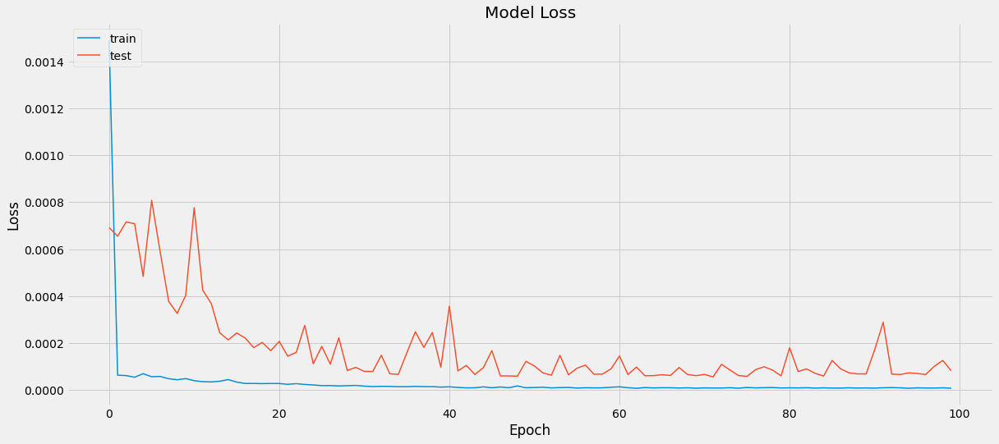

In [26]:
#Plotting loss, it shows that loss has decreased significantly and model trained well
print(history.history.keys())
plt.figure(figsize=(18,8))
plt.plot(history.history['loss'], linewidth=1.5)
plt.plot(history.history['val_loss'], linewidth=1.5)
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# 4. Evaluation

Evaluate our trained LSTM model with the test set and then apply the root mean square error (RMSE) metric to examine the performance of the model.

## 4.1 Model Accuracy

- Apply the model to predict the stock prices based on the Test set.

- Use the inverse_transform method to denormalize the predicted stock prices to original form.

In [27]:
#Do the prediction and check performance metrics
train_predict=model.predict(X_train)
test_predict=model.predict(X_test)

In [28]:
#Transformback to original form
train_predict=scaler.inverse_transform(train_predict) #Ouput of train dataset
test_predict=scaler.inverse_transform(test_predict) #Ouput of test dataset

In [29]:
#Transform y train and y test to ori form
y_trainOri=scaler.inverse_transform(y_train.reshape(-1,1))
y_testOri=scaler.inverse_transform(ytest.reshape(-1,1))

#### i - RMSE Performance 

Apply the RMSE formula to calculate the degree of discrepancy between the predicted prices and real prices (y_test) and display the result.

In [30]:
# Calculate RMSE performance metrics
training_performance_RMSE=math.sqrt(mean_squared_error(y_trainOri,train_predict)) #Train
testing_performance_RMSE=math.sqrt(mean_squared_error(y_testOri,test_predict)) #Test
print(f'Training Performance for RMSE is >> {training_performance_RMSE:.4f}')
print(f'Testing Performance for RMSE is  >> {testing_performance_RMSE:.4f}')

Training Performance for RMSE is >> 0.2550
Testing Performance for RMSE is  >> 0.9429


#### ii - MAPE Performance 

In [31]:
training_performance_MAPE= np.mean(np.abs((train_predict - y_trainOri)/train_predict))*100
testing_performance_MAPE= np.mean(np.abs((test_predict - y_testOri)/test_predict))*100
print(f'Training Performance for MAPE is >> {training_performance_MAPE:.4f}')
print(f'Testing Performance for MAPE is  >> {testing_performance_MAPE:.4f}')

Training Performance for MAPE is >> 4.5295
Testing Performance for MAPE is  >> 1.1464


## 4.2 Visualizing the Predicted Average Prices

Based on the graph below,it is apparently that the line follow the real stock prices closely. As a result, we can say that the LSTM works very well with time series or sequential data.

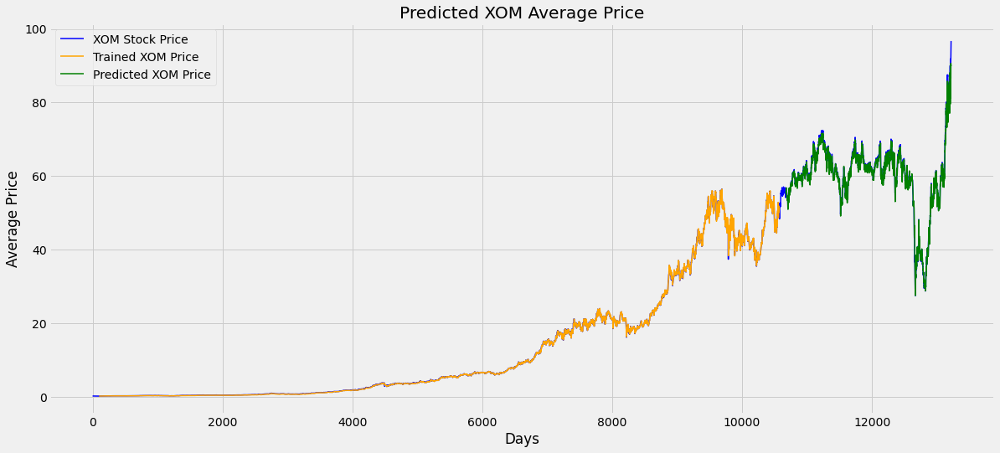

In [33]:
### Plotting 
# shift train predictions for plotting
look_back=100
trainPredictPlot = np.empty_like(XOM_full_ds)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict

# shift test predictions for plotting
testPredictPlot = np.empty_like(XOM_full_ds)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(XOM_full_ds)-1, :] = test_predict

# plot baseline and predictions
plt.figure(figsize=(18,8))
plt.ylabel("Average Price")
plt.xlabel("Days")
plt.title('Predicted XOM Average Price')
plt.plot(scaler.inverse_transform(XOM_full_ds),color = 'blue',label = 'XOM Stock Price',linewidth=1.5)
plt.plot(trainPredictPlot, color = 'orange', label = 'Trained XOM Price',linewidth=1.5 )
plt.plot(testPredictPlot, color = 'green', label = 'Predicted XOM Price',linewidth=1.5 )
plt.legend()
plt.show()

In [34]:
len(test_data) #Based on 100 previous days

2644

In [35]:
#Test data from 2644-100(Prev 100days),so it starts from 2544 day
x_input=test_data[2544:].reshape(1,-1)
x_input.shape

(1, 100)

In [36]:
#Creating list of last 100 data
temp_input=list(x_input)
temp_input=temp_input[0].tolist()

In [37]:
print(len(test_data[2544:]))

100


In [38]:
print(len(temp_input))

100


In [39]:
actual=XOM_full_ds[training_size+101:len(XOM_full_ds),:1]
actual=scaler.inverse_transform(actual)

predict=test_predict

In [40]:
print('   Actual                    Predicted')
print('------------------------------------------------')
for i in range(2543):
    print(f'{actual[i]}  \t\t {predict[i]} ')

   Actual                    Predicted
------------------------------------------------
[55.84280334]  		 [55.665154] 
[55.63694712]  		 [55.72185] 
[56.19898238]  		 [55.748672] 
[56.59434741]  		 [55.399597] 
[55.98986633]  		 [56.358276] 
[56.40321724]  		 [56.43918] 
[56.36074627]  		 [55.551167] 
[56.71687538]  		 [56.647636] 
[56.40484647]  		 [55.992863] 
[56.15487898]  		 [56.791252] 
[55.44906964]  		 [56.008797] 
[55.16643567]  		 [56.00284] 
[54.7236747]  		 [55.027843] 
[54.45409373]  		 [55.047165] 
[54.67294731]  		 [54.396393] 
[54.63511172]  		 [54.293816] 
[54.09060771]  		 [54.665073] 
[53.96559578]  		 [54.41054] 
[54.13339455]  		 [53.8037] 
[54.01494031]  		 [53.943] 
[53.88990633]  		 [54.064693] 
[53.73692705]  		 [53.818584] 
[54.03140843]  		 [53.796448] 
[53.60696987]  		 [53.599823] 
[54.18601193]  		 [54.08617] 
[54.21728028]  		 [53.26944] 
[54.04454862]  		 [54.468872] 
[52.94401321]  		 [53.955048] 
[52.15769877]  		 [53.947044] 
[51.29567959]  		 [52.488

[65.21457415]  		 [64.14013] 
[66.49653768]  		 [64.734436] 
[66.22610821]  		 [64.622375] 
[67.42421035]  		 [66.63473] 
[68.04040133]  		 [65.07778] 
[67.82472689]  		 [67.8423] 
[67.63986177]  		 [67.25018] 
[67.66213992]  		 [67.03048] 
[68.58806761]  		 [67.04713] 
[69.40109002]  		 [66.92847] 
[69.09643405]  		 [68.42267] 
[69.063906]  		 [68.7871] 
[68.54873666]  		 [68.026306] 
[68.22182029]  		 [68.52494] 
[68.22865632]  		 [67.354996] 
[68.6890669]  		 [67.470245] 
[69.02282584]  		 [67.486496] 
[68.35701986]  		 [68.13541] 
[68.50762409]  		 [68.31603] 
[67.92056417]  		 [67.14605] 
[67.75113738]  		 [68.16207] 
[67.76483364]  		 [66.597755] 
[67.61077663]  		 [67.20694] 
[68.00956556]  		 [66.990486] 
[67.43619537]  		 [66.76744] 
[67.35919198]  		 [67.640625] 
[66.34421624]  		 [66.18807] 
[65.39941335]  		 [66.95288] 
[65.09646841]  		 [64.97305] 
[65.32925263]  		 [64.60034] 
[65.19232356]  		 [64.49474] 
[64.35535721]  		 [64.821014] 
[63.32671001]  		 [64.484245] 
[62.

[58.17267232]  		 [58.17794] 
[59.04977816]  		 [57.976456] 
[59.60745365]  		 [57.98679] 
[59.13099255]  		 [59.12684] 
[58.21238589]  		 [59.353912] 
[59.03355324]  		 [58.578693] 
[59.38187344]  		 [57.720932] 
[59.62010145]  		 [59.33763] 
[60.56759168]  		 [58.908012] 
[62.35971378]  		 [59.489468] 
[62.35970432]  		 [60.70173] 
[61.5583962]  		 [62.656265] 
[60.65603259]  		 [61.626755] 
[60.2417753]  		 [61.03669] 
[59.84855018]  		 [60.05399] 
[59.71201112]  		 [59.823223] 
[58.36120996]  		 [59.329926] 
[57.32718238]  		 [59.38555] 
[57.84417812]  		 [57.407253] 
[58.47043476]  		 [56.98244] 
[58.45951404]  		 [57.96077] 
[58.55235879]  		 [58.24844] 
[58.42855531]  		 [58.153267] 
[58.19189884]  		 [58.44332] 
[59.12580901]  		 [58.102036] 
[59.3151583]  		 [57.90998] 
[58.89825321]  		 [59.374058] 
[59.52632631]  		 [58.85366] 
[59.53905552]  		 [58.546066] 
[58.60515947]  		 [59.717358] 
[57.52742228]  		 [59.035385] 
[56.83926737]  		 [58.026203] 
[55.95816723]  		 [57.059

[61.54130991]  		 [61.377186] 
[61.76980244]  		 [61.188644] 
[62.2881822]  		 [61.1453] 
[62.1614651]  		 [61.521915] 
[62.29587764]  		 [62.10608] 
[62.2305881]  		 [61.603443] 
[62.03668043]  		 [62.119205] 
[61.90611639]  		 [61.742577] 
[62.22098758]  		 [61.603523] 
[61.74867183]  		 [61.517624] 
[61.42227586]  		 [62.005375] 
[61.89266341]  		 [61.01787] 
[61.8331506]  		 [61.095486] 
[61.79475997]  		 [61.791035] 
[60.94804386]  		 [61.240555] 
[61.41267571]  		 [61.530773] 
[61.60082463]  		 [60.141987] 
[61.62004373]  		 [61.566853] 
[61.81395326]  		 [61.067047] 
[61.6814706]  		 [61.30414] 
[61.50866903]  		 [61.588913] 
[61.4453242]  		 [61.17206] 
[61.55283043]  		 [61.15998] 
[61.53493321]  		 [61.07752] 
[61.0405761]  		 [61.248096] 
[60.82539707]  		 [61.13599] 
[60.50163909]  		 [60.462] 
[60.28840977]  		 [60.53374] 
[59.5168318]  		 [59.996304] 
[59.31716232]  		 [59.944553] 
[59.23380771]  		 [58.855816] 
[59.54399166]  		 [59.141747] 
[59.47418448]  		 [58.871346]

[63.29462521]  		 [63.448746] 
[61.62581783]  		 [62.438755] 
[62.48568939]  		 [63.209156] 
[62.65073948]  		 [60.087376] 
[63.32519083]  		 [63.146915] 
[64.18506585]  		 [61.730865] 
[64.36234188]  		 [63.39863] 
[65.82738603]  		 [64.041885] 
[65.63380992]  		 [63.796085] 
[63.52284221]  		 [66.28439] 
[64.12800844]  		 [64.49309] 
[62.567202]  		 [62.184948] 
[62.73020204]  		 [64.635635] 
[62.81577408]  		 [60.601963] 
[62.3878829]  		 [63.123154] 
[61.99665006]  		 [62.059616] 
[60.79853204]  		 [61.763683] 
[59.31718722]  		 [61.61688] 
[58.43896193]  		 [59.797016] 
[56.52972143]  		 [58.611736] 
[55.89195218]  		 [57.975323] 
[54.06827376]  		 [55.429092] 
[54.6347271]  		 [55.877502] 
[55.36216645]  		 [53.021896] 
[55.98362904]  		 [55.203266] 
[55.69225798]  		 [55.184982] 
[55.86545145]  		 [56.025833] 
[56.48895971]  		 [55.414436] 
[57.34271953]  		 [55.951523] 
[58.19649233]  		 [56.571514] 
[58.90964923]  		 [57.429077] 
[58.94225334]  		 [58.28237] 
[58.54493151]  		

[35.56789393]  		 [36.458923] 
[35.36751857]  		 [36.308525] 
[35.39678644]  		 [35.59962] 
[35.34275696]  		 [35.54106] 
[34.32510678]  		 [35.510826] 
[34.46019485]  		 [35.425594] 
[33.89283646]  		 [34.35728] 
[33.2827052]  		 [34.702366] 
[33.11159679]  		 [33.94246] 
[33.01929012]  		 [33.42446] 
[33.47633331]  		 [33.29431] 
[33.79377964]  		 [33.14564] 
[33.6001533]  		 [33.618587] 
[32.70183844]  		 [33.86034] 
[32.48795077]  		 [33.667892] 
[31.56036911]  		 [32.79693] 
[30.91196029]  		 [32.693314] 
[30.94798498]  		 [31.663435] 
[31.84630329]  		 [31.110668] 
[31.15511703]  		 [31.153093] 
[31.07406343]  		 [31.963821] 
[30.15999171]  		 [31.180738] 
[29.44628844]  		 [31.264475] 
[30.1644951]  		 [30.289251] 
[30.44817116]  		 [29.607653] 
[30.18926151]  		 [30.388302] 
[31.12359619]  		 [30.476753] 
[31.74948938]  		 [30.274069] 
[31.09882997]  		 [31.241152] 
[31.05154778]  		 [31.747221] 
[30.86018005]  		 [31.131054] 
[30.59225597]  		 [31.217817] 
[30.84216795]  		 [3

[89.57990544]  		 [82.220406] 
[89.77788363]  		 [85.80639] 
[90.03772288]  		 [88.194466] 
[85.98918625]  		 [86.22133] 
[84.40293558]  		 [88.01824] 
[86.22675876]  		 [79.56748] 
[85.50749969]  		 [82.83625] 
[87.87999916]  		 [84.48419] 
[90.22000122]  		 [81.202545] 
[91.85250092]  		 [88.3926] 
[91.47750092]  		 [87.48622] 
[90.36000061]  		 [89.942375] 
[91.94499969]  		 [87.82593] 
[93.46750069]  		 [86.54868] 
[93.58250046]  		 [90.63188] 
[95.47000122]  		 [89.92134] 
[96.71749878]  		 [90.08783] 


# 5. Advanced Analysis

#### Predict for the next 30 days price and compare to the actual 30 days price

In [41]:
#Once get the output will append to the list,then we'll taking the last 100 values to cal next value
lst_output=[] #Predict next 30 days output value
n_steps=100
i=0
while(i<30):
    if(len(temp_input)>100):
        #Shift one position to right and taking new output then putting as input
        x_input=np.array(temp_input[1:]) 
        print("{} day input {}".format(i,x_input))
        x_input=x_input.reshape(1,-1)
        x_input = x_input.reshape((1, n_steps, 1))
        #print(x_input)
        yhat = model.predict(x_input, verbose=0)
        print("{} day output {}".format(i,yhat))
        temp_input.extend(yhat[0].tolist())
        temp_input=temp_input[1:]
        #print(temp_input)
        lst_output.extend(yhat.tolist())
        i=i+1
    else:
        x_input = x_input.reshape((1, n_steps,1)) #reshape
        yhat = model.predict(x_input, verbose=0) #reshape
        print(yhat[0]) #Output
        temp_input.extend(yhat[0].tolist()) #Append to input list
        #print(len(temp_input))
        lst_output.extend(yhat.tolist()) #Add into final output
        i=i+1
    

print(lst_output)

[0.8897919]
1 day input [0.6277018  0.63836074 0.64469033 0.64469032 0.65800819 0.66862016
 0.66605539 0.66989077 0.68523226 0.68871466 0.68666764 0.68000863
 0.67292614 0.69078532 0.70240907 0.70591503 0.7041267  0.70836214
 0.73998629 0.75311597 0.74949232 0.76497503 0.76866916 0.7632573
 0.75358136 0.74670584 0.75372412 0.74913246 0.734977   0.74784774
 0.74515944 0.73516731 0.73909276 0.72862483 0.73107529 0.73326404
 0.73630923 0.75262972 0.76733234 0.76542906 0.78393829 0.81508034
 0.84029851 0.79561955 0.80266158 0.80561164 0.78110716 0.73992545
 0.73523872 0.74420779 0.74858525 0.77085339 0.77532601 0.79276464
 0.79383525 0.79897402 0.78686451 0.77287561 0.79221745 0.78948157
 0.78669799 0.78952913 0.79293115 0.7949534  0.80047284 0.81798276
 0.80530235 0.81588919 0.82114696 0.82940239 0.8401082  0.83537386
 0.83544521 0.83744363 0.81921994 0.77561155 0.78831578 0.79752278
 0.81774489 0.82236026 0.81489004 0.829783   0.85985444 0.86175775
 0.86425578 0.8253341  0.81008426 0.827

8 day output [[0.64460003]]
9 day input [0.68523226 0.68871466 0.68666764 0.68000863 0.67292614 0.69078532
 0.70240907 0.70591503 0.7041267  0.70836214 0.73998629 0.75311597
 0.74949232 0.76497503 0.76866916 0.7632573  0.75358136 0.74670584
 0.75372412 0.74913246 0.734977   0.74784774 0.74515944 0.73516731
 0.73909276 0.72862483 0.73107529 0.73326404 0.73630923 0.75262972
 0.76733234 0.76542906 0.78393829 0.81508034 0.84029851 0.79561955
 0.80266158 0.80561164 0.78110716 0.73992545 0.73523872 0.74420779
 0.74858525 0.77085339 0.77532601 0.79276464 0.79383525 0.79897402
 0.78686451 0.77287561 0.79221745 0.78948157 0.78669799 0.78952913
 0.79293115 0.7949534  0.80047284 0.81798276 0.80530235 0.81588919
 0.82114696 0.82940239 0.8401082  0.83537386 0.83544521 0.83744363
 0.81921994 0.77561155 0.78831578 0.79752278 0.81774489 0.82236026
 0.81489004 0.829783   0.85985444 0.86175775 0.86425578 0.8253341
 0.81008426 0.82761807 0.82070328 0.84351194 0.86600817 0.88170263
 0.87809747 0.86735409 

17 day output [[0.5683424]]
18 day input [0.70836214 0.73998629 0.75311597 0.74949232 0.76497503 0.76866916
 0.7632573  0.75358136 0.74670584 0.75372412 0.74913246 0.734977
 0.74784774 0.74515944 0.73516731 0.73909276 0.72862483 0.73107529
 0.73326404 0.73630923 0.75262972 0.76733234 0.76542906 0.78393829
 0.81508034 0.84029851 0.79561955 0.80266158 0.80561164 0.78110716
 0.73992545 0.73523872 0.74420779 0.74858525 0.77085339 0.77532601
 0.79276464 0.79383525 0.79897402 0.78686451 0.77287561 0.79221745
 0.78948157 0.78669799 0.78952913 0.79293115 0.7949534  0.80047284
 0.81798276 0.80530235 0.81588919 0.82114696 0.82940239 0.8401082
 0.83537386 0.83544521 0.83744363 0.81921994 0.77561155 0.78831578
 0.79752278 0.81774489 0.82236026 0.81489004 0.829783   0.85985444
 0.86175775 0.86425578 0.8253341  0.81008426 0.82761807 0.82070328
 0.84351194 0.86600817 0.88170263 0.87809747 0.86735409 0.8825919
 0.89722886 0.89833444 0.91648043 0.92847358 0.88979191 0.81776857
 0.78687245 0.76342022 0.

25 day output [[0.5492795]]
26 day input [0.74670584 0.75372412 0.74913246 0.734977   0.74784774 0.74515944
 0.73516731 0.73909276 0.72862483 0.73107529 0.73326404 0.73630923
 0.75262972 0.76733234 0.76542906 0.78393829 0.81508034 0.84029851
 0.79561955 0.80266158 0.80561164 0.78110716 0.73992545 0.73523872
 0.74420779 0.74858525 0.77085339 0.77532601 0.79276464 0.79383525
 0.79897402 0.78686451 0.77287561 0.79221745 0.78948157 0.78669799
 0.78952913 0.79293115 0.7949534  0.80047284 0.81798276 0.80530235
 0.81588919 0.82114696 0.82940239 0.8401082  0.83537386 0.83544521
 0.83744363 0.81921994 0.77561155 0.78831578 0.79752278 0.81774489
 0.82236026 0.81489004 0.829783   0.85985444 0.86175775 0.86425578
 0.8253341  0.81008426 0.82761807 0.82070328 0.84351194 0.86600817
 0.88170263 0.87809747 0.86735409 0.8825919  0.89722886 0.89833444
 0.91648043 0.92847358 0.88979191 0.81776857 0.78687245 0.76342022
 0.73278666 0.70816261 0.68622339 0.66403395 0.64460003 0.62870079
 0.615417   0.6042959

In [42]:
day_new=np.arange(1,101)
day_pred=np.arange(101,131) #30days need to predict

### 5.1 Visualizing Testing Data

In [43]:
len(XOM_full_ds)

13219

In [44]:
scaler.inverse_transform(lst_output)

array([[92.69392683],
       [85.20223854],
       [81.98850005],
       [79.54905807],
       [76.36263026],
       [73.80129772],
       [71.5192347 ],
       [69.21114438],
       [67.1896767 ],
       [65.5358771 ],
       [64.15413032],
       [62.99734789],
       [62.05235498],
       [61.28531858],
       [60.64660828],
       [60.10859099],
       [59.65130916],
       [59.25754558],
       [58.9144044 ],
       [58.61226955],
       [58.34300671],
       [58.09972776],
       [57.87620798],
       [57.66705964],
       [57.46775678],
       [57.27467244],
       [57.08520267],
       [56.89761767],
       [56.71092546],
       [56.52487804]])

In [46]:
XOM_full_ds3=XOM_full_ds.tolist()
len(XOM_full_ds3)

13219

In [47]:
print(type(XOM_full_ds3))

<class 'list'>


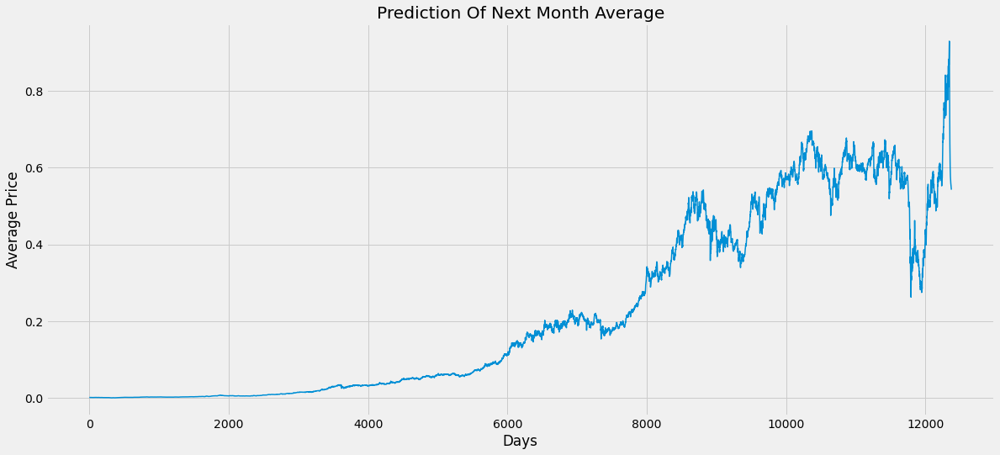

In [48]:
#Fill the upper gap
plt.figure(figsize=(18,8))
plt.ylabel("Average Price")
plt.xlabel("Days")
plt.title("Prediction Of Next Month Average")
XOM_full_ds3.extend(lst_output)
#PLot only 137 days because 1007-907(starting rows)+30days
plt.plot(XOM_full_ds3[877:],linewidth=1.5)

In [49]:
#Creating final data for plotting
final_graph = scaler.inverse_transform(XOM_full_ds3).tolist()

In [50]:
XOM_full_ds_Ori=df.reset_index()['Average'] 

scaler=MinMaxScaler(feature_range=(0,1))
XOM_full_ds_Ori=scaler.fit_transform(np.array(XOM_full_ds_Ori).reshape(-1,1)) #Fit to data, then transform it

In [51]:
print(final_graph[len(final_graph)-1])
print(scaler.inverse_transform(XOM_full_ds_Ori)[-1:])

[56.52487804113554]
[[84.04750061]]


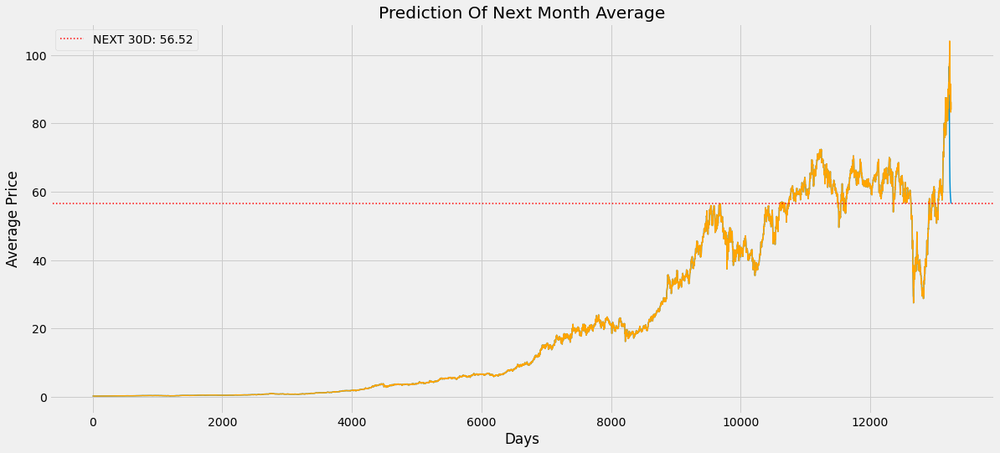

In [52]:
#Plotting final results with predicted value after 30 Days
plt.figure(figsize=(18,8))
plt.plot(final_graph,linewidth=1.5)
plt.plot(scaler.inverse_transform(XOM_full_ds_Ori),linewidth=1.5,color='orange')
plt.ylabel("Average Price")
plt.xlabel("Days")
plt.title("Prediction Of Next Month Average")
plt.axhline(y=final_graph[len(final_graph)-1], color = 'red', linestyle = ':', label = 'NEXT 30D: {0}'.format(round(float(*final_graph[len(final_graph)-1]),2)),linewidth=1.5)
plt.legend()

#### Average Price Comparison Between Predicted and Actual 30 Days Average Price

In [53]:
print('   Actual                    Predicted')
print('------------------------------------------------')
for i in range(30):
    print(f'{XOM_full_ds1_Future[i]}  \t\t {lst_output[i]} ')

   Actual                    Predicted
------------------------------------------------
[0.92823324]  		 [0.8897919058799744] 
[0.93611653]  		 [0.8177685737609863] 
[0.93645301]  		 [0.7868724465370178] 
[0.93563584]  		 [0.7634202241897583] 
[0.94693203]  		 [0.7327866554260254] 
[0.95154661]  		 [0.7081626057624817] 
[0.97442739]  		 [0.6862233877182007] 
[1.]  		 [0.6640339493751526] 
[0.99002573]  		 [0.6446000337600708] 
[0.97334584]  		 [0.6287007927894592] 
[0.92412334]  		 [0.6154170036315918] 
[0.92986758]  		 [0.6042959690093994] 
[0.91369241]  		 [0.5952110290527344] 
[0.88122194]  		 [0.5878369212150574] 
[0.8496888]  		 [0.5816965103149414] 
[0.86656095]  		 [0.5765241384506226] 
[0.84632398]  		 [0.5721279382705688] 
[0.83130247]  		 [0.568342387676239] 
[0.83519603]  		 [0.5650435090065002] 
[0.85079436]  		 [0.5621388554573059] 
[0.87881849]  		 [0.5595502257347107] 
[0.86884423]  		 [0.5572113990783691] 
[0.82555823]  		 [0.5550625324249268] 
[0.83235997]  		 [0.55305

In [54]:
print('   Actual                    Predicted')
print('------------------------------------------------')
for i in range(30):
    print(f'{scaler.inverse_transform(XOM_full_ds1_Future)[i]}  \t\t {scaler.inverse_transform(lst_output)[i]} ')

   Actual                    Predicted
------------------------------------------------
[96.69249916]  		 [92.69392683] 
[97.51249886]  		 [85.20223854] 
[97.5474987]  		 [81.98850005] 
[97.46249962]  		 [79.54905807] 
[98.63750076]  		 [76.36263026] 
[99.1174984]  		 [73.80129772] 
[101.49749947]  		 [71.5192347] 
[104.15749931]  		 [69.21114438] 
[103.12000084]  		 [67.1896767] 
[101.38500023]  		 [65.5358771] 
[96.26499748]  		 [64.15413032] 
[96.86249924]  		 [62.99734789] 
[95.1799984]  		 [62.05235498] 
[91.80249977]  		 [61.28531858] 
[88.52250099]  		 [60.64660828] 
[90.27750015]  		 [60.10859099] 
[88.17250061]  		 [59.65130916] 
[86.61000061]  		 [59.25754558] 
[87.01499939]  		 [58.9144044] 
[88.63749886]  		 [58.61226955] 
[91.55249977]  		 [58.34300671] 
[90.5150013]  		 [58.09972776] 
[86.01249886]  		 [57.87620798] 
[86.71999931]  		 [57.66705964] 
[85.21499825]  		 [57.46775678] 
[83.3200016]  		 [57.27467244] 
[85.84500122]  		 [57.08520267] 
[86.31500053]  		 [56.8976